<a href="https://colab.research.google.com/github/zhaoyu-zhang/PDGM-Geometric_Asian/blob/master/PDGM_geometric_asian.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Functional Feynman-Kac Formula [Dupire (2009)]

Let $x$ be a process given by the SDE 
$$dx_s = \mu(X_s) ds + \sigma(X_s) dw_x.$$

Consider functionals $g :\Lambda_T \longrightarrow R$, $\lambda: \Lambda \longrightarrow R$ and $k:\Lambda \longrightarrow R$ and define the functional $f$ as
$$f(Y_t) = E\left[\left.e^{-\int_t^T \lambda(X_u) du} g(X_T) + \int_t^T e^{-\int_t^s \lambda(X_u) du} k(X_s) ds \ \right| \ Y_t \right],$$
for any path $Y_t \in \Lambda$, $t \in [0,T]$ Thus, if $f \in C^{1,2}$ and $k$, $\lambda$, $\mu$ and $\sigma$ are $\Lambda$-continuous, then $f$ satisfies the Path-dependent Partial Differential Equation (PPDE):
$$
\Delta_t f(Y_t) + \mu(Y_t) \Delta_x f(Y_t)  + \frac{1}{2} \sigma^2(Y_t) \Delta_{xx} f(Y_t) - \lambda(Y_t)f(Y_t) + k(Y_t) = 0,
$$
with $f(Y_T) = g(Y_T)$, for any $Y_t$ in the topological support of $x$.



# Geometric Asian Option

Under Black--Scholes setting, where the spot value follows a Geometric Brownian Motion with constant parameters
$$dx_t = (r - q)x_tdt + \sigma x_t dw_t.$$

Under this model, the price of a geometric Asian optin with maturity $T$ and payoff $g: \Lambda_T \longrightarrow R$ solves the PPDE
$$\begin{cases}
& \Delta_t f(Y_t) + (r - q) y_t \Delta_x f(Y_t) + \displaystyle \frac{1}{2}\sigma^2 y_t^2 \Delta_{xx} f(Y_t) - r f(Y_t) = 0,\\
& f(Y_T) = \left(\exp\left\{\frac{1}{T} \int_0^T \log y_t dt \right\} - K\right)^+.
\end{cases}$$

# Our Method

Approximate $f(X_t)$ using a combination of LSTM network and a feedforward NN, and use finite difference to find gradients. See detail in paper.

In [1]:
"""
    Python 3.5
    Keras 2.2.2
    Tensorflow 1.10.0
"""
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 
from scipy.stats import norm
import tensorflow as tf
import time as ttt
import os
import pprint

import keras.backend as K
from keras.backend.tensorflow_backend import set_session
from keras.models import Sequential
from keras.layers import Dense, Activation,LSTM
from keras.optimizers import Adam
from keras.regularizers import L1L2



Using TensorFlow backend.


In [0]:
# """
#   GPU Setting
# """

# config = tf.ConfigProto()
# config.gpu_options.allow_growth = True  
# config.log_device_placement = True                           
# sess = tf.InteractiveSession(config=config)
# set_session(sess)  # set TensorFlow session as the default session for Keras

In [3]:
"""
  TPU Setting
"""

if 'COLAB_TPU_ADDR' not in os.environ:
  print('ERROR: Not connected to a TPU runtime; please see the first cell in this notebook for instructions!')
else:
  tpu_address = 'grpc://' + os.environ['COLAB_TPU_ADDR']
  print ('TPU address is', tpu_address)

  sess = tf.InteractiveSession(tpu_address)
  devices = sess.list_devices()
  set_session(sess)  # set this TensorFlow session as the default session for Keras
    
  print('TPU devices:')
  pprint.pprint(devices)

TPU address is grpc://10.27.31.178:8470
TPU devices:
[_DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:CPU:0, CPU, -1, 14762909958330882805),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 17179869184, 462957964572775723),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:0, TPU, 17179869184, 10085486658319954278),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:1, TPU, 17179869184, 16000147412213501688),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:2, TPU, 17179869184, 11460382404691129038),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:3, TPU, 17179869184, 18430796646671528555),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:4, TPU, 17179869184, 9012196720889837155),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:5, TPU, 17179869184, 11326359294183226041),
 _DeviceAttributes(/job:tpu_worker/replica:0/task:0/device:TPU:6, TPU, 17179869184, 16829231552

In [0]:
M = 128 # number of samples in a batch
T = 1 # terminal time
dt = 0.01 # detla_t = 0.01, 0.005, 0.002, 0.001
steps = int(T/dt) # number of time steps
r = 0.03
q = 0.01 
sigma = 1
x_0 = 1.0 # X_0 
Strike = 0.4 #Strike Price

In [0]:
def generate_t(T, steps, M = M):
    '''
    time discretization (M * (steps+1 +1)) 
    for computing the time derivative, we need an extra time step.
    '''
    t_temp = np.linspace(1e-6, T- 1e-6, steps +1, dtype = np.float32)
    return np.tile(np.concatenate((t_temp, [T + dt])), (M,1)) # extra after terminal

In [6]:
# for example
t = generate_t(T, steps)[0][0:-1]
print("the length of t is {}".format(len(t)+1))

the length of t is 102


In [0]:
def Create_paths(i, M):
    '''
    GBM paths (M * (steps+1)) with seed i
    number of steps could be 100, 200, 500, 1000.
    '''
    
    # generate time steps for each path
    np.random.seed(i)
    x = np.tile(x_0, (M, 1))
    path = np.tile(x_0, (M, 1))
    delta = T/1000
    
    dW = np.sqrt(delta)*np.random.normal(size=(M, 1000))
    for k in range(1000):
        x += (r-q) * x * delta + sigma * x * dW[:,k:k+1]
        path = np.concatenate((path, x), axis = 1)
        
    #  select # of steps (100, 200, 500, 1000) from total 1000 timesteps
    selection = np.linspace(0,1000, steps+1, dtype = np.int) 
    path = np.array(path, dtype=np.float32)
    path_selection = path[:,selection]

    return np.array(path_selection, dtype=np.float32)

Text(0.5, 0, 'Time')

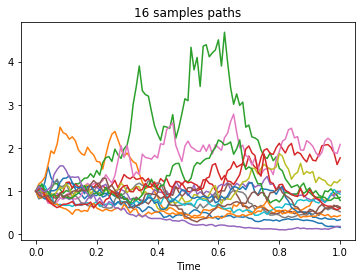

In [8]:
for i in range(16):
    plt.plot(t, Create_paths(100000000, M)[i])
plt.title("16 samples paths")
plt.xlabel("Time")

In [0]:
# input time and path as placeholders
path = tf.placeholder(dtype=tf.float32, shape=[M,steps+1])
time = tf.placeholder(dtype = tf.float32, shape = [M, steps +1 + 1]) # extra after T

## True Solution and Terminal Condition

 A closed-form solution is available in this case:
$$f(Y_t) = e^{-r(T-t)} \left(G_t^{t/T}y_t^{1 - t/T} e^{\bar{\mu} + \bar{\sigma}^2/2} \Phi(d_1) - K\Phi(d_2) \right),$$
where $\Phi$ is the cumulative distribution function of the standard normal,
$$
G_t = \exp\left\{\frac{1}{t} \int_0^t \log y_u du \right\},$$
$$\bar{\mu} = \left(r - q - \frac{\sigma^2}{2}\right)\frac{1}{2T}(T-t)^2,$$
$$\bar{\sigma} = \frac{\sigma}{T} \sqrt{\frac{1}{3}(T-t)^3},$$
$$d_2 = \frac{(t/T) \log G_t + \left(1 - t/T\right) \log y_t + \bar{\mu} - \log K}{\bar{\sigma}},$$
$$d_1 = d_2 + \bar{\sigma}.$$
In the numerical examples below, we fix the strike price to $K = 0.4$. 

In [0]:
def true_solution(apath):
    '''
    Givin a path, it outputs the true solution.
    '''
    G = 1
    mu_bar = (r-q-sigma**2/2)/2/T * (T-t[0])**2
    sigma_bar = sigma/T * np.sqrt(1/3*(T-t[0])**3)
    d_2 = 1/sigma_bar * (t[0]/T * np.log(G) + (1 - t[0]/T) * np.log(apath[0]) + mu_bar - np.log(Strike))
    d_1 = d_2 + sigma_bar
    true_solution = [np.exp(-r*(T - t[0])) * ( G**(t[0]/T) * (apath[0] **(1-t[0]/T)) * np.exp(mu_bar + sigma_bar**2/2) * norm.cdf(d_1) 
                    - Strike * norm.cdf(d_2))]
    
    for k in range(1, steps+1):
        G = np.exp(1/t[k] * np.sum((np.log(apath[1:k+1]) + np.log(apath[:k]) )/2)*dt)
        mu_bar = (r-q-sigma**2/2)/2/T * (T-t[k])**2
        sigma_bar = sigma/T * np.sqrt(1/3*(T-t[k])**3)
        d_2 = 1/sigma_bar * (t[k]/T * np.log(G) + (1 - t[k]/T) * np.log(apath[k]) + mu_bar - np.log(Strike))
        d_1 = d_2 + sigma_bar
        true_solution.append(np.exp(-r*(T - t[k])) * (G**(t[k]/T) * (apath[k] **(1-t[k]/T)) * np.exp(mu_bar + sigma_bar**2/2) * norm.cdf(d_1) 
                        - Strike * norm.cdf(d_2)))

    return true_solution

In [0]:
def terminal_condition(apath):
    '''
    Givin a path, it outputs the terminal condition g(Y_T).
    '''
    
    return np.maximum(np.exp(1/T*sum( (np.log(apath[1:]) + np.log(apath[:-1]) )/2)*dt) - Strike,0)

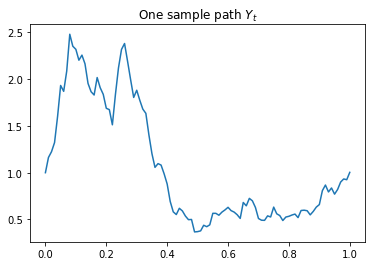

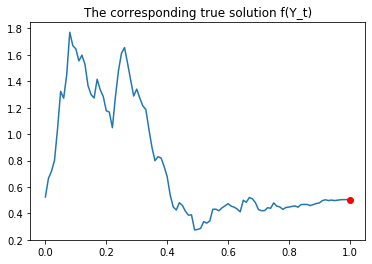

In [12]:
# for example given a GBM path
path1 = Create_paths(100000000, M)[1]
plt.plot(t, path1)
plt.title("One sample path $Y_t$")
plt.show()

plt.plot(t, true_solution(path1))
plt.plot(T, terminal_condition(path1), "ro")
plt.title("The corresponding true solution f(Y_t)")
plt.show()

## Neural Network Setup

The path-dependent function $f(X_t)$ is been approximated by a combination of LSTM and a feedforward neural network.

In [13]:
n_a = 128 # number of hidden neurons in the LSTM network
LSTM_cell = LSTM(n_a, return_state = True) # This is used to capture the long term dependency

# This feedforward neural network is used to compute the derivatives.
# input dimension is (1+1+n_a) = (space, time, path (which is characterized by n_a hidden neurons))
NN = Sequential([
    Dense(128, input_shape=(1+1+n_a,)),
    Activation('tanh'),
    Dense(128),
    Activation('tanh'),
    Dense(128),
    Activation('tanh'),
    Dense(1)
])

## Objective Function

$$
J_{N,M}(\theta) = \frac{1}{M} \frac{1}{N}\sum_{j=1}^M \sum_{i=0}^N \left(\Delta_{t} u(Y^{(j)}_{t_i};\theta) + L u(Y^{(j)}_{t_i};\theta)\right)^2 +  \frac{1}{M}\sum_{j=1}^M \left(u(Y^{(j)}_{t_N}; \theta) - g(Y_{t_N}^{(j)}) \right)^2.
$$

In [0]:
def loss_function(time,path, M):
    
    a = tf.Variable(tf.zeros([M, n_a]), trainable=False)
    c = tf.Variable(tf.zeros([M, n_a]), trainable=False)

##. Approximate f(X_{t_0})
    input_x = K.slice(path, [0,0], [M,1])
    input_t = K.slice(time, [0,0], [M,1])
    inputt_f = K.concatenate([input_x, input_t, a])
    f = NN(inputt_f)
                      
##.   calculate space derivatives
    bump = 0.01 * input_x
    input_x_up = input_x + bump
    inputt_up = K.concatenate([input_x_up, input_t, a])
    f_up = NN(inputt_up)
    input_x_down = input_x - bump
    inputt_down = K.concatenate([input_x_down, input_t, a])
    f_down = NN(inputt_down)
    partial_x_f = (f_up - f)/bump
    partial_xx_f = (f_up - 2*f + f_down)/bump/bump

##. Next LSTM cell
    input_x_reshape = tf.reshape(input_x, (M,1,1))
    input_t_reshape = tf.reshape(input_t, (M,1,1))
    inputt = K.concatenate([input_x_reshape, input_t_reshape])
    a, _, c = LSTM_cell(inputt, initial_state = [a, c])
    
##.   calculate time derivative
    input_t_time = K.slice(time, [0, 1], [M, 1])
    inputt_time = K.concatenate([input_x, input_t_time, a])
    f_flat = NN(inputt_time)
    partial_t_f = (f_flat - f)/dt
    
    Loss = tf.reduce_sum(tf.square(partial_t_f + (r-q)*input_x * partial_x_f + 0.5 * sigma**2 * input_x **2 * partial_xx_f - r * f)) 

    solution = f
    time_derivative = partial_t_f 
    space_derivative = partial_x_f
    space_2nd_derivative = partial_xx_f

    #############################################################################
    for i in range(1, steps+1): # Iterate through every timestep
        
        ##. Approximate f(X_{t_i})
        input_x = K.slice(path, [0,i], [M,1])
        input_t = K.slice(time, [0,i], [M,1])
        inputt_f = K.concatenate([input_x, input_t, a])
        f = NN(inputt_f)
        
        ##. calculate space derivative
        bump = 0.01 * input_x
        input_x_up = input_x + bump
        inputt_up = K.concatenate([input_x_up, input_t, a])
        f_up = NN(inputt_up)
        input_x_down = input_x - bump
        inputt_down = K.concatenate([input_x_down, input_t, a])
        f_down = NN(inputt_down)
        partial_x_f = (f_up - f)/bump
        partial_xx_f = (f_up - 2*f + f_down)/bump/bump
    
        ##. Next LSTM cell
        input_x_reshape = tf.reshape(input_x, (M,1,1))
        input_t_reshape = tf.reshape(input_t, (M,1,1))
        inputt = K.concatenate([input_x_reshape, input_t_reshape])
        a, _, c = LSTM_cell(inputt, initial_state = [a, c])

        ##. calculate time derivative
        input_t_time = K.slice(time, [0, i+1], [M, 1])
        inputt_time = K.concatenate([input_x, input_t_time, a])
        f_flat = NN(inputt_time)
        partial_t_f = (f_flat - f)/dt
        
        Loss += tf.reduce_sum(tf.square(partial_t_f + (r-q) * input_x * partial_x_f + 0.5*sigma**2 * input_x **2 *partial_xx_f - r* f)) 

        solution = K.concatenate([solution, f]) 
        time_derivative = K.concatenate([time_derivative, partial_t_f]) 
        space_derivative = K.concatenate([space_derivative, partial_x_f])
        space_2nd_derivative = K.concatenate([space_2nd_derivative, partial_xx_f])

    #############################################################################
    ##. Terminal cost
    Loss += tf.reduce_sum( tf.square( f - tf.math.maximum(tf.exp(1/T*tf.reduce_sum((tf.log(path[:,1:]) + tf.log(path[:, :-1]))/2 * dt, axis= 1, keepdims=True))- Strike, 0)))*steps

    return Loss/M/steps, solution, time_derivative, space_derivative, space_2nd_derivative

## SGD

In [0]:
Epoch = 15000+1

In [0]:
loss, solution, time_derivative, space_derivative, space_2nd_derivative = loss_function(time, path, M)

In [17]:
global_step = tf.Variable(0, trainable=False)
starter_learning_rate = 0.01
# exponential decay learning rate
learning_rate = tf.maximum(tf.train.exponential_decay(starter_learning_rate, global_step, 50, 0.98, staircase=True), tf.constant(0.00001))
# adam optimizer
optimizer = tf.train.AdamOptimizer(learning_rate = learning_rate)
optimizer = tf.contrib.estimator.clip_gradients_by_norm(optimizer, clip_norm=5.0)
train_op = optimizer.minimize(loss, global_step=global_step)

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


## Training

In [0]:
init = tf.global_variables_initializer()
sess.run(init)

In [0]:
np.random.seed(8)
# GBM
path_test = Create_paths(100000000, M)
time_feed = generate_t(T, steps, M)
pred_dict = {path: path_test, time: time_feed}

train_loss_list = []
test_loss_list = []

1th Epoch:
traing loss is 84.66207885742188, test loss is 84.60501861572266, and learning rate is 0.009999999776482582, elapsed is 39.01260447502136.
 


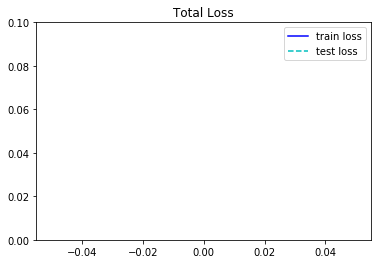

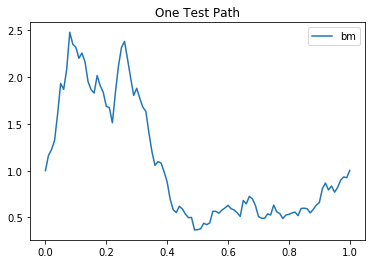

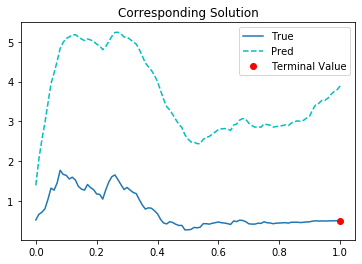

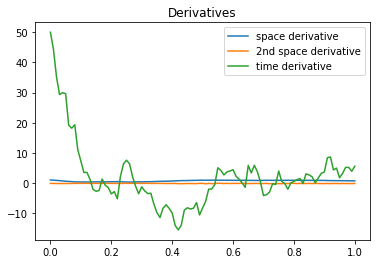

11th Epoch:
traing loss is 0.46921080350875854, test loss is 0.44406890869140625, and learning rate is 0.009999999776482582, elapsed is 12.100550889968872.
 
21th Epoch:
traing loss is 0.1912405788898468, test loss is 0.1602650284767151, and learning rate is 0.009999999776482582, elapsed is 2.9606761932373047.
 
31th Epoch:
traing loss is 0.10561057925224304, test loss is 0.11739112436771393, and learning rate is 0.009999999776482582, elapsed is 3.0450074672698975.
 
41th Epoch:
traing loss is 0.09054793417453766, test loss is 0.10226331651210785, and learning rate is 0.009999999776482582, elapsed is 2.9742538928985596.
 
51th Epoch:
traing loss is 0.10457169264554977, test loss is 0.09029576182365417, and learning rate is 0.009800000116229057, elapsed is 3.0180814266204834.
 
61th Epoch:
traing loss is 0.12227378785610199, test loss is 0.10690470784902573, and learning rate is 0.009800000116229057, elapsed is 3.089252471923828.
 
71th Epoch:
traing loss is 0.08049429953098297, test lo

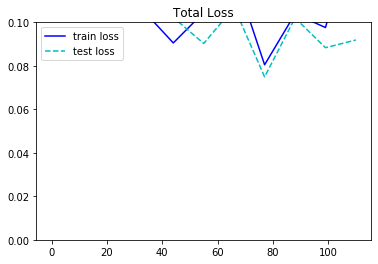

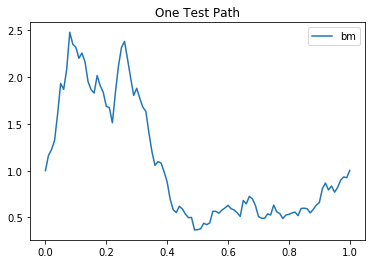

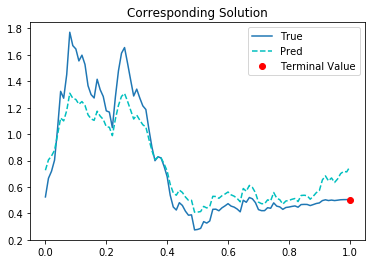

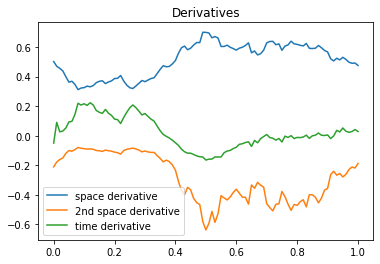

111th Epoch:
traing loss is 0.11011618375778198, test loss is 0.10634177178144455, and learning rate is 0.009604000486433506, elapsed is 3.9983577728271484.
 
121th Epoch:
traing loss is 0.08608138561248779, test loss is 0.08070850372314453, and learning rate is 0.009604000486433506, elapsed is 3.123601198196411.
 
131th Epoch:
traing loss is 0.045655667781829834, test loss is 0.06481418758630753, and learning rate is 0.009604000486433506, elapsed is 3.0094807147979736.
 
141th Epoch:
traing loss is 0.10590299218893051, test loss is 0.11085785925388336, and learning rate is 0.009604000486433506, elapsed is 3.063075304031372.
 
151th Epoch:
traing loss is 0.10541129857301712, test loss is 0.10473129153251648, and learning rate is 0.009411919862031937, elapsed is 3.1635987758636475.
 
161th Epoch:
traing loss is 0.0922241061925888, test loss is 0.08185625821352005, and learning rate is 0.009411919862031937, elapsed is 3.087705373764038.
 
171th Epoch:
traing loss is 0.0743260383605957, t

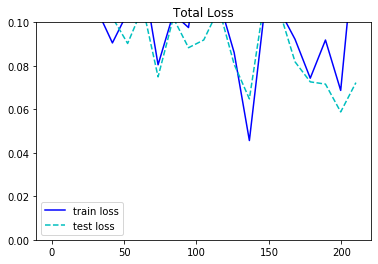

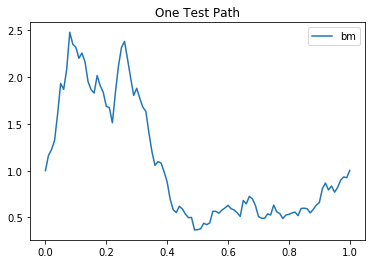

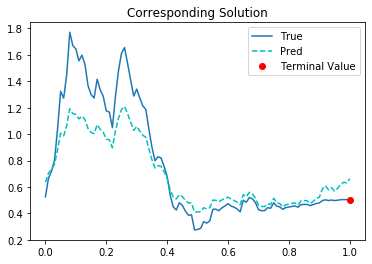

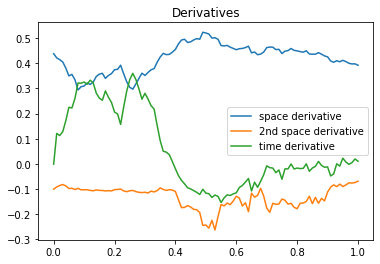

211th Epoch:
traing loss is 0.07304307073354721, test loss is 0.06431138515472412, and learning rate is 0.00922368187457323, elapsed is 4.0316948890686035.
 
221th Epoch:
traing loss is 0.06033444404602051, test loss is 0.05917743593454361, and learning rate is 0.00922368187457323, elapsed is 3.1255440711975098.
 
231th Epoch:
traing loss is 0.053882043808698654, test loss is 0.058416947722435, and learning rate is 0.00922368187457323, elapsed is 3.078179121017456.
 
241th Epoch:
traing loss is 0.062196116894483566, test loss is 0.06191418692469597, and learning rate is 0.00922368187457323, elapsed is 3.0270755290985107.
 
251th Epoch:
traing loss is 0.05439292639493942, test loss is 0.0361931212246418, and learning rate is 0.00903920829296112, elapsed is 3.092405080795288.
 
261th Epoch:
traing loss is 0.053385667502880096, test loss is 0.03455734625458717, and learning rate is 0.00903920829296112, elapsed is 3.0457301139831543.
 
271th Epoch:
traing loss is 0.0326850563287735, test l

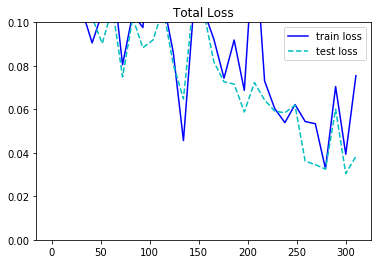

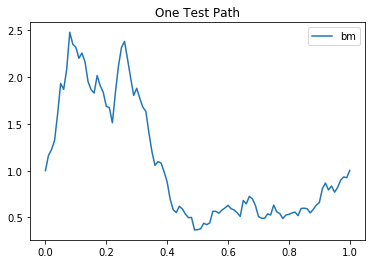

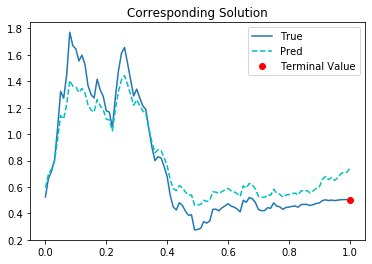

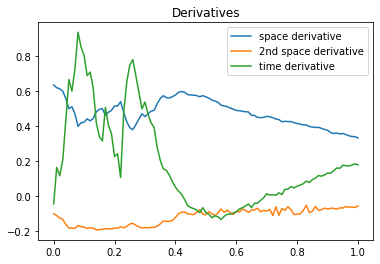

311th Epoch:
traing loss is 0.03381170332431793, test loss is 0.024400055408477783, and learning rate is 0.008858424611389637, elapsed is 3.8948144912719727.
 
321th Epoch:
traing loss is 0.024355951696634293, test loss is 0.017865022644400597, and learning rate is 0.008858424611389637, elapsed is 3.047201633453369.
 
331th Epoch:
traing loss is 0.01780388504266739, test loss is 0.02094743214547634, and learning rate is 0.008858424611389637, elapsed is 3.0224530696868896.
 
341th Epoch:
traing loss is 0.03160648047924042, test loss is 0.03129154443740845, and learning rate is 0.008858424611389637, elapsed is 3.062105417251587.
 
351th Epoch:
traing loss is 0.044045839458703995, test loss is 0.03669213503599167, and learning rate is 0.00868125632405281, elapsed is 3.1108040809631348.
 
361th Epoch:
traing loss is 0.028154335916042328, test loss is 0.018731575459241867, and learning rate is 0.00868125632405281, elapsed is 3.0361523628234863.
 
371th Epoch:
traing loss is 0.01433909870684

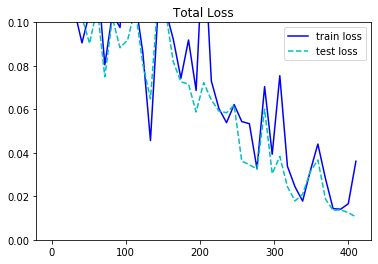

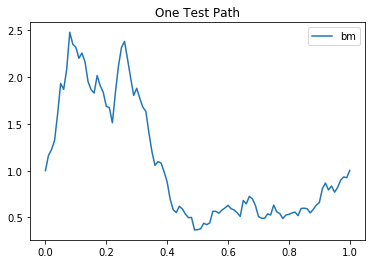

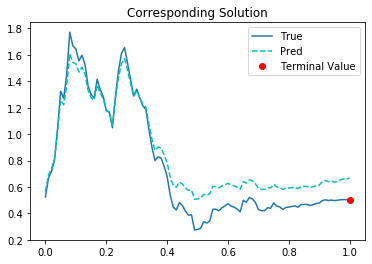

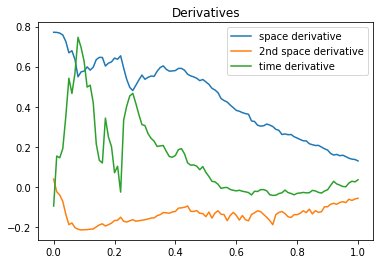

411th Epoch:
traing loss is 0.009814845398068428, test loss is 0.00861534383147955, and learning rate is 0.008507630787789822, elapsed is 3.968012809753418.
 
421th Epoch:
traing loss is 0.027839673683047295, test loss is 0.027449658140540123, and learning rate is 0.008507630787789822, elapsed is 3.061835527420044.
 
431th Epoch:
traing loss is 0.012161940336227417, test loss is 0.01300858985632658, and learning rate is 0.008507630787789822, elapsed is 3.0299360752105713.
 
441th Epoch:
traing loss is 0.02245485782623291, test loss is 0.02408873476088047, and learning rate is 0.008507630787789822, elapsed is 3.1444807052612305.
 
451th Epoch:
traing loss is 0.0128142349421978, test loss is 0.011395702138543129, and learning rate is 0.008337479084730148, elapsed is 3.020745038986206.
 
461th Epoch:
traing loss is 0.016900133341550827, test loss is 0.013244356960058212, and learning rate is 0.008337479084730148, elapsed is 3.0934689044952393.
 
471th Epoch:
traing loss is 0.0228335764259

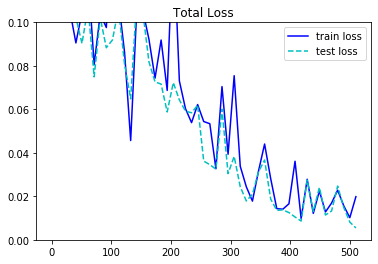

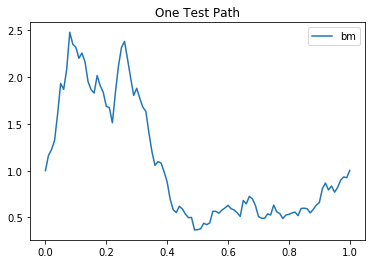

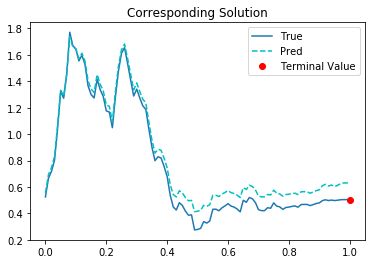

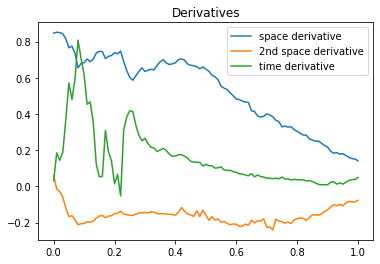

511th Epoch:
traing loss is 0.009556375443935394, test loss is 0.010201910510659218, and learning rate is 0.008170729503035545, elapsed is 3.9472904205322266.
 
521th Epoch:
traing loss is 0.0111152408644557, test loss is 0.010855428874492645, and learning rate is 0.008170729503035545, elapsed is 3.180968999862671.
 
531th Epoch:
traing loss is 0.0033418769016861916, test loss is 0.0032609899062663317, and learning rate is 0.008170729503035545, elapsed is 3.1254281997680664.
 
541th Epoch:
traing loss is 0.007779509760439396, test loss is 0.006574647966772318, and learning rate is 0.008170729503035545, elapsed is 3.0864272117614746.
 
551th Epoch:
traing loss is 0.007701471913605928, test loss is 0.007486597169190645, and learning rate is 0.00800731498748064, elapsed is 3.0283966064453125.
 
561th Epoch:
traing loss is 0.006815012078732252, test loss is 0.005247191525995731, and learning rate is 0.00800731498748064, elapsed is 3.049607992172241.
 
571th Epoch:
traing loss is 0.01645291

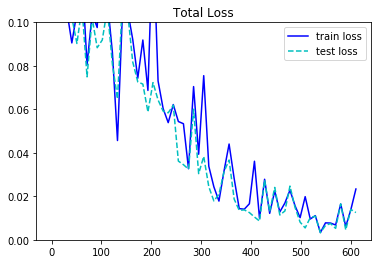

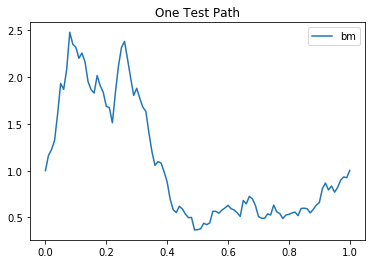

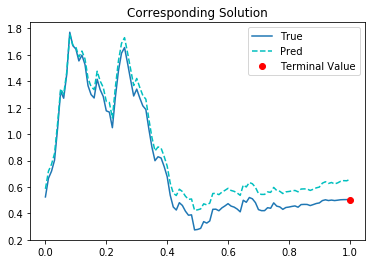

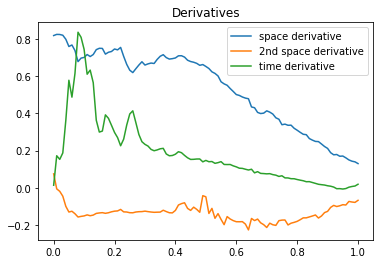

611th Epoch:
traing loss is 0.010086915455758572, test loss is 0.008046713657677174, and learning rate is 0.007847168482840061, elapsed is 3.965756416320801.
 
621th Epoch:
traing loss is 0.013891584239900112, test loss is 0.011206112802028656, and learning rate is 0.007847168482840061, elapsed is 3.0575718879699707.
 
631th Epoch:
traing loss is 0.010198874399065971, test loss is 0.009879709221422672, and learning rate is 0.007847168482840061, elapsed is 3.0117509365081787.
 
641th Epoch:
traing loss is 0.00716280797496438, test loss is 0.0067865848541259766, and learning rate is 0.007847168482840061, elapsed is 3.103684902191162.
 
651th Epoch:
traing loss is 0.010781519114971161, test loss is 0.008787899278104305, and learning rate is 0.007690225727856159, elapsed is 3.0975406169891357.
 
661th Epoch:
traing loss is 0.008867957629263401, test loss is 0.007374798879027367, and learning rate is 0.007690225727856159, elapsed is 3.0100839138031006.
 
671th Epoch:
traing loss is 0.003632

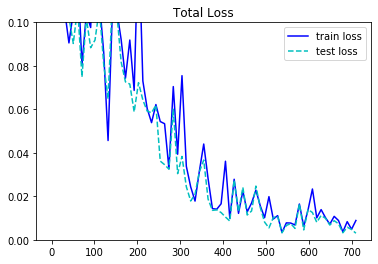

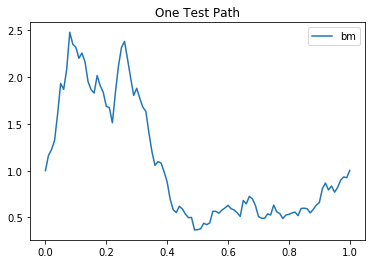

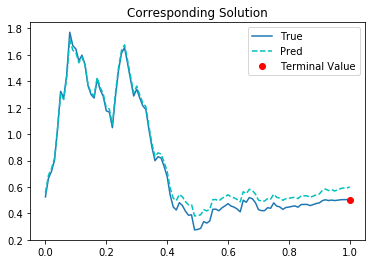

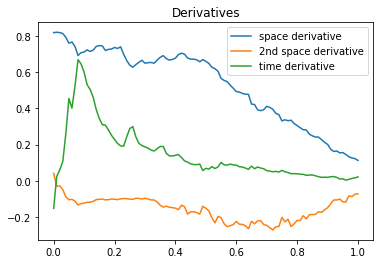

711th Epoch:
traing loss is 0.005702255759388208, test loss is 0.0034732806961983442, and learning rate is 0.007536421064287424, elapsed is 4.0087196826934814.
 
721th Epoch:
traing loss is 0.004584294278174639, test loss is 0.0044006588868796825, and learning rate is 0.007536421064287424, elapsed is 3.063612461090088.
 
731th Epoch:
traing loss is 0.005497845821082592, test loss is 0.005748781841248274, and learning rate is 0.007536421064287424, elapsed is 3.1266746520996094.
 
741th Epoch:
traing loss is 0.010188786312937737, test loss is 0.010784272104501724, and learning rate is 0.007536421064287424, elapsed is 3.0822341442108154.
 
751th Epoch:
traing loss is 0.005694190505892038, test loss is 0.005135614890605211, and learning rate is 0.007385693024843931, elapsed is 3.017425775527954.
 
761th Epoch:
traing loss is 0.008562319912016392, test loss is 0.005643621552735567, and learning rate is 0.007385693024843931, elapsed is 3.114187479019165.
 
771th Epoch:
traing loss is 0.00548

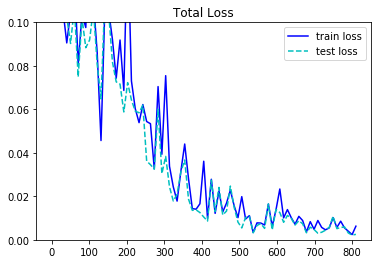

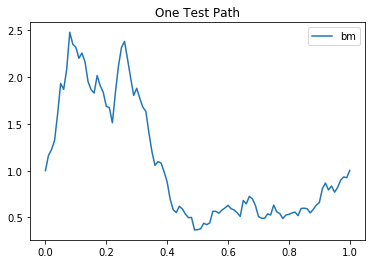

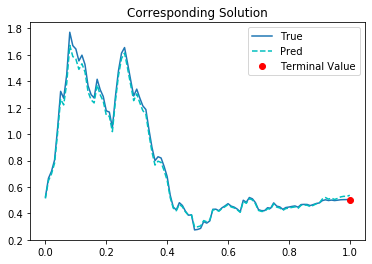

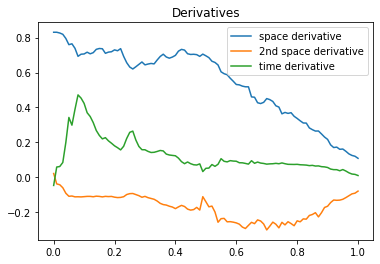

811th Epoch:
traing loss is 0.007853060960769653, test loss is 0.0036208312958478928, and learning rate is 0.007237979210913181, elapsed is 3.9927451610565186.
 
821th Epoch:
traing loss is 0.013470466248691082, test loss is 0.014293625950813293, and learning rate is 0.007237979210913181, elapsed is 3.04306697845459.
 
831th Epoch:
traing loss is 0.005343160592019558, test loss is 0.005256006494164467, and learning rate is 0.007237979210913181, elapsed is 3.0397584438323975.
 
841th Epoch:
traing loss is 0.004318578634411097, test loss is 0.004201287869364023, and learning rate is 0.007237979210913181, elapsed is 3.065976619720459.
 
851th Epoch:
traing loss is 0.005707475822418928, test loss is 0.004755805712193251, and learning rate is 0.007093219552189112, elapsed is 3.021662950515747.
 
861th Epoch:
traing loss is 0.004168103449046612, test loss is 0.002360084094107151, and learning rate is 0.007093219552189112, elapsed is 3.0018551349639893.
 
871th Epoch:
traing loss is 0.0043948

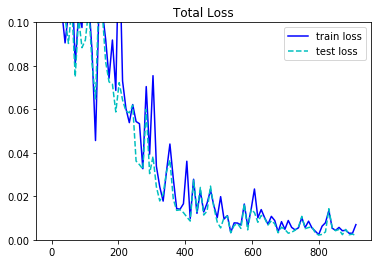

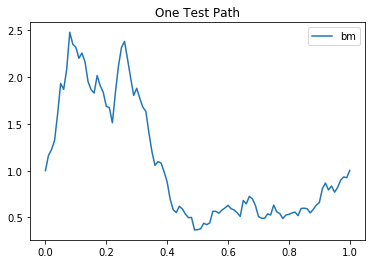

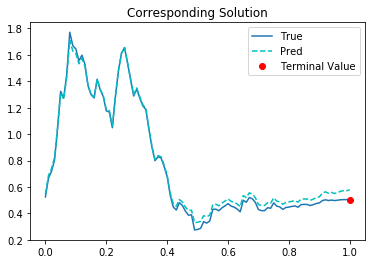

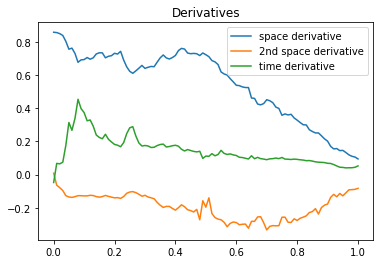

911th Epoch:
traing loss is 0.0022508916445076466, test loss is 0.0013465716037899256, and learning rate is 0.006951355841010809, elapsed is 3.9428489208221436.
 
921th Epoch:
traing loss is 0.0025456841103732586, test loss is 0.002310937037691474, and learning rate is 0.006951355841010809, elapsed is 3.107253074645996.
 
931th Epoch:
traing loss is 0.0038812868297100067, test loss is 0.0033348239958286285, and learning rate is 0.006951355841010809, elapsed is 3.0407235622406006.
 
941th Epoch:
traing loss is 0.005309956148266792, test loss is 0.006403265055269003, and learning rate is 0.006951355841010809, elapsed is 2.954045295715332.
 
951th Epoch:
traing loss is 0.005729391239583492, test loss is 0.004756008740514517, and learning rate is 0.006812328472733498, elapsed is 3.0581164360046387.
 
961th Epoch:
traing loss is 0.011448727920651436, test loss is 0.008102201856672764, and learning rate is 0.006812328472733498, elapsed is 3.07346510887146.
 
971th Epoch:
traing loss is 0.011

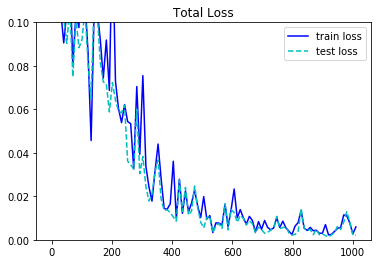

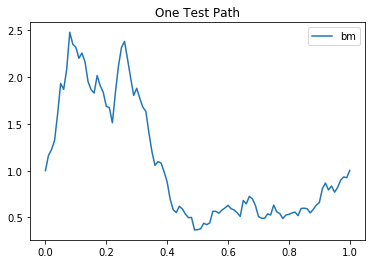

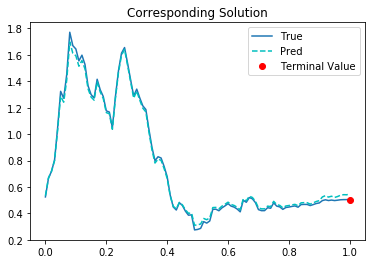

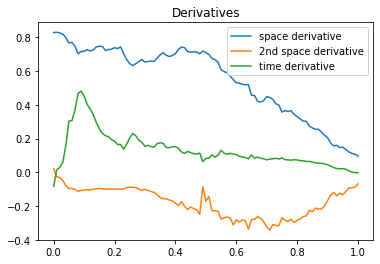

1011th Epoch:
traing loss is 0.0030045374296605587, test loss is 0.0015749306185171008, and learning rate is 0.006676082499325275, elapsed is 4.038870096206665.
 
1021th Epoch:
traing loss is 0.00659715523943305, test loss is 0.006637251004576683, and learning rate is 0.006676082499325275, elapsed is 3.050053596496582.
 
1031th Epoch:
traing loss is 0.0032823814544826746, test loss is 0.003447955707088113, and learning rate is 0.006676082499325275, elapsed is 3.0466859340667725.
 
1041th Epoch:
traing loss is 0.006192763336002827, test loss is 0.006988644599914551, and learning rate is 0.006676082499325275, elapsed is 2.9438321590423584.
 
1051th Epoch:
traing loss is 0.004824972245842218, test loss is 0.00420595146715641, and learning rate is 0.006542561110109091, elapsed is 3.071239709854126.
 
1061th Epoch:
traing loss is 0.01221160776913166, test loss is 0.0066541521809995174, and learning rate is 0.006542561110109091, elapsed is 3.044187545776367.
 
1071th Epoch:
traing loss is 0.

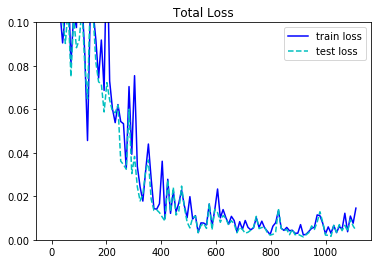

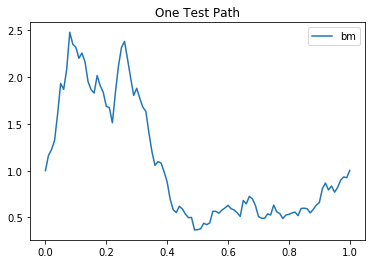

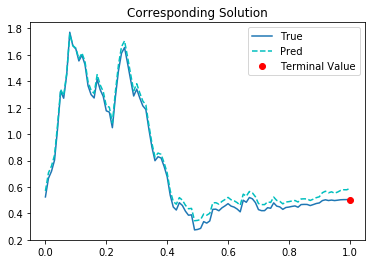

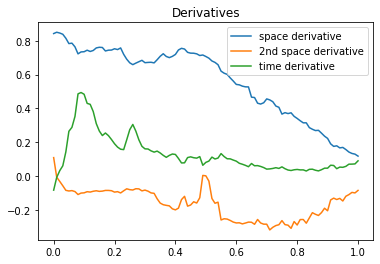

1111th Epoch:
traing loss is 0.005518908146768808, test loss is 0.004063802771270275, and learning rate is 0.006411709822714329, elapsed is 3.9561543464660645.
 
1121th Epoch:
traing loss is 0.006737154442816973, test loss is 0.005983466282486916, and learning rate is 0.006411709822714329, elapsed is 2.9629995822906494.
 
1131th Epoch:
traing loss is 0.0028335859533399343, test loss is 0.003352662781253457, and learning rate is 0.006411709822714329, elapsed is 3.0170071125030518.
 
1141th Epoch:
traing loss is 0.006802571937441826, test loss is 0.006551042664796114, and learning rate is 0.006411709822714329, elapsed is 2.970752000808716.
 
1151th Epoch:
traing loss is 0.004659063648432493, test loss is 0.004179652780294418, and learning rate is 0.006283475551754236, elapsed is 3.097646474838257.
 
1161th Epoch:
traing loss is 0.014214393682777882, test loss is 0.008201668970286846, and learning rate is 0.006283475551754236, elapsed is 3.0549352169036865.
 
1171th Epoch:
traing loss is 

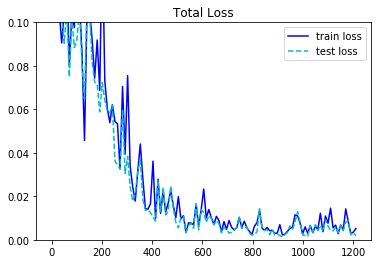

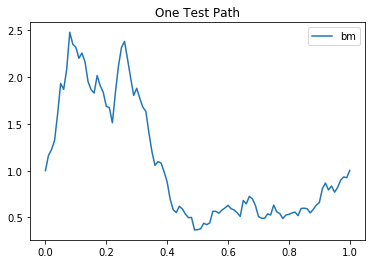

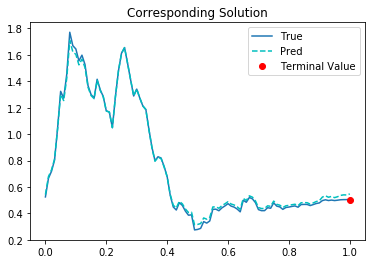

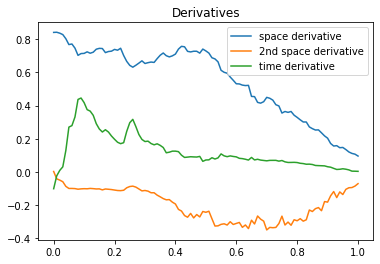

1211th Epoch:
traing loss is 0.004081549122929573, test loss is 0.0033763402607291937, and learning rate is 0.006157805677503347, elapsed is 4.038690090179443.
 
1221th Epoch:
traing loss is 0.0034659483935683966, test loss is 0.002790390281006694, and learning rate is 0.006157805677503347, elapsed is 3.0678749084472656.
 
1231th Epoch:
traing loss is 0.002845368580892682, test loss is 0.0027624606154859066, and learning rate is 0.006157805677503347, elapsed is 3.1098792552948.
 
1241th Epoch:
traing loss is 0.003126339754089713, test loss is 0.003343799849972129, and learning rate is 0.006157805677503347, elapsed is 2.9880504608154297.
 
1251th Epoch:
traing loss is 0.0015088982181623578, test loss is 0.001441791420802474, and learning rate is 0.006034649908542633, elapsed is 3.005995273590088.
 
1261th Epoch:
traing loss is 0.010233468376100063, test loss is 0.007364999502897263, and learning rate is 0.006034649908542633, elapsed is 3.018383026123047.
 
1271th Epoch:
traing loss is 0

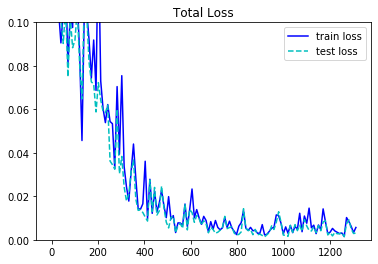

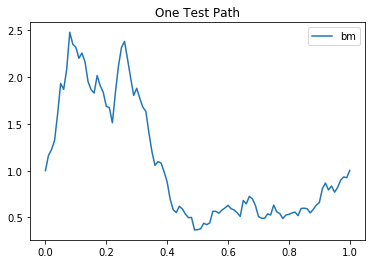

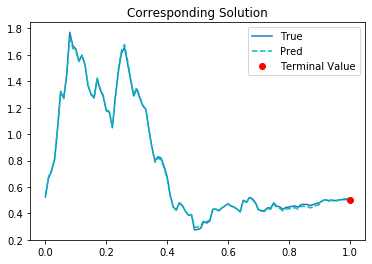

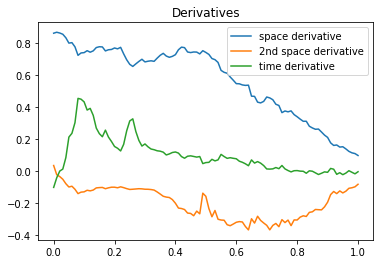

1311th Epoch:
traing loss is 0.00310142757371068, test loss is 0.0026394438464194536, and learning rate is 0.005913957022130489, elapsed is 4.030144929885864.
 
1321th Epoch:
traing loss is 0.001559991156682372, test loss is 0.001555071328766644, and learning rate is 0.005913957022130489, elapsed is 2.9889838695526123.
 
1331th Epoch:
traing loss is 0.0012303938856348395, test loss is 0.0013504248345270753, and learning rate is 0.005913957022130489, elapsed is 3.0562710762023926.
 
1341th Epoch:
traing loss is 0.002365649212151766, test loss is 0.0021028518676757812, and learning rate is 0.005913957022130489, elapsed is 3.1274635791778564.
 
1351th Epoch:
traing loss is 0.004238607361912727, test loss is 0.003757848171517253, and learning rate is 0.005795678589493036, elapsed is 3.0984749794006348.
 
1361th Epoch:
traing loss is 0.017329739406704903, test loss is 0.01249083224684, and learning rate is 0.005795678589493036, elapsed is 3.242190361022949.
 
1371th Epoch:
traing loss is 0.

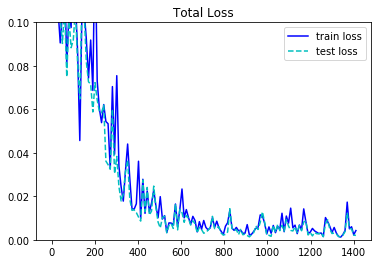

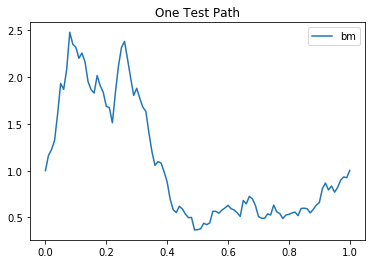

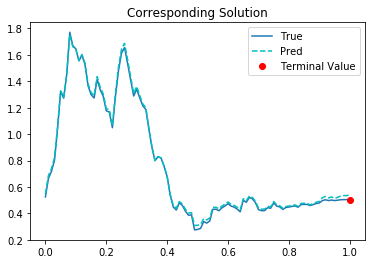

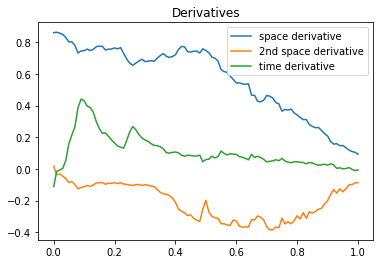

1411th Epoch:
traing loss is 0.0017970765475183725, test loss is 0.0013710373314097524, and learning rate is 0.005679764784872532, elapsed is 4.00521183013916.
 
1421th Epoch:
traing loss is 0.002077588113024831, test loss is 0.0018168764654546976, and learning rate is 0.005679764784872532, elapsed is 3.0153610706329346.
 
1431th Epoch:
traing loss is 0.0018368784803897142, test loss is 0.0019767391495406628, and learning rate is 0.005679764784872532, elapsed is 3.005686044692993.
 
1441th Epoch:
traing loss is 0.003364137839525938, test loss is 0.003671936923637986, and learning rate is 0.005679764784872532, elapsed is 3.0100014209747314.
 
1451th Epoch:
traing loss is 0.002079453319311142, test loss is 0.00181692058686167, and learning rate is 0.005566169507801533, elapsed is 3.0321972370147705.
 
1461th Epoch:
traing loss is 0.00887671671807766, test loss is 0.007223797962069511, and learning rate is 0.005566169507801533, elapsed is 3.1275386810302734.
 
1471th Epoch:
traing loss is

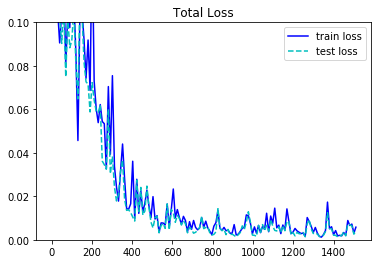

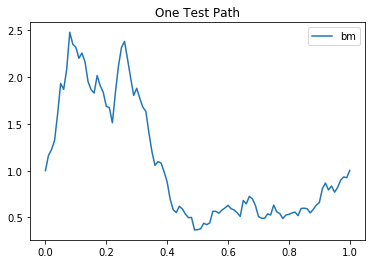

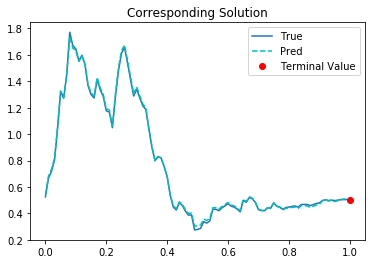

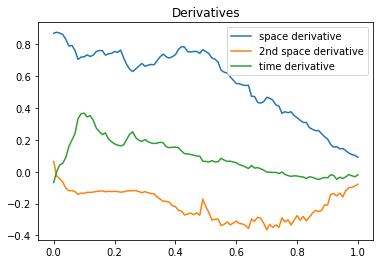

1511th Epoch:
traing loss is 0.002647962886840105, test loss is 0.002035844372585416, and learning rate is 0.005454846657812595, elapsed is 3.9607343673706055.
 
1521th Epoch:
traing loss is 0.0033292346633970737, test loss is 0.003864315105602145, and learning rate is 0.005454846657812595, elapsed is 2.995147705078125.
 
1531th Epoch:
traing loss is 0.0013654815265908837, test loss is 0.0014749583788216114, and learning rate is 0.005454846657812595, elapsed is 3.0220553874969482.
 
1541th Epoch:
traing loss is 0.002877846360206604, test loss is 0.003120971145108342, and learning rate is 0.005454846657812595, elapsed is 2.9612908363342285.
 
1551th Epoch:
traing loss is 0.0016815649578347802, test loss is 0.0016534164315089583, and learning rate is 0.005345749668776989, elapsed is 2.984042167663574.
 
1561th Epoch:
traing loss is 0.007022638339549303, test loss is 0.0059537021443247795, and learning rate is 0.005345749668776989, elapsed is 2.9809823036193848.
 
1571th Epoch:
traing los

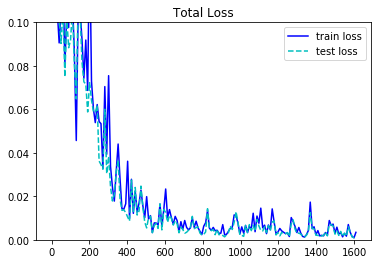

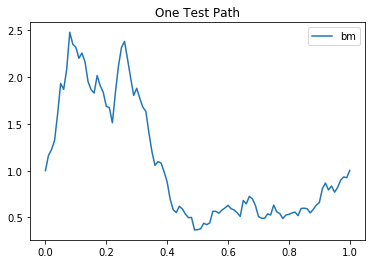

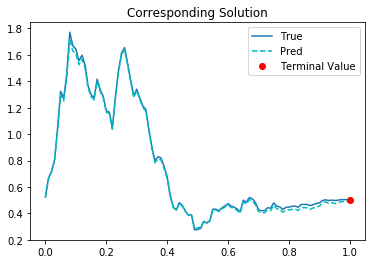

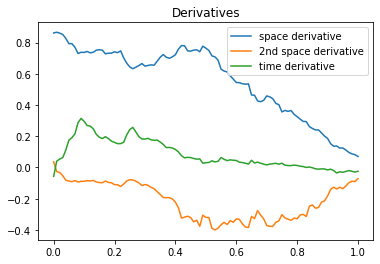

1611th Epoch:
traing loss is 0.0025752848014235497, test loss is 0.0017187756020575762, and learning rate is 0.005238834302872419, elapsed is 4.036626577377319.
 
1621th Epoch:
traing loss is 0.0013359073782339692, test loss is 0.0014957489911466837, and learning rate is 0.005238834302872419, elapsed is 3.0327231884002686.
 
1631th Epoch:
traing loss is 0.0007906437385827303, test loss is 0.0009491575765423477, and learning rate is 0.005238834302872419, elapsed is 3.0181384086608887.
 
1641th Epoch:
traing loss is 0.0023438327480107546, test loss is 0.0020236882846802473, and learning rate is 0.005238834302872419, elapsed is 2.987272024154663.
 
1651th Epoch:
traing loss is 0.0035744505003094673, test loss is 0.003415085608139634, and learning rate is 0.005134057719260454, elapsed is 3.070408344268799.
 
1661th Epoch:
traing loss is 0.004319101572036743, test loss is 0.004123153630644083, and learning rate is 0.005134057719260454, elapsed is 3.001479148864746.
 
1671th Epoch:
traing lo

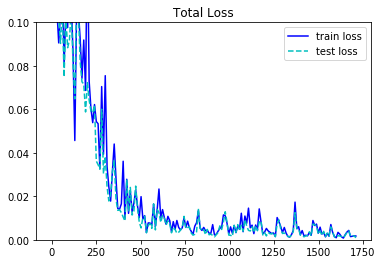

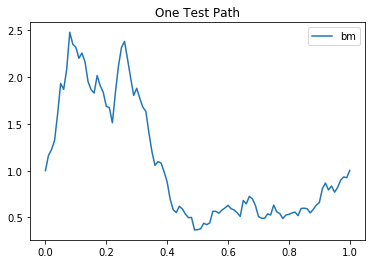

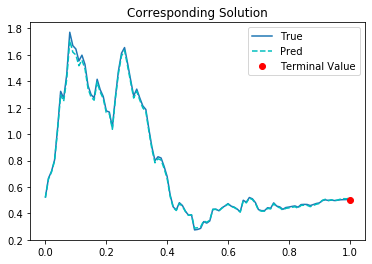

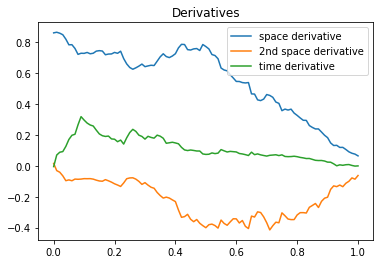

1711th Epoch:
traing loss is 0.0018624758813530207, test loss is 0.001127137802541256, and learning rate is 0.005031377077102661, elapsed is 3.979022979736328.
 
1721th Epoch:
traing loss is 0.0011498953681439161, test loss is 0.0012092252727597952, and learning rate is 0.005031377077102661, elapsed is 2.993335008621216.
 
1731th Epoch:
traing loss is 0.001085592433810234, test loss is 0.0013112957822158933, and learning rate is 0.005031377077102661, elapsed is 3.0872135162353516.
 
1741th Epoch:
traing loss is 0.003029429819434881, test loss is 0.002861452056095004, and learning rate is 0.005031377077102661, elapsed is 3.001593828201294.
 
1751th Epoch:
traing loss is 0.00143859488889575, test loss is 0.0014001545496284962, and learning rate is 0.004930749535560608, elapsed is 3.087437629699707.
 
1761th Epoch:
traing loss is 0.0036614772398024797, test loss is 0.003486165078356862, and learning rate is 0.004930749535560608, elapsed is 3.1001713275909424.
 
1771th Epoch:
traing loss i

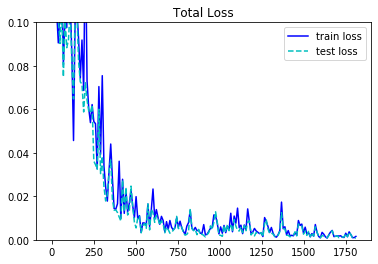

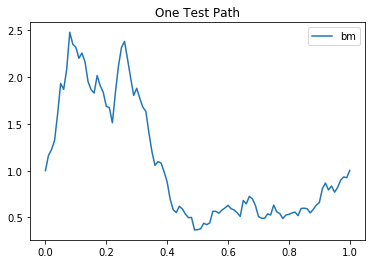

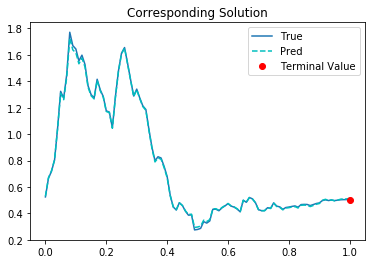

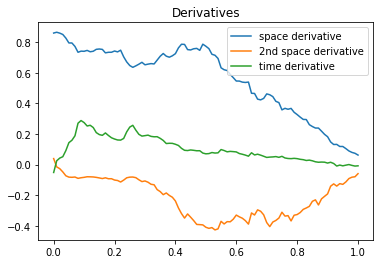

1811th Epoch:
traing loss is 0.0010405922075733542, test loss is 0.0008166424231603742, and learning rate is 0.004832134582102299, elapsed is 4.06852126121521.
 
1821th Epoch:
traing loss is 0.0007294875103980303, test loss is 0.000692568311933428, and learning rate is 0.004832134582102299, elapsed is 3.023020029067993.
 
1831th Epoch:
traing loss is 0.0006502567557618022, test loss is 0.0007529787835665047, and learning rate is 0.004832134582102299, elapsed is 3.0928468704223633.
 
1841th Epoch:
traing loss is 0.0021134763956069946, test loss is 0.0021364435087889433, and learning rate is 0.004832134582102299, elapsed is 2.9736671447753906.
 
1851th Epoch:
traing loss is 0.003279841272160411, test loss is 0.0030248810071498156, and learning rate is 0.004735492169857025, elapsed is 2.9705121517181396.
 
1861th Epoch:
traing loss is 0.004924208391457796, test loss is 0.004409229848533869, and learning rate is 0.004735492169857025, elapsed is 3.0473403930664062.
 
1871th Epoch:
traing lo

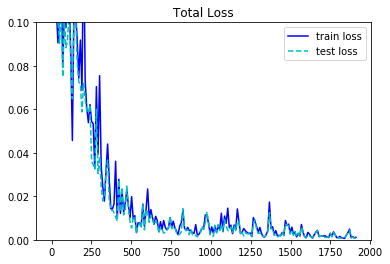

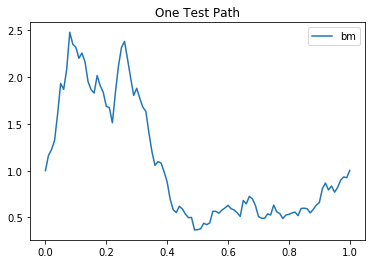

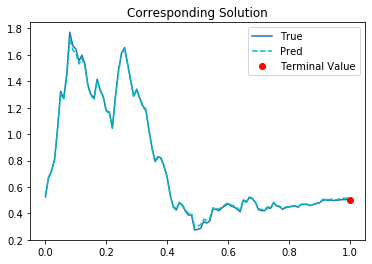

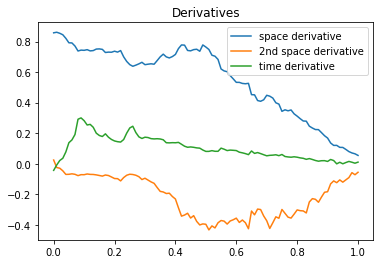

1911th Epoch:
traing loss is 0.0010545895202085376, test loss is 0.0007332325330935419, and learning rate is 0.004640782251954079, elapsed is 3.9965977668762207.
 
1921th Epoch:
traing loss is 0.0007374646374955773, test loss is 0.0007125681731849909, and learning rate is 0.004640782251954079, elapsed is 3.05226731300354.
 
1931th Epoch:
traing loss is 0.0008177891722880304, test loss is 0.0009971120161935687, and learning rate is 0.004640782251954079, elapsed is 3.0289459228515625.
 
1941th Epoch:
traing loss is 0.004145507700741291, test loss is 0.003186540910974145, and learning rate is 0.004640782251954079, elapsed is 3.1063551902770996.
 
1951th Epoch:
traing loss is 0.002334322314709425, test loss is 0.0020536372903734446, and learning rate is 0.0045479666441679, elapsed is 3.0186376571655273.
 
1961th Epoch:
traing loss is 0.0045862565748393536, test loss is 0.0040489425882697105, and learning rate is 0.0045479666441679, elapsed is 3.172732353210449.
 
1971th Epoch:
traing loss 

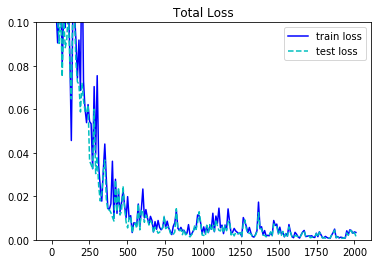

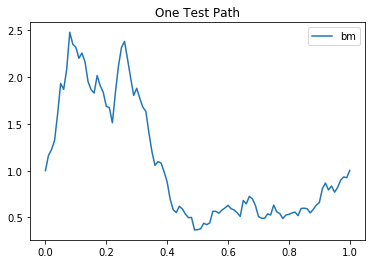

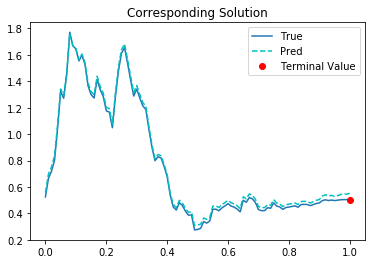

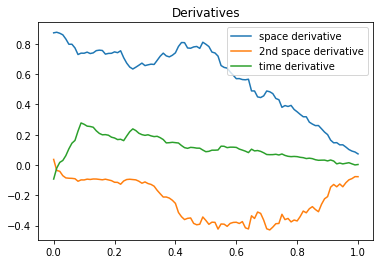

2011th Epoch:
traing loss is 0.0009663946693763137, test loss is 0.0007488819537684321, and learning rate is 0.0044570076279342175, elapsed is 4.131397724151611.
 
2021th Epoch:
traing loss is 0.000894157390575856, test loss is 0.0008995358948595822, and learning rate is 0.0044570076279342175, elapsed is 3.0219321250915527.
 
2031th Epoch:
traing loss is 0.0007438243483193219, test loss is 0.0008699946920387447, and learning rate is 0.0044570076279342175, elapsed is 3.0150070190429688.
 
2041th Epoch:
traing loss is 0.0018643297953531146, test loss is 0.0021507504861801863, and learning rate is 0.0044570076279342175, elapsed is 3.047243118286133.
 
2051th Epoch:
traing loss is 0.000891357020009309, test loss is 0.0009248705464415252, and learning rate is 0.004367867484688759, elapsed is 2.9957826137542725.
 
2061th Epoch:
traing loss is 0.0018012946238741279, test loss is 0.0014568337937816978, and learning rate is 0.004367867484688759, elapsed is 3.0421817302703857.
 
2071th Epoch:
tr

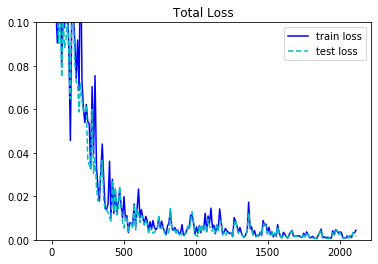

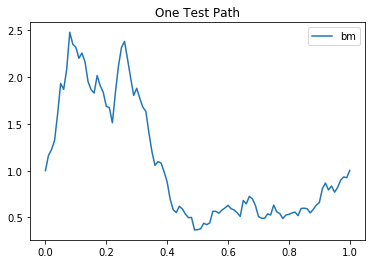

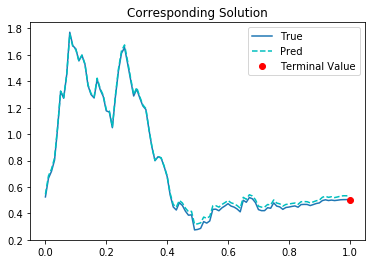

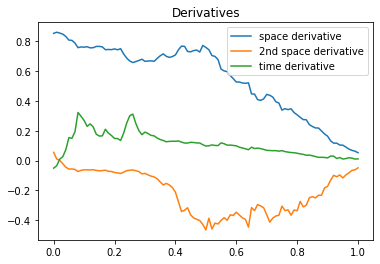

2111th Epoch:
traing loss is 0.005269259680062532, test loss is 0.004603834822773933, and learning rate is 0.004280510358512402, elapsed is 3.912210464477539.
 
2121th Epoch:
traing loss is 0.00291791302151978, test loss is 0.0027207029052078724, and learning rate is 0.004280510358512402, elapsed is 3.077188014984131.
 
2131th Epoch:
traing loss is 0.002140561817213893, test loss is 0.002201796742156148, and learning rate is 0.004280510358512402, elapsed is 3.0534229278564453.
 
2141th Epoch:
traing loss is 0.008610202930867672, test loss is 0.009951218962669373, and learning rate is 0.004280510358512402, elapsed is 3.004051685333252.
 
2151th Epoch:
traing loss is 0.00268154195509851, test loss is 0.002493801526725292, and learning rate is 0.004194899927824736, elapsed is 3.019766092300415.
 
2161th Epoch:
traing loss is 0.0031017803121358156, test loss is 0.0027272275183349848, and learning rate is 0.004194899927824736, elapsed is 3.089916467666626.
 
2171th Epoch:
traing loss is 0.0

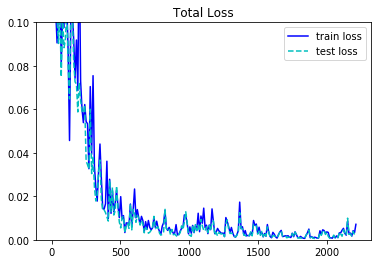

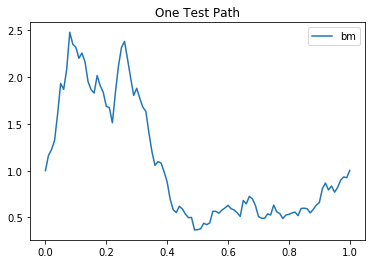

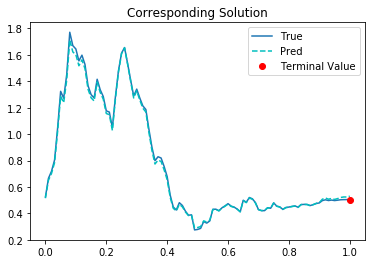

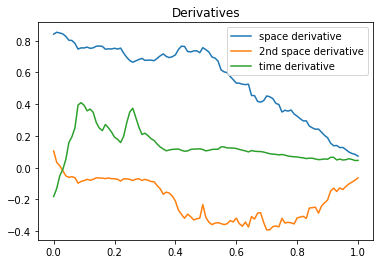

2211th Epoch:
traing loss is 0.0033701329957693815, test loss is 0.0023770281113684177, and learning rate is 0.004111002199351788, elapsed is 4.037075042724609.
 
2221th Epoch:
traing loss is 0.0069239456206560135, test loss is 0.006588997785001993, and learning rate is 0.004111002199351788, elapsed is 3.076941728591919.
 
2231th Epoch:
traing loss is 0.0016167080029845238, test loss is 0.001830193679779768, and learning rate is 0.004111002199351788, elapsed is 3.0600109100341797.
 
2241th Epoch:
traing loss is 0.004784781951457262, test loss is 0.0046225604601204395, and learning rate is 0.004111002199351788, elapsed is 3.0249528884887695.
 
2251th Epoch:
traing loss is 0.001752868527546525, test loss is 0.0018695252947509289, and learning rate is 0.004028782248497009, elapsed is 3.0429558753967285.
 
2261th Epoch:
traing loss is 0.002857040148228407, test loss is 0.001968485303223133, and learning rate is 0.004028782248497009, elapsed is 3.0154361724853516.
 
2271th Epoch:
traing los

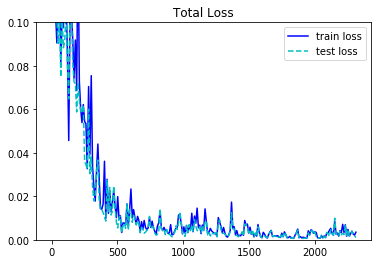

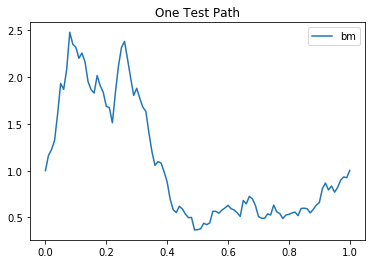

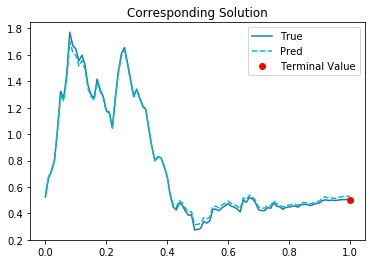

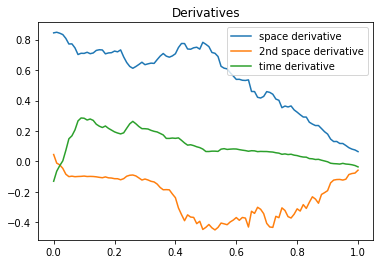

2311th Epoch:
traing loss is 0.0015990687534213066, test loss is 0.001114382641389966, and learning rate is 0.003948206547647715, elapsed is 4.010614633560181.
 
2321th Epoch:
traing loss is 0.0012253528693690896, test loss is 0.0012548657832667232, and learning rate is 0.003948206547647715, elapsed is 3.0975470542907715.
 
2331th Epoch:
traing loss is 0.0008220101008191705, test loss is 0.0010267820907756686, and learning rate is 0.003948206547647715, elapsed is 3.0374059677124023.
 
2341th Epoch:
traing loss is 0.0024826412554830313, test loss is 0.00234013213776052, and learning rate is 0.003948206547647715, elapsed is 3.061769723892212.
 
2351th Epoch:
traing loss is 0.0008159406133927405, test loss is 0.0007765424670651555, and learning rate is 0.003869242500513792, elapsed is 3.064385414123535.
 
2361th Epoch:
traing loss is 0.0017745805671438575, test loss is 0.001293409732170403, and learning rate is 0.003869242500513792, elapsed is 2.9852285385131836.
 
2371th Epoch:
traing lo

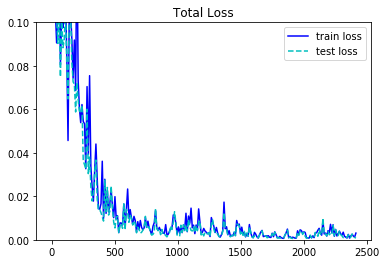

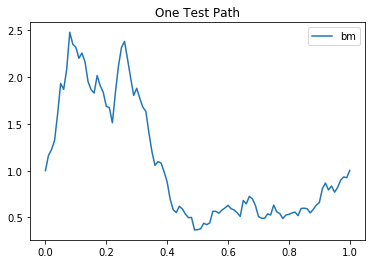

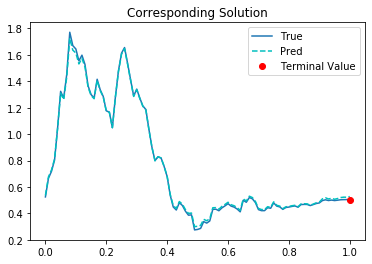

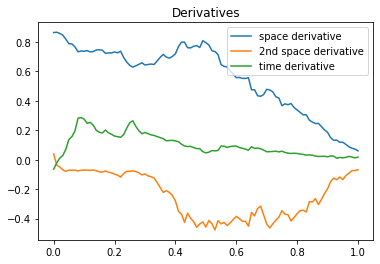

2411th Epoch:
traing loss is 0.0012437256518751383, test loss is 0.0007457656902261078, and learning rate is 0.0037918579764664173, elapsed is 4.101142644882202.
 
2421th Epoch:
traing loss is 0.0007379456656053662, test loss is 0.0007331352680921555, and learning rate is 0.0037918579764664173, elapsed is 3.001455307006836.
 
2431th Epoch:
traing loss is 0.000865480862557888, test loss is 0.0010057708714157343, and learning rate is 0.0037918579764664173, elapsed is 3.0246622562408447.
 
2441th Epoch:
traing loss is 0.0011292872950434685, test loss is 0.0010911681456491351, and learning rate is 0.0037918579764664173, elapsed is 3.074972152709961.
 
2451th Epoch:
traing loss is 0.00047380916657857597, test loss is 0.000479580310638994, and learning rate is 0.0037160206120461226, elapsed is 3.0415279865264893.
 
2461th Epoch:
traing loss is 0.0016686758026480675, test loss is 0.0013533426681533456, and learning rate is 0.0037160206120461226, elapsed is 3.121537685394287.
 
2471th Epoch:
t

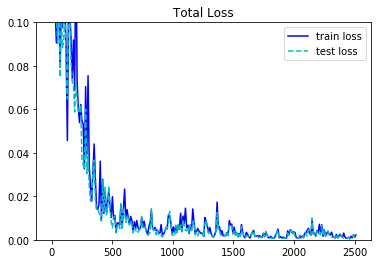

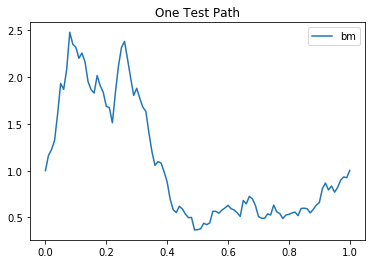

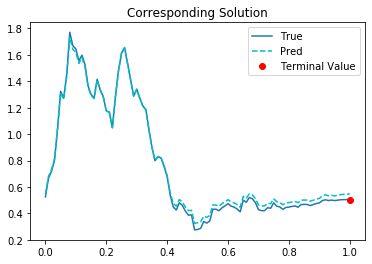

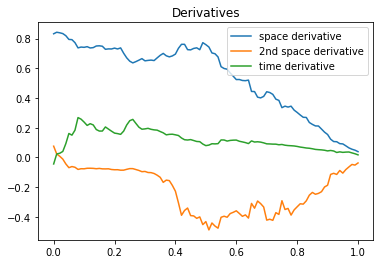

2511th Epoch:
traing loss is 0.0011270764516666532, test loss is 0.000710076536051929, and learning rate is 0.0036417001392692327, elapsed is 4.756381511688232.
 
2521th Epoch:
traing loss is 0.000667878775857389, test loss is 0.0006172156427055597, and learning rate is 0.0036417001392692327, elapsed is 3.038442850112915.
 
2531th Epoch:
traing loss is 0.0007540945080108941, test loss is 0.0009504054323770106, and learning rate is 0.0036417001392692327, elapsed is 3.081073522567749.
 
2541th Epoch:
traing loss is 0.0012935764389112592, test loss is 0.0011789306299760938, and learning rate is 0.0036417001392692327, elapsed is 3.023230791091919.
 
2551th Epoch:
traing loss is 0.0011825382243841887, test loss is 0.0011462155962362885, and learning rate is 0.0035688660573214293, elapsed is 3.071058988571167.
 
2561th Epoch:
traing loss is 0.0017920243553817272, test loss is 0.0015742474934086204, and learning rate is 0.0035688660573214293, elapsed is 3.0737740993499756.
 
2571th Epoch:
tra

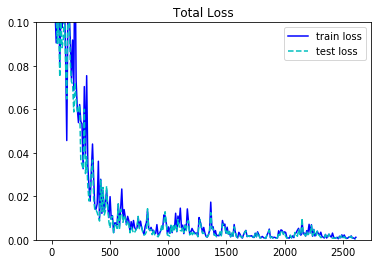

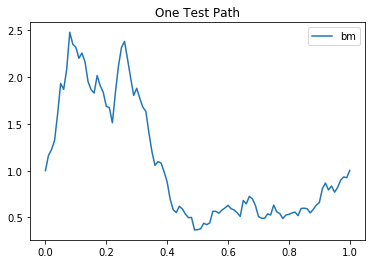

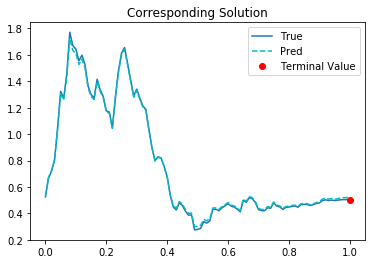

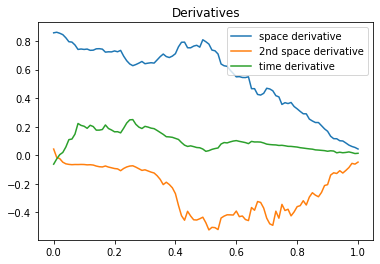

2611th Epoch:
traing loss is 0.0011118323309347034, test loss is 0.00059083744417876, and learning rate is 0.0034974890295416117, elapsed is 4.010617017745972.
 
2621th Epoch:
traing loss is 0.0015851148637011647, test loss is 0.001352406106889248, and learning rate is 0.0034974890295416117, elapsed is 3.151026725769043.
 
2631th Epoch:
traing loss is 0.0005974721862003207, test loss is 0.0006747220177203417, and learning rate is 0.0034974890295416117, elapsed is 3.105433940887451.
 
2641th Epoch:
traing loss is 0.0020903879776597023, test loss is 0.0019890584517270327, and learning rate is 0.0034974890295416117, elapsed is 3.020989179611206.
 
2651th Epoch:
traing loss is 0.0018002813449129462, test loss is 0.0016636807704344392, and learning rate is 0.003427539486438036, elapsed is 3.1565940380096436.
 
2661th Epoch:
traing loss is 0.002192447194829583, test loss is 0.0017485981807112694, and learning rate is 0.003427539486438036, elapsed is 3.0270755290985107.
 
2671th Epoch:
traing

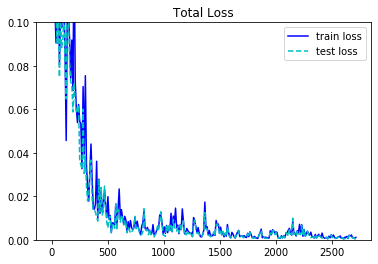

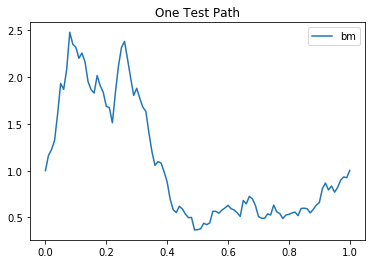

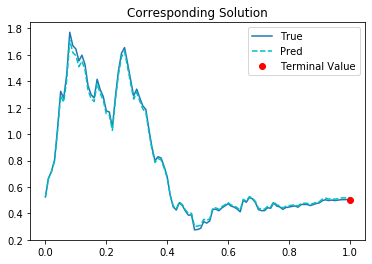

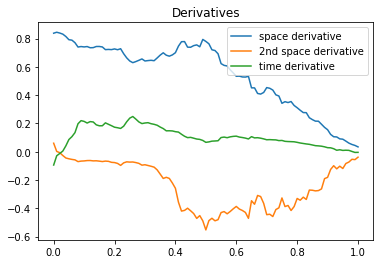

2711th Epoch:
traing loss is 0.0008885642164386809, test loss is 0.000613383948802948, and learning rate is 0.0033589887898415327, elapsed is 3.9945218563079834.
 
2721th Epoch:
traing loss is 0.0011069192551076412, test loss is 0.0009298691875301301, and learning rate is 0.0033589887898415327, elapsed is 3.0489044189453125.
 
2731th Epoch:
traing loss is 0.0004508321871981025, test loss is 0.0005337087786756456, and learning rate is 0.0033589887898415327, elapsed is 3.045253038406372.
 
2741th Epoch:
traing loss is 0.0014735221629962325, test loss is 0.0012907636119052768, and learning rate is 0.0033589887898415327, elapsed is 3.0760104656219482.
 
2751th Epoch:
traing loss is 0.0011415196349844337, test loss is 0.0010701861465349793, and learning rate is 0.0032918090000748634, elapsed is 3.0003550052642822.
 
2761th Epoch:
traing loss is 0.002726578852161765, test loss is 0.002174215391278267, and learning rate is 0.0032918090000748634, elapsed is 3.098527193069458.
 
2771th Epoch:
t

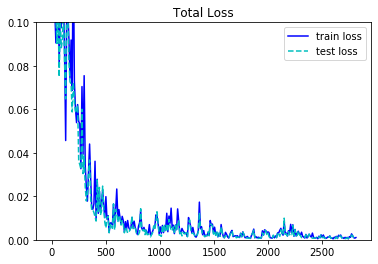

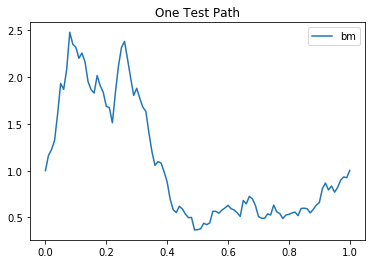

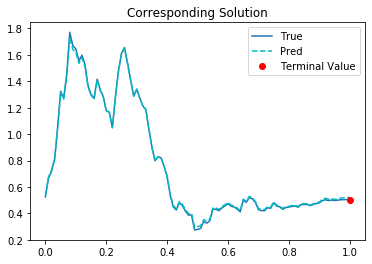

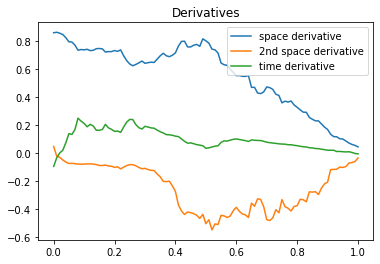

2811th Epoch:
traing loss is 0.0010685102315619588, test loss is 0.0005207006470300257, and learning rate is 0.0032259728759527206, elapsed is 4.045900106430054.
 
2821th Epoch:
traing loss is 0.0013167799916118383, test loss is 0.001113027916289866, and learning rate is 0.0032259728759527206, elapsed is 3.048325777053833.
 
2831th Epoch:
traing loss is 0.00047039685887284577, test loss is 0.0005463141133077443, and learning rate is 0.0032259728759527206, elapsed is 3.043388605117798.
 
2841th Epoch:
traing loss is 0.004181291908025742, test loss is 0.0039436365477740765, and learning rate is 0.0032259728759527206, elapsed is 3.0939009189605713.
 
2851th Epoch:
traing loss is 0.0019752010703086853, test loss is 0.001694757491350174, and learning rate is 0.003161453641951084, elapsed is 2.988999605178833.
 
2861th Epoch:
traing loss is 0.002287520095705986, test loss is 0.0018523865146562457, and learning rate is 0.003161453641951084, elapsed is 3.073237895965576.
 
2871th Epoch:
traing

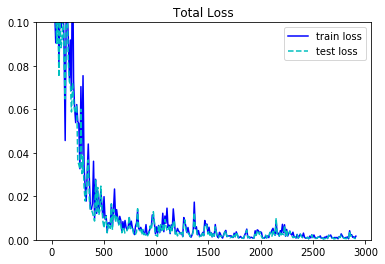

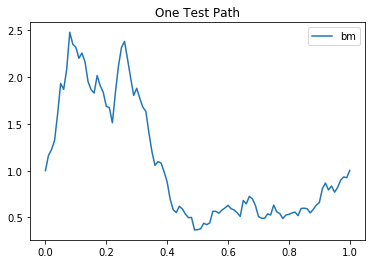

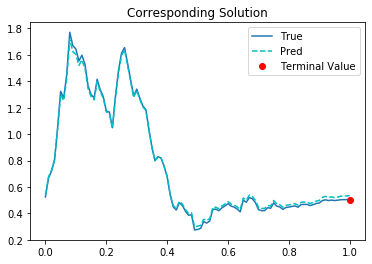

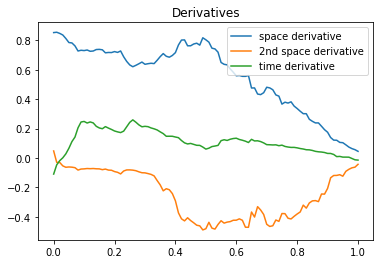

2911th Epoch:
traing loss is 0.0007920082425698638, test loss is 0.0006588817923329771, and learning rate is 0.00309822428971529, elapsed is 4.084644794464111.
 
2921th Epoch:
traing loss is 0.0008351809810847044, test loss is 0.0007000303012318909, and learning rate is 0.00309822428971529, elapsed is 3.072321653366089.
 
2931th Epoch:
traing loss is 0.00041075667832046747, test loss is 0.00047121764509938657, and learning rate is 0.00309822428971529, elapsed is 3.1187000274658203.
 
2941th Epoch:
traing loss is 0.0011850550072267652, test loss is 0.0011905829887837172, and learning rate is 0.00309822428971529, elapsed is 2.998777389526367.
 
2951th Epoch:
traing loss is 0.0013120555086061358, test loss is 0.0013263931032270193, and learning rate is 0.0030362599063664675, elapsed is 3.1183724403381348.
 
2961th Epoch:
traing loss is 0.002662396989762783, test loss is 0.0019076609751209617, and learning rate is 0.0030362599063664675, elapsed is 3.00566029548645.
 
2971th Epoch:
traing l

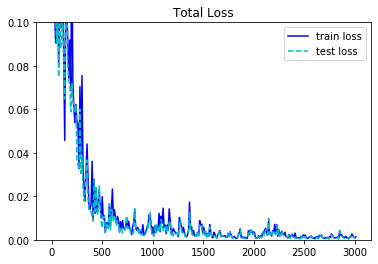

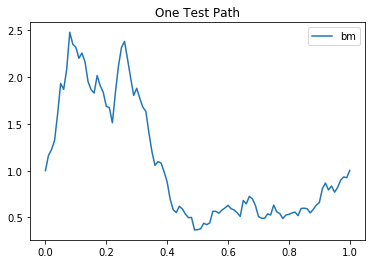

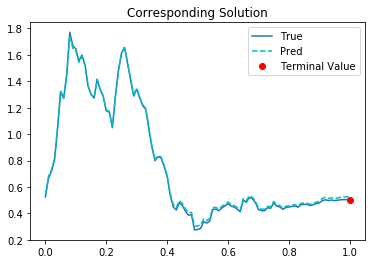

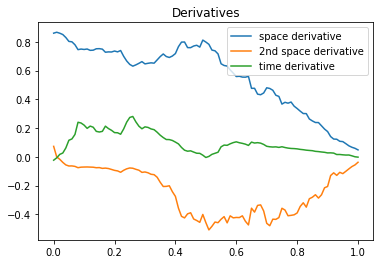

3011th Epoch:
traing loss is 0.0011750453850254416, test loss is 0.0008498847018927336, and learning rate is 0.0029755346477031708, elapsed is 4.150257349014282.
 
3021th Epoch:
traing loss is 0.0014667629729956388, test loss is 0.0013457202585414052, and learning rate is 0.0029755346477031708, elapsed is 3.0637900829315186.
 
3031th Epoch:
traing loss is 0.0005308391409926116, test loss is 0.00064394052606076, and learning rate is 0.0029755346477031708, elapsed is 3.0691795349121094.
 
3041th Epoch:
traing loss is 0.002223557559773326, test loss is 0.0021602942142635584, and learning rate is 0.0029755346477031708, elapsed is 3.0248727798461914.
 
3051th Epoch:
traing loss is 0.0008277875604107976, test loss is 0.0007031139102764428, and learning rate is 0.00291602429933846, elapsed is 3.0320324897766113.
 
3061th Epoch:
traing loss is 0.0013583899708464742, test loss is 0.0007745350594632328, and learning rate is 0.00291602429933846, elapsed is 3.034142017364502.
 
3071th Epoch:
train

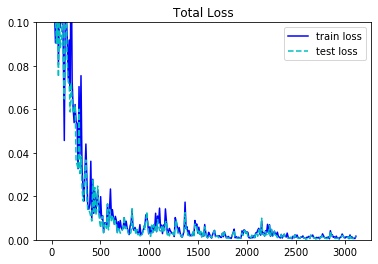

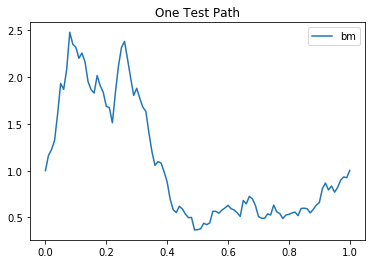

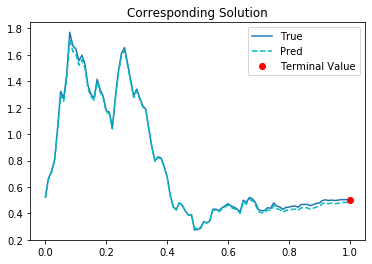

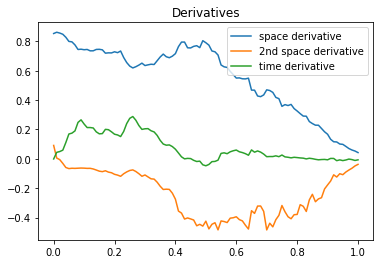

3111th Epoch:
traing loss is 0.0009377406095154583, test loss is 0.0006573458085767925, and learning rate is 0.0028577037155628204, elapsed is 4.065654039382935.
 
3121th Epoch:
traing loss is 0.0005964968004263937, test loss is 0.0005971499485895038, and learning rate is 0.0028577037155628204, elapsed is 3.078622579574585.
 
3131th Epoch:
traing loss is 0.000480563729070127, test loss is 0.0005261572077870369, and learning rate is 0.0028577037155628204, elapsed is 3.054926872253418.
 
3141th Epoch:
traing loss is 0.0006088617956265807, test loss is 0.0005675303982570767, and learning rate is 0.0028577037155628204, elapsed is 3.1021134853363037.
 
3151th Epoch:
traing loss is 0.0006350042531266809, test loss is 0.0006215222529135644, and learning rate is 0.0028005498461425304, elapsed is 3.0293209552764893.
 
3161th Epoch:
traing loss is 0.001198513200506568, test loss is 0.0010328295174986124, and learning rate is 0.0028005498461425304, elapsed is 3.023768424987793.
 
3171th Epoch:
tr

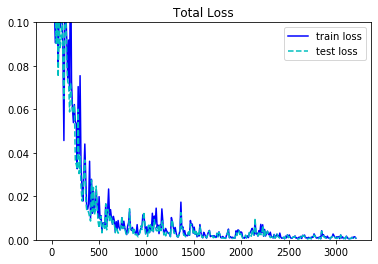

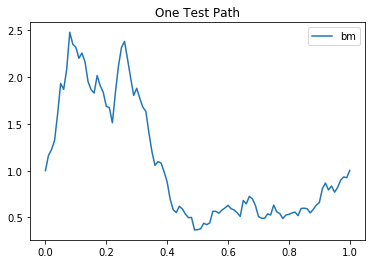

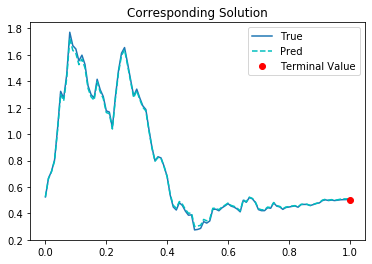

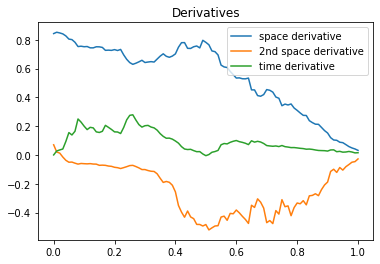

3211th Epoch:
traing loss is 0.0006566053489223123, test loss is 0.00042501359712332487, and learning rate is 0.0027445387095212936, elapsed is 4.040509462356567.
 
3221th Epoch:
traing loss is 0.0006818894762545824, test loss is 0.0006157933967188001, and learning rate is 0.0027445387095212936, elapsed is 3.097353219985962.
 
3231th Epoch:
traing loss is 0.0002655652933754027, test loss is 0.0003196742618456483, and learning rate is 0.0027445387095212936, elapsed is 3.069611072540283.
 
3241th Epoch:
traing loss is 0.001152370939962566, test loss is 0.0012621600180864334, and learning rate is 0.0027445387095212936, elapsed is 3.1124606132507324.
 
3251th Epoch:
traing loss is 0.00046049317461438477, test loss is 0.00042130055953748524, and learning rate is 0.002689648186787963, elapsed is 3.1425201892852783.
 
3261th Epoch:
traing loss is 0.0006838847766630352, test loss is 0.0004018935433123261, and learning rate is 0.002689648186787963, elapsed is 3.161210060119629.
 
3271th Epoch:


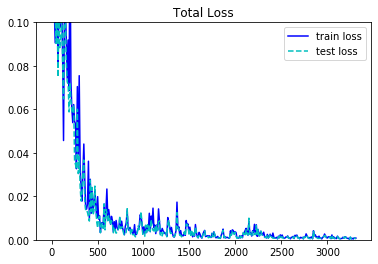

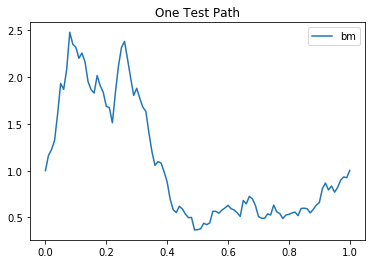

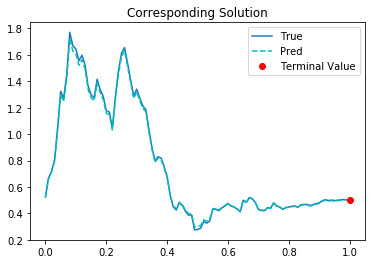

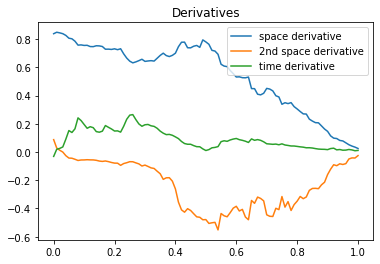

3311th Epoch:
traing loss is 0.0004960626247338951, test loss is 0.0003555406292434782, and learning rate is 0.0026358552277088165, elapsed is 3.9900240898132324.
 
3321th Epoch:
traing loss is 0.0009081336902454495, test loss is 0.0007594877970404923, and learning rate is 0.0026358552277088165, elapsed is 3.047522783279419.
 
3331th Epoch:
traing loss is 0.0002563372254371643, test loss is 0.0003424003953114152, and learning rate is 0.0026358552277088165, elapsed is 3.0346503257751465.
 
3341th Epoch:
traing loss is 0.0007397404406219721, test loss is 0.0006573798600584269, and learning rate is 0.0026358552277088165, elapsed is 3.0745491981506348.
 
3351th Epoch:
traing loss is 0.0007365011842921376, test loss is 0.0007316356641240418, and learning rate is 0.002583137946203351, elapsed is 3.017967939376831.
 
3361th Epoch:
traing loss is 0.0007173587218858302, test loss is 0.0006325691938400269, and learning rate is 0.002583137946203351, elapsed is 3.013678550720215.
 
3371th Epoch:
t

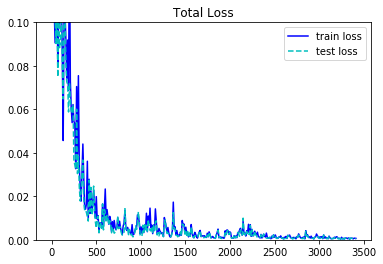

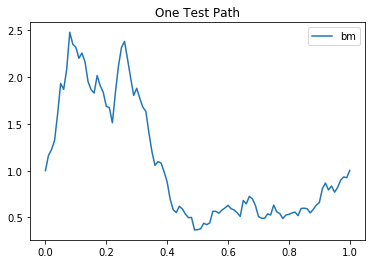

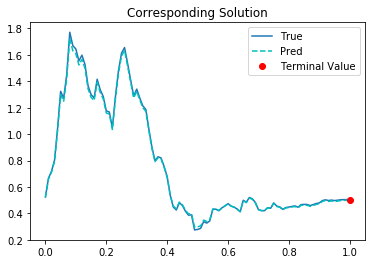

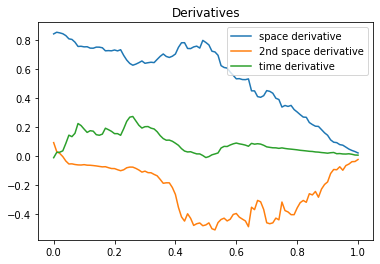

3411th Epoch:
traing loss is 0.0005301933269947767, test loss is 0.0003035813570022583, and learning rate is 0.0025314753875136375, elapsed is 4.0122902393341064.
 
3421th Epoch:
traing loss is 0.0005582452286034822, test loss is 0.00042088492773473263, and learning rate is 0.0025314753875136375, elapsed is 3.047006368637085.
 
3431th Epoch:
traing loss is 0.00019291738863103092, test loss is 0.000258799729635939, and learning rate is 0.0025314753875136375, elapsed is 3.019582986831665.
 
3441th Epoch:
traing loss is 0.0010168537264689803, test loss is 0.0008510152692906559, and learning rate is 0.0025314753875136375, elapsed is 3.0699217319488525.
 
3451th Epoch:
traing loss is 0.0006354995421133935, test loss is 0.000652564107440412, and learning rate is 0.0024808458983898163, elapsed is 3.131420612335205.
 
3461th Epoch:
traing loss is 0.001177661819383502, test loss is 0.0008337112958543003, and learning rate is 0.0024808458983898163, elapsed is 2.9874584674835205.
 
3471th Epoch:


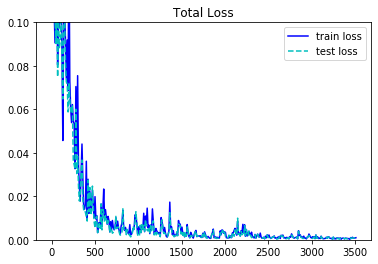

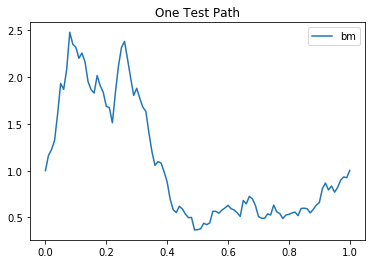

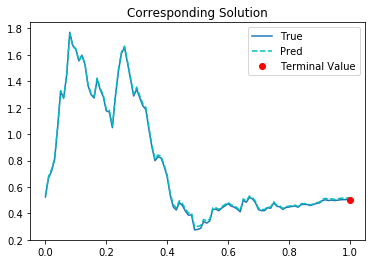

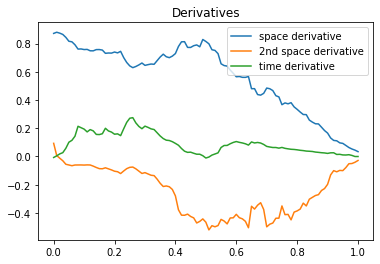

3511th Epoch:
traing loss is 0.0007528469432145357, test loss is 0.0005294802249409258, and learning rate is 0.0024312292225658894, elapsed is 3.9567739963531494.
 
3521th Epoch:
traing loss is 0.0009736461215652525, test loss is 0.0008916815277189016, and learning rate is 0.0024312292225658894, elapsed is 3.0396370887756348.
 
3531th Epoch:
traing loss is 0.000259023392572999, test loss is 0.0003085738862864673, and learning rate is 0.0024312292225658894, elapsed is 3.0218136310577393.
 
3541th Epoch:
traing loss is 0.000442714081145823, test loss is 0.0003950884856749326, and learning rate is 0.0024312292225658894, elapsed is 3.033738613128662.
 
3551th Epoch:
traing loss is 0.0002085809683194384, test loss is 0.00021692279551643878, and learning rate is 0.0023826046381145716, elapsed is 3.023162841796875.
 
3561th Epoch:
traing loss is 0.00033964356407523155, test loss is 0.00025455388822592795, and learning rate is 0.0023826046381145716, elapsed is 3.1018834114074707.
 
3571th Epoc

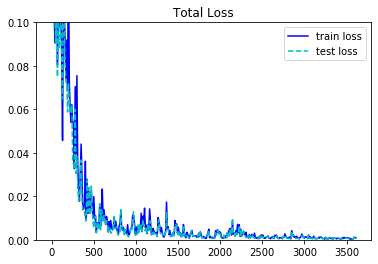

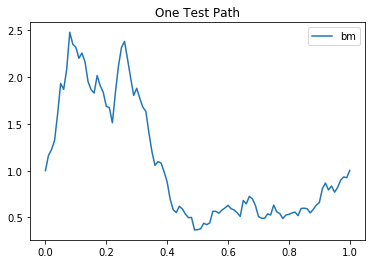

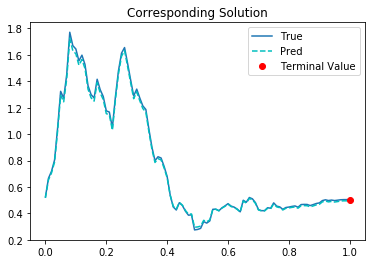

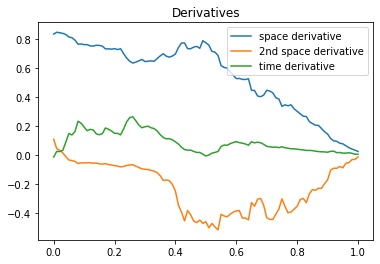

3611th Epoch:
traing loss is 0.00045518833212554455, test loss is 0.00029579646070487797, and learning rate is 0.0023349523544311523, elapsed is 3.9460880756378174.
 
3621th Epoch:
traing loss is 0.00037844976759515703, test loss is 0.0003133745049126446, and learning rate is 0.0023349523544311523, elapsed is 3.072021484375.
 
3631th Epoch:
traing loss is 0.00019502815848682076, test loss is 0.00025590320001356304, and learning rate is 0.0023349523544311523, elapsed is 3.0901637077331543.
 
3641th Epoch:
traing loss is 0.0005846984568051994, test loss is 0.00054056232329458, and learning rate is 0.0023349523544311523, elapsed is 3.019104242324829.
 
3651th Epoch:
traing loss is 0.0005898186936974525, test loss is 0.0005895612412132323, and learning rate is 0.0022882535122334957, elapsed is 3.1140458583831787.
 
3661th Epoch:
traing loss is 0.0009572884300723672, test loss is 0.0007336764829233289, and learning rate is 0.0022882535122334957, elapsed is 3.083123207092285.
 
3671th Epoch:

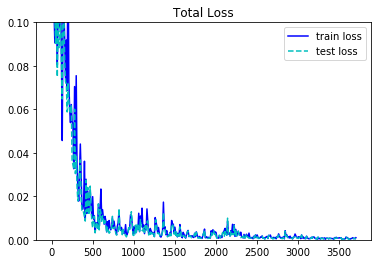

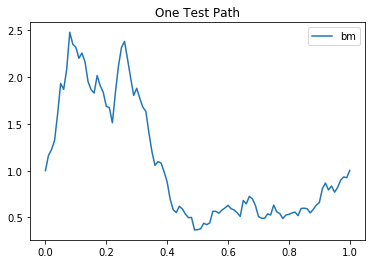

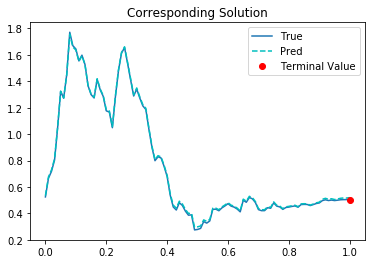

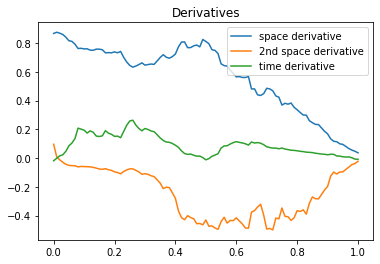

3711th Epoch:
traing loss is 0.0005522890714928508, test loss is 0.0003871543158311397, and learning rate is 0.0022424885537475348, elapsed is 4.108013391494751.
 
3721th Epoch:
traing loss is 0.0007329157087951899, test loss is 0.0006866691983304918, and learning rate is 0.0022424885537475348, elapsed is 3.1127192974090576.
 
3731th Epoch:
traing loss is 0.000355030526407063, test loss is 0.0004263616865500808, and learning rate is 0.0022424885537475348, elapsed is 3.0943472385406494.
 
3741th Epoch:
traing loss is 0.0006748961750417948, test loss is 0.0005954528460279107, and learning rate is 0.0022424885537475348, elapsed is 3.0529963970184326.
 
3751th Epoch:
traing loss is 0.0003677853965200484, test loss is 0.00032583734719082713, and learning rate is 0.0021976386196911335, elapsed is 3.0653038024902344.
 
3761th Epoch:
traing loss is 0.0006381577113643289, test loss is 0.00040585032547824085, and learning rate is 0.0021976386196911335, elapsed is 3.0509583950042725.
 
3771th Epo

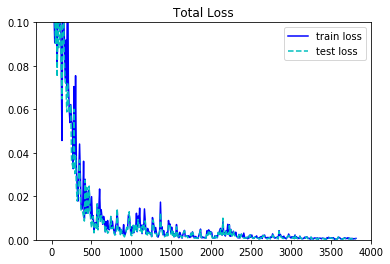

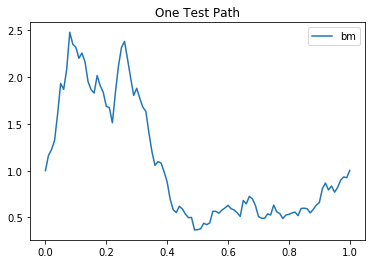

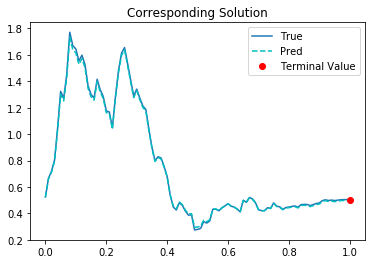

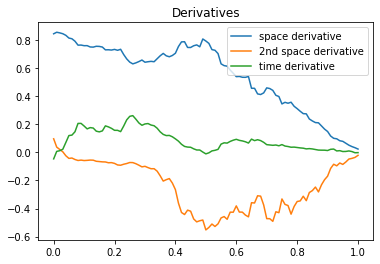

3811th Epoch:
traing loss is 0.0003382669237907976, test loss is 0.00023808307014405727, and learning rate is 0.0021536860149353743, elapsed is 4.088227987289429.
 
3821th Epoch:
traing loss is 0.0006108818924985826, test loss is 0.0004788423248101026, and learning rate is 0.0021536860149353743, elapsed is 3.105555534362793.
 
3831th Epoch:
traing loss is 0.00016363500617444515, test loss is 0.0002190284722018987, and learning rate is 0.0021536860149353743, elapsed is 3.1098108291625977.
 
3841th Epoch:
traing loss is 0.0012006788747385144, test loss is 0.0008914864738471806, and learning rate is 0.0021536860149353743, elapsed is 3.055027723312378.
 
3851th Epoch:
traing loss is 0.0005534301162697375, test loss is 0.0006461297743953764, and learning rate is 0.0021106123458594084, elapsed is 3.0185258388519287.
 
3861th Epoch:
traing loss is 0.0015990572283044457, test loss is 0.0007668753387406468, and learning rate is 0.0021106123458594084, elapsed is 3.0264575481414795.
 
3871th Epoc

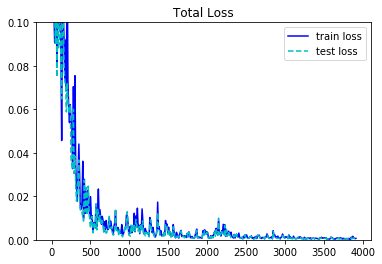

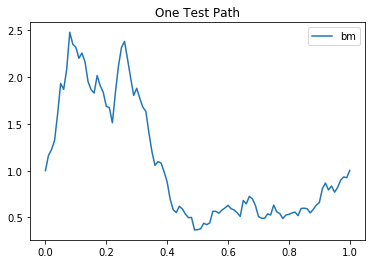

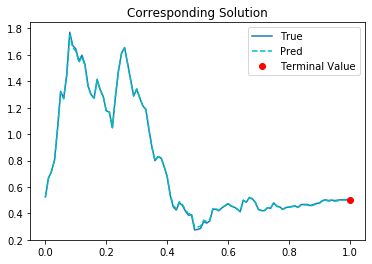

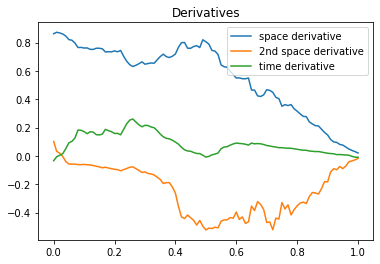

3911th Epoch:
traing loss is 0.0006667355191893876, test loss is 0.0003089202509727329, and learning rate is 0.002068400150164962, elapsed is 4.003230810165405.
 
3921th Epoch:
traing loss is 0.0005920691764913499, test loss is 0.0004412894486449659, and learning rate is 0.002068400150164962, elapsed is 3.0112369060516357.
 
3931th Epoch:
traing loss is 0.00015018924023024738, test loss is 0.00019236281514167786, and learning rate is 0.002068400150164962, elapsed is 3.037400960922241.
 
3941th Epoch:
traing loss is 0.0005590195651166141, test loss is 0.0003943643532693386, and learning rate is 0.002068400150164962, elapsed is 3.053537607192993.
 
3951th Epoch:
traing loss is 0.0008033945923671126, test loss is 0.0007301855948753655, and learning rate is 0.002027032198384404, elapsed is 3.0252554416656494.
 
3961th Epoch:
traing loss is 0.0012847190955653787, test loss is 0.0010823761112987995, and learning rate is 0.002027032198384404, elapsed is 3.0696027278900146.
 
3971th Epoch:
tra

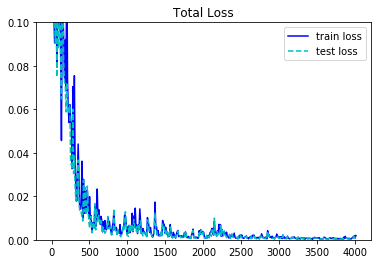

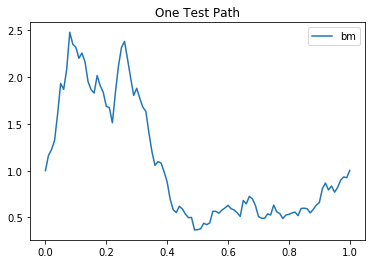

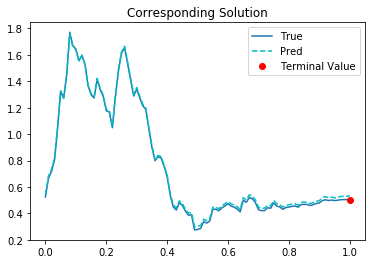

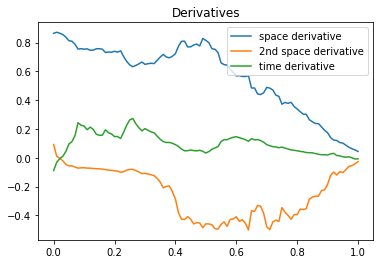

4011th Epoch:
traing loss is 0.0009122813935391605, test loss is 0.0006714969058521092, and learning rate is 0.0019864917267113924, elapsed is 4.105265855789185.
 
4021th Epoch:
traing loss is 0.0007810076931491494, test loss is 0.0007006805972196162, and learning rate is 0.0019864917267113924, elapsed is 3.069523811340332.
 
4031th Epoch:
traing loss is 0.0003452491364441812, test loss is 0.000386109109967947, and learning rate is 0.0019864917267113924, elapsed is 3.008434534072876.
 
4041th Epoch:
traing loss is 0.001243304810486734, test loss is 0.0010545566910877824, and learning rate is 0.0019864917267113924, elapsed is 3.1008381843566895.
 
4051th Epoch:
traing loss is 0.0011252091499045491, test loss is 0.0011071892222389579, and learning rate is 0.0019467617385089397, elapsed is 3.109964370727539.
 
4061th Epoch:
traing loss is 0.004432205576449633, test loss is 0.002398192649707198, and learning rate is 0.0019467617385089397, elapsed is 3.0509989261627197.
 
4071th Epoch:
trai

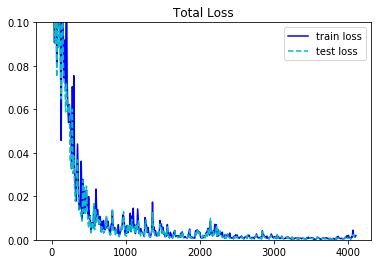

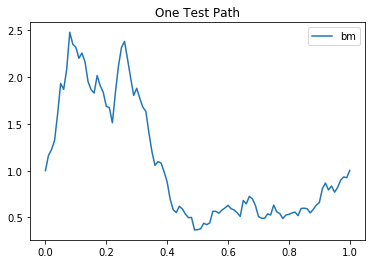

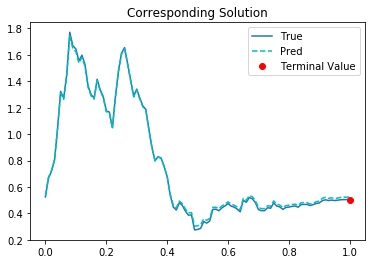

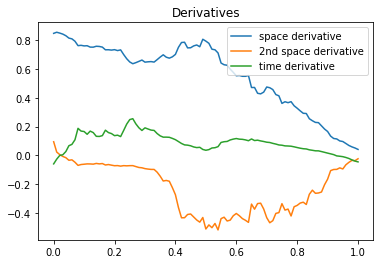

4111th Epoch:
traing loss is 0.0007778556318953633, test loss is 0.00039277991163544357, and learning rate is 0.0019078266341239214, elapsed is 3.881995439529419.
 
4121th Epoch:
traing loss is 0.000526794174220413, test loss is 0.0005156373372301459, and learning rate is 0.0019078266341239214, elapsed is 3.0238888263702393.
 
4131th Epoch:
traing loss is 0.0005899132811464369, test loss is 0.0006854452076368034, and learning rate is 0.0019078266341239214, elapsed is 3.056887149810791.
 
4141th Epoch:
traing loss is 0.0016956421313807368, test loss is 0.0016711631324142218, and learning rate is 0.0019078266341239214, elapsed is 3.060140609741211.
 
4151th Epoch:
traing loss is 0.0012924486072733998, test loss is 0.0012209098786115646, and learning rate is 0.0018696701154112816, elapsed is 3.024153709411621.
 
4161th Epoch:
traing loss is 0.0027250417042523623, test loss is 0.001183392945677042, and learning rate is 0.0018696701154112816, elapsed is 3.161505937576294.
 
4171th Epoch:
tr

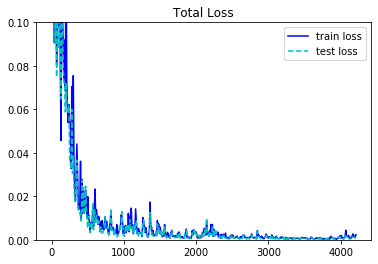

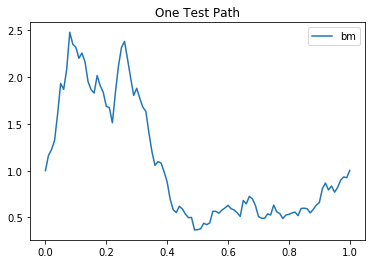

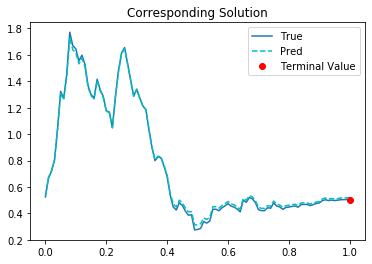

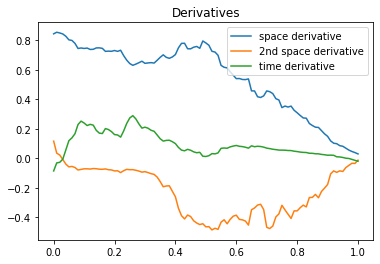

4211th Epoch:
traing loss is 0.0011635129339993, test loss is 0.0005777818732894957, and learning rate is 0.0018322766991332173, elapsed is 4.041985273361206.
 
4221th Epoch:
traing loss is 0.0007840257603675127, test loss is 0.0006112807895988226, and learning rate is 0.0018322766991332173, elapsed is 3.1228816509246826.
 
4231th Epoch:
traing loss is 0.00031280089751817286, test loss is 0.000337546895025298, and learning rate is 0.0018322766991332173, elapsed is 3.1286089420318604.
 
4241th Epoch:
traing loss is 0.0018226495012640953, test loss is 0.0014546727761626244, and learning rate is 0.0018322766991332173, elapsed is 2.995008945465088.
 
4251th Epoch:
traing loss is 0.0008321769419126213, test loss is 0.0007657023961655796, and learning rate is 0.0017956312512978911, elapsed is 3.0275588035583496.
 
4261th Epoch:
traing loss is 0.001372037106193602, test loss is 0.0007095349137671292, and learning rate is 0.0017956312512978911, elapsed is 3.0763816833496094.
 
4271th Epoch:
tr

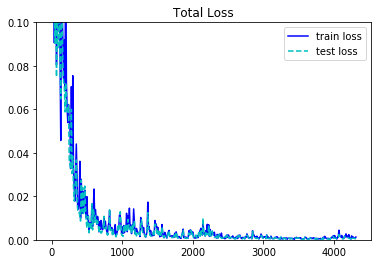

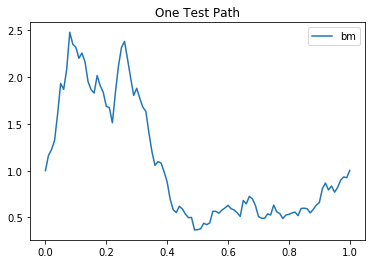

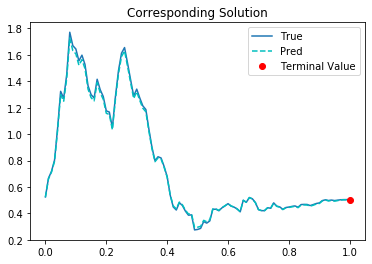

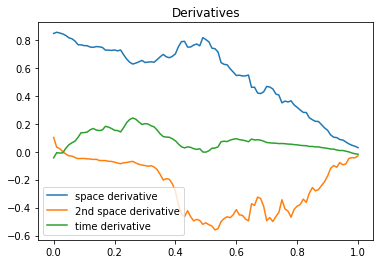

4311th Epoch:
traing loss is 0.0006923043401911855, test loss is 0.000362322258297354, and learning rate is 0.0017597186379134655, elapsed is 3.966188430786133.
 
4321th Epoch:
traing loss is 0.0004487113037612289, test loss is 0.00045954479719512165, and learning rate is 0.0017597186379134655, elapsed is 3.041151523590088.
 
4331th Epoch:
traing loss is 0.00037806242471560836, test loss is 0.0004420675104483962, and learning rate is 0.0017597186379134655, elapsed is 3.0527687072753906.
 
4341th Epoch:
traing loss is 0.0012667658738791943, test loss is 0.0009882819140329957, and learning rate is 0.0017597186379134655, elapsed is 3.0040717124938965.
 
4351th Epoch:
traing loss is 0.0007287884363904595, test loss is 0.0006841709837317467, and learning rate is 0.001724524307064712, elapsed is 3.0319838523864746.
 
4361th Epoch:
traing loss is 0.003487570444121957, test loss is 0.0020871651358902454, and learning rate is 0.001724524307064712, elapsed is 3.0301496982574463.
 
4371th Epoch:


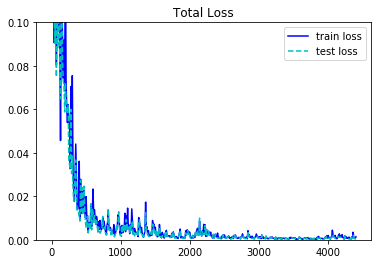

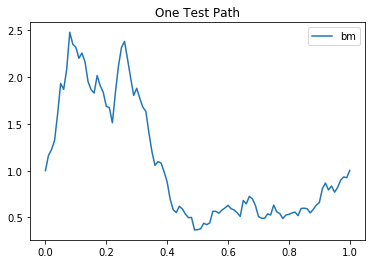

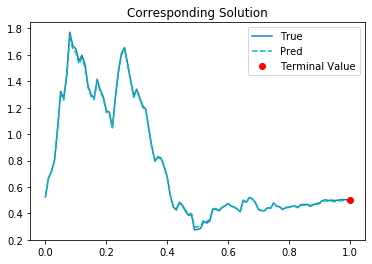

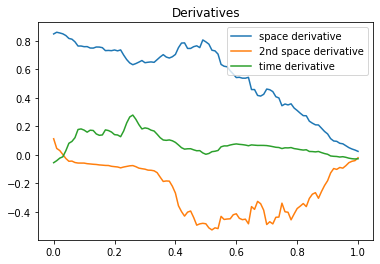

4411th Epoch:
traing loss is 0.000965892628300935, test loss is 0.0004300708242226392, and learning rate is 0.001690033939667046, elapsed is 4.007389307022095.
 
4421th Epoch:
traing loss is 0.0003977040760219097, test loss is 0.00036781150265596807, and learning rate is 0.001690033939667046, elapsed is 3.0795321464538574.
 
4431th Epoch:
traing loss is 0.0003035546687897295, test loss is 0.00034198976936750114, and learning rate is 0.001690033939667046, elapsed is 3.0883970260620117.
 
4441th Epoch:
traing loss is 0.0018430391792207956, test loss is 0.0013541592052206397, and learning rate is 0.001690033939667046, elapsed is 3.0810189247131348.
 
4451th Epoch:
traing loss is 0.0014580913120880723, test loss is 0.001427294104360044, and learning rate is 0.0016562332166358829, elapsed is 3.032057046890259.
 
4461th Epoch:
traing loss is 0.003800526726990938, test loss is 0.0022930805571377277, and learning rate is 0.0016562332166358829, elapsed is 3.048161745071411.
 
4471th Epoch:
trai

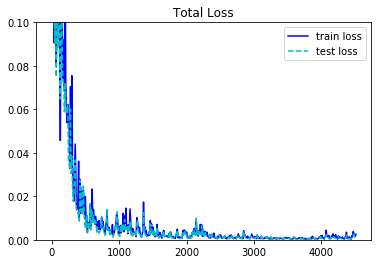

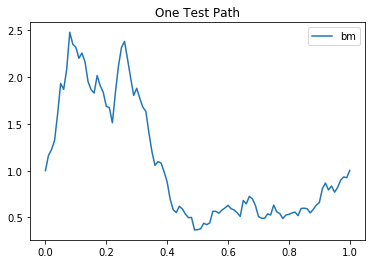

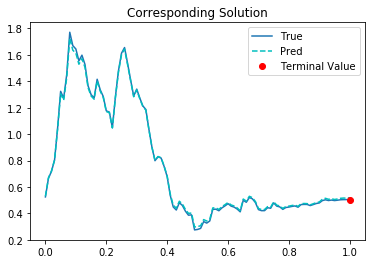

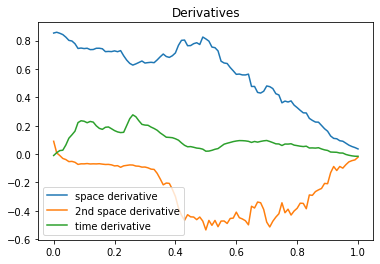

4511th Epoch:
traing loss is 0.0015769129386171699, test loss is 0.0012591303093358874, and learning rate is 0.0016231086337938905, elapsed is 4.015949964523315.
 
4521th Epoch:
traing loss is 0.0013037014286965132, test loss is 0.000936998229008168, and learning rate is 0.0016231086337938905, elapsed is 3.0309276580810547.
 
4531th Epoch:
traing loss is 0.0007831223192624748, test loss is 0.0007992914179340005, and learning rate is 0.0016231086337938905, elapsed is 3.098623037338257.
 
4541th Epoch:
traing loss is 0.005258979741483927, test loss is 0.004417409189045429, and learning rate is 0.0016231086337938905, elapsed is 3.109356164932251.
 
4551th Epoch:
traing loss is 0.0027194800786674023, test loss is 0.002348807407543063, and learning rate is 0.0015906464541330934, elapsed is 3.007322311401367.
 
4561th Epoch:
traing loss is 0.006837455090135336, test loss is 0.003913396969437599, and learning rate is 0.0015906464541330934, elapsed is 2.98649525642395.
 
4571th Epoch:
traing l

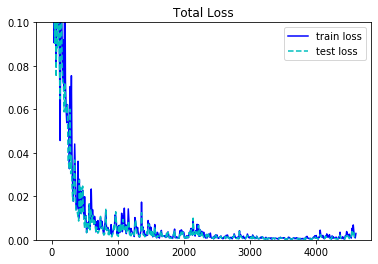

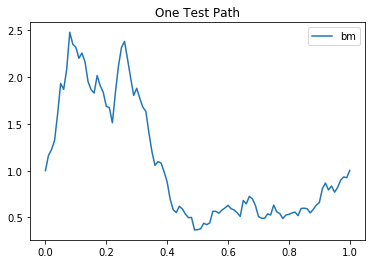

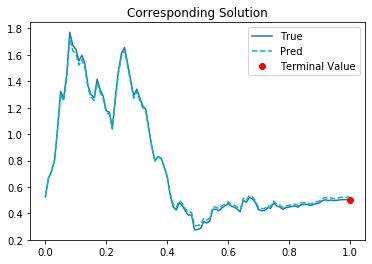

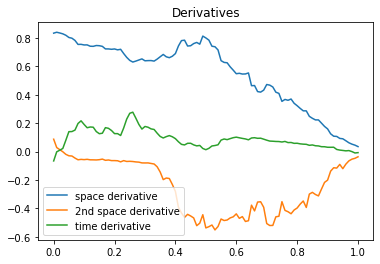

4611th Epoch:
traing loss is 0.0010368642397224903, test loss is 0.0007546068518422544, and learning rate is 0.001558833522722125, elapsed is 4.005044937133789.
 
4621th Epoch:
traing loss is 0.0008061989792622626, test loss is 0.0009434486855752766, and learning rate is 0.001558833522722125, elapsed is 3.018768310546875.
 
4631th Epoch:
traing loss is 0.00035672966623678803, test loss is 0.00046672672033309937, and learning rate is 0.001558833522722125, elapsed is 2.9679110050201416.
 
4641th Epoch:
traing loss is 0.0019019597675651312, test loss is 0.0017871875315904617, and learning rate is 0.001558833522722125, elapsed is 3.0881433486938477.
 
4651th Epoch:
traing loss is 0.0009025246254168451, test loss is 0.0008421990205533803, and learning rate is 0.0015276569174602628, elapsed is 2.9911985397338867.
 
4661th Epoch:
traing loss is 0.0009711672319099307, test loss is 0.0005882192053832114, and learning rate is 0.0015276569174602628, elapsed is 3.056757688522339.
 
4671th Epoch:
t

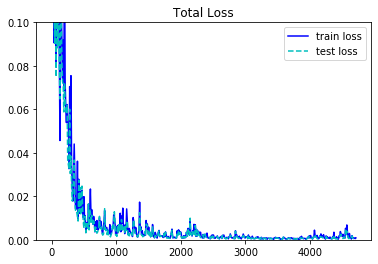

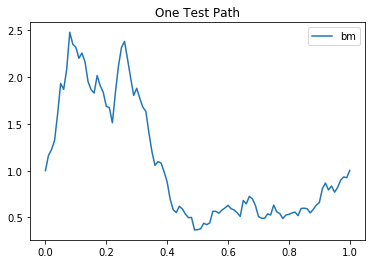

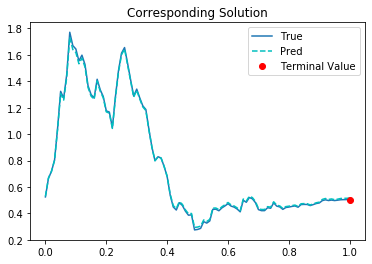

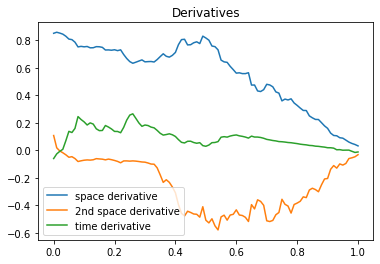

4711th Epoch:
traing loss is 0.0005205384804867208, test loss is 0.0003718608058989048, and learning rate is 0.0014971038326621056, elapsed is 4.038771152496338.
 
4721th Epoch:
traing loss is 0.00041491957381367683, test loss is 0.000393141177482903, and learning rate is 0.0014971038326621056, elapsed is 3.015669345855713.
 
4731th Epoch:
traing loss is 0.0002572907542344183, test loss is 0.00032034292235039175, and learning rate is 0.0014971038326621056, elapsed is 3.044790267944336.
 
4741th Epoch:
traing loss is 0.0014452870236709714, test loss is 0.0013251975178718567, and learning rate is 0.0014971038326621056, elapsed is 2.999267816543579.
 
4751th Epoch:
traing loss is 0.0005478266393765807, test loss is 0.0004516974731814116, and learning rate is 0.001467161695472896, elapsed is 2.9417033195495605.
 
4761th Epoch:
traing loss is 0.000912786868866533, test loss is 0.0008441989193670452, and learning rate is 0.001467161695472896, elapsed is 3.045515298843384.
 
4771th Epoch:
tra

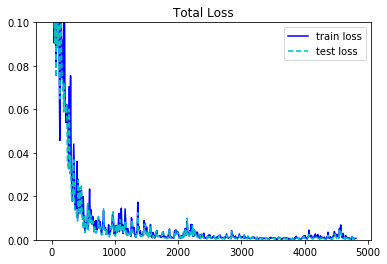

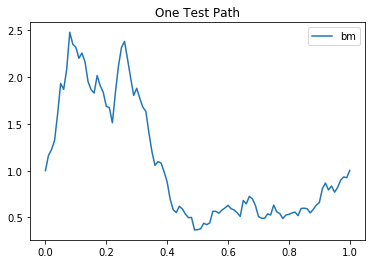

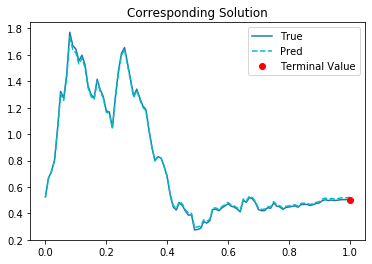

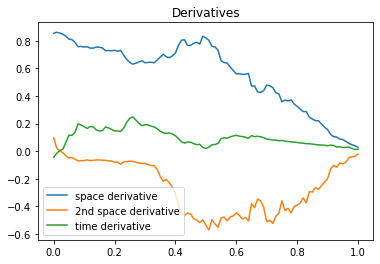

4811th Epoch:
traing loss is 0.0006096595898270607, test loss is 0.0004847931850235909, and learning rate is 0.0014378185151144862, elapsed is 4.076166152954102.
 
4821th Epoch:
traing loss is 0.0005517459358088672, test loss is 0.00046890764497220516, and learning rate is 0.0014378185151144862, elapsed is 3.1113193035125732.
 
4831th Epoch:
traing loss is 0.00024801582912914455, test loss is 0.0003066842327825725, and learning rate is 0.0014378185151144862, elapsed is 3.0519230365753174.
 
4841th Epoch:
traing loss is 0.000798584776930511, test loss is 0.0005539841367863119, and learning rate is 0.0014378185151144862, elapsed is 3.0345563888549805.
 
4851th Epoch:
traing loss is 0.00034402470919303596, test loss is 0.0003586716775316745, and learning rate is 0.001409062067978084, elapsed is 3.0817484855651855.
 
4861th Epoch:
traing loss is 0.0010854623978957534, test loss is 0.0009533509146422148, and learning rate is 0.001409062067978084, elapsed is 3.0758092403411865.
 
4871th Epoc

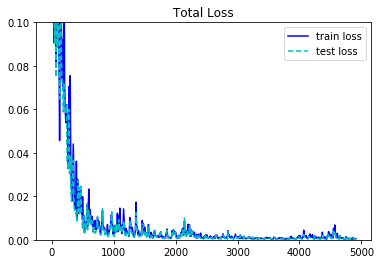

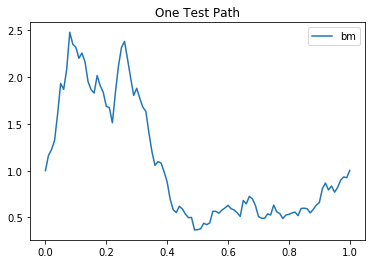

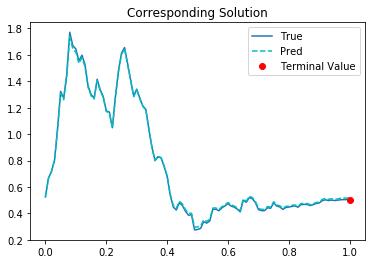

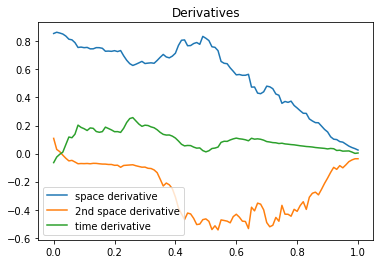

4911th Epoch:
traing loss is 0.00032402510987594724, test loss is 0.00024436632520519197, and learning rate is 0.0013808809453621507, elapsed is 4.126976490020752.
 
4921th Epoch:
traing loss is 0.00033651344710960984, test loss is 0.000326530629536137, and learning rate is 0.0013808809453621507, elapsed is 3.04870867729187.
 
4931th Epoch:
traing loss is 0.00017026416026055813, test loss is 0.00021529644436668605, and learning rate is 0.0013808809453621507, elapsed is 3.0038039684295654.
 
4941th Epoch:
traing loss is 0.00048274215077981353, test loss is 0.000310434348648414, and learning rate is 0.0013808809453621507, elapsed is 3.0613300800323486.
 
4951th Epoch:
traing loss is 0.00021745743288192898, test loss is 0.00023078695812728256, and learning rate is 0.0013532633893191814, elapsed is 3.0173065662384033.
 
4961th Epoch:
traing loss is 0.0005411526071839035, test loss is 0.00048778593190945685, and learning rate is 0.0013532633893191814, elapsed is 2.984365224838257.
 
4971th 

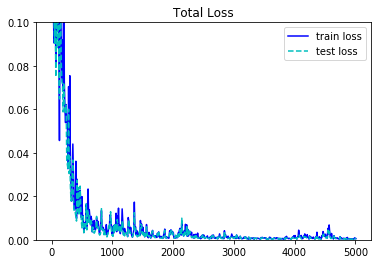

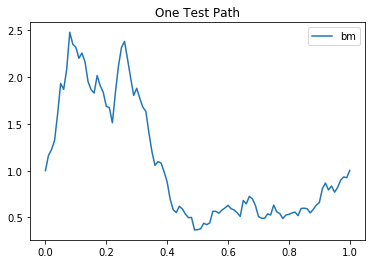

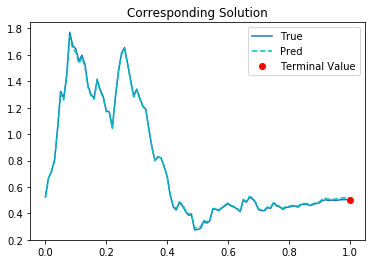

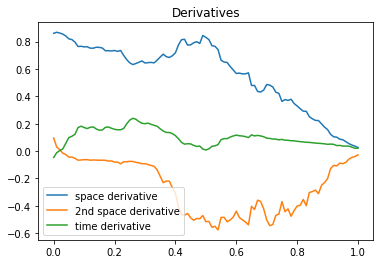

5011th Epoch:
traing loss is 0.0007405707146972418, test loss is 0.0005507260211743414, and learning rate is 0.0013261981075629592, elapsed is 4.1516993045806885.
 
5021th Epoch:
traing loss is 0.0005315208109095693, test loss is 0.0004996951902285218, and learning rate is 0.0013261981075629592, elapsed is 3.1465067863464355.
 
5031th Epoch:
traing loss is 0.00030072458321228623, test loss is 0.00036098159034736454, and learning rate is 0.0013261981075629592, elapsed is 3.055584669113159.
 
5041th Epoch:
traing loss is 0.0009568360983394086, test loss is 0.0005589267238974571, and learning rate is 0.0013261981075629592, elapsed is 3.1390745639801025.
 
5051th Epoch:
traing loss is 0.00027312900056131184, test loss is 0.0003198245831299573, and learning rate is 0.0012996741570532322, elapsed is 3.1685538291931152.
 
5061th Epoch:
traing loss is 0.0008725423831492662, test loss is 0.0004328286449890584, and learning rate is 0.0012996741570532322, elapsed is 3.210577964782715.
 
5071th Ep

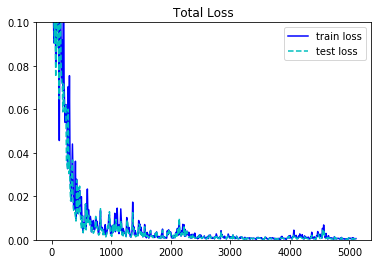

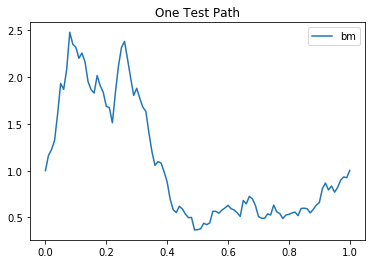

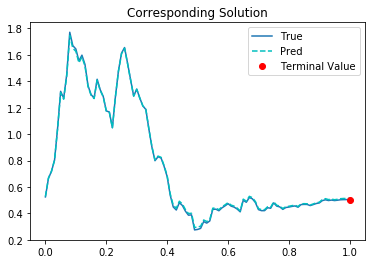

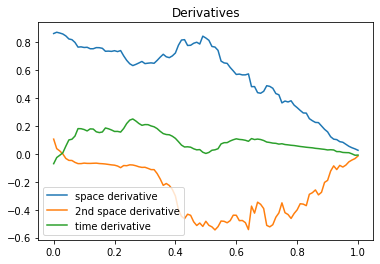

5111th Epoch:
traing loss is 0.00030042766593396664, test loss is 0.00018180183542426676, and learning rate is 0.0012736807111650705, elapsed is 4.105622053146362.
 
5121th Epoch:
traing loss is 0.00026950048049911857, test loss is 0.0002763515221886337, and learning rate is 0.0012736807111650705, elapsed is 3.1593518257141113.
 
5131th Epoch:
traing loss is 0.0001336813875241205, test loss is 0.00016495499585289508, and learning rate is 0.0012736807111650705, elapsed is 3.203554391860962.
 
5141th Epoch:
traing loss is 0.0006203782395459712, test loss is 0.00036046787863597274, and learning rate is 0.0012736807111650705, elapsed is 3.1257200241088867.
 
5151th Epoch:
traing loss is 0.00021155639842618257, test loss is 0.00023224062169902027, and learning rate is 0.001248207176104188, elapsed is 3.1892268657684326.
 
5161th Epoch:
traing loss is 0.0007046133396215737, test loss is 0.00040407522465102375, and learning rate is 0.001248207176104188, elapsed is 3.2083966732025146.
 
5171th

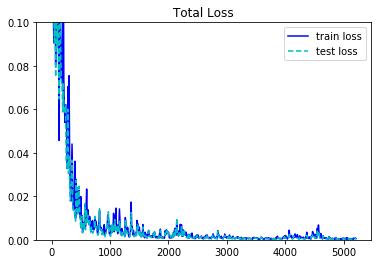

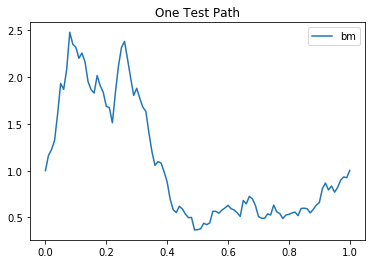

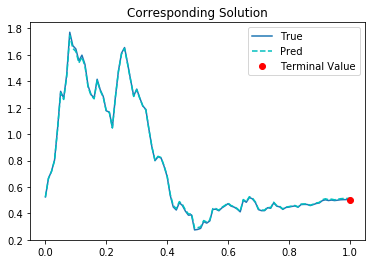

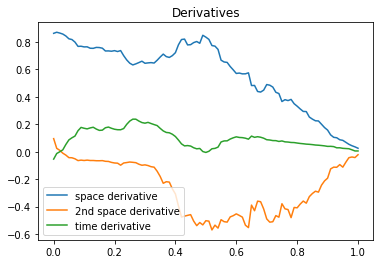

5211th Epoch:
traing loss is 0.0004864551010541618, test loss is 0.0003377644170541316, and learning rate is 0.0012232429580762982, elapsed is 4.046459913253784.
 
5221th Epoch:
traing loss is 0.00040691375033929944, test loss is 0.0003853569505736232, and learning rate is 0.0012232429580762982, elapsed is 3.08359956741333.
 
5231th Epoch:
traing loss is 0.0002072824427159503, test loss is 0.0002449588500894606, and learning rate is 0.0012232429580762982, elapsed is 3.028306007385254.
 
5241th Epoch:
traing loss is 0.0013220914406701922, test loss is 0.000743392389267683, and learning rate is 0.0012232429580762982, elapsed is 3.0728189945220947.
 
5251th Epoch:
traing loss is 0.00036298405029810965, test loss is 0.00041636251262389123, and learning rate is 0.001198778161779046, elapsed is 3.102123737335205.
 
5261th Epoch:
traing loss is 0.0014869668520987034, test loss is 0.0006151380948722363, and learning rate is 0.001198778161779046, elapsed is 3.1140635013580322.
 
5271th Epoch:
t

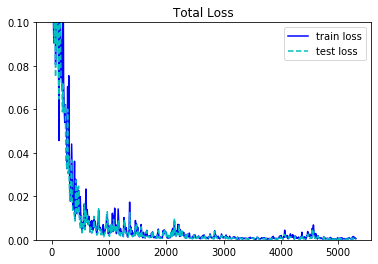

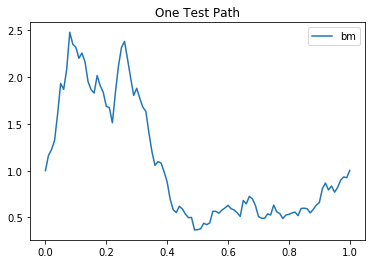

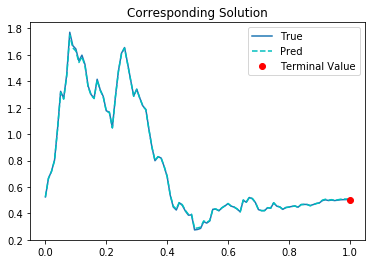

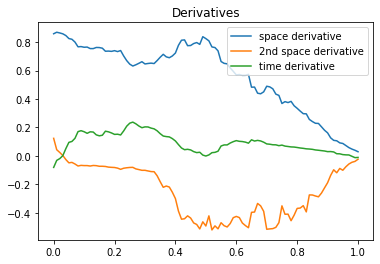

5311th Epoch:
traing loss is 0.0003834773087874055, test loss is 0.00018619160982780159, and learning rate is 0.0011748026590794325, elapsed is 4.050246000289917.
 
5321th Epoch:
traing loss is 0.0003931175160687417, test loss is 0.00041609167237766087, and learning rate is 0.0011748026590794325, elapsed is 3.074308156967163.
 
5331th Epoch:
traing loss is 0.0001627673045732081, test loss is 0.00018165635992772877, and learning rate is 0.0011748026590794325, elapsed is 3.038115978240967.
 
5341th Epoch:
traing loss is 0.0006373457727022469, test loss is 0.00040923431515693665, and learning rate is 0.0011748026590794325, elapsed is 3.0650901794433594.
 
5351th Epoch:
traing loss is 0.0002183913456974551, test loss is 0.0002166780614061281, and learning rate is 0.0011513065546751022, elapsed is 3.0729269981384277.
 
5361th Epoch:
traing loss is 0.0007135614869184792, test loss is 0.00033408968010917306, and learning rate is 0.0011513065546751022, elapsed is 3.0933845043182373.
 
5371th E

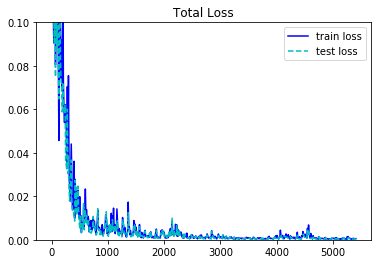

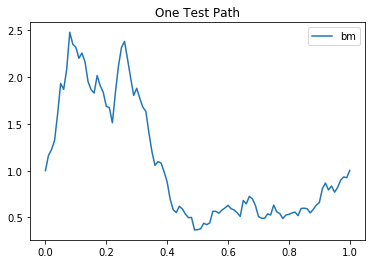

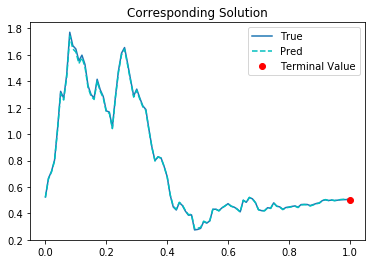

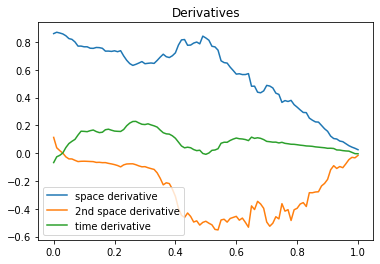

5411th Epoch:
traing loss is 0.00033283952507190406, test loss is 0.00022984544921200722, and learning rate is 0.0011282805353403091, elapsed is 3.986443281173706.
 
5421th Epoch:
traing loss is 0.0005649105878546834, test loss is 0.0005834799958392978, and learning rate is 0.0011282805353403091, elapsed is 3.104153633117676.
 
5431th Epoch:
traing loss is 0.00018910040671471506, test loss is 0.00019827138748951256, and learning rate is 0.0011282805353403091, elapsed is 3.02807879447937.
 
5441th Epoch:
traing loss is 0.0014725556829944253, test loss is 0.0009236892801709473, and learning rate is 0.0011282805353403091, elapsed is 3.04032301902771.
 
5451th Epoch:
traing loss is 0.0003433480451349169, test loss is 0.0003590252308640629, and learning rate is 0.0011057148221880198, elapsed is 3.045421838760376.
 
5461th Epoch:
traing loss is 0.0015004979213699698, test loss is 0.0009639835334382951, and learning rate is 0.0011057148221880198, elapsed is 3.0731468200683594.
 
5471th Epoch:

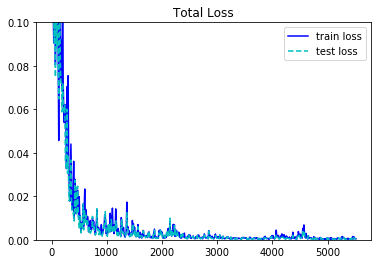

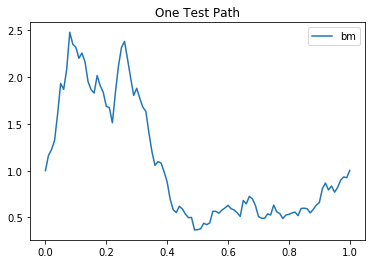

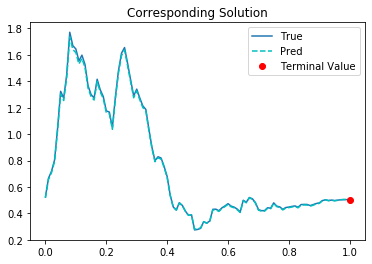

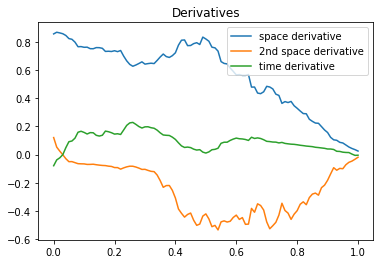

5511th Epoch:
traing loss is 0.000517610867973417, test loss is 0.0003584908845368773, and learning rate is 0.001083600684069097, elapsed is 4.070264577865601.
 
5521th Epoch:
traing loss is 0.0006914911791682243, test loss is 0.0006395973614417017, and learning rate is 0.001083600684069097, elapsed is 3.184921979904175.
 
5531th Epoch:
traing loss is 0.00031493447022512555, test loss is 0.0002975663519464433, and learning rate is 0.001083600684069097, elapsed is 3.1913902759552.
 
5541th Epoch:
traing loss is 0.0006493813125416636, test loss is 0.000544697162695229, and learning rate is 0.001083600684069097, elapsed is 3.125753164291382.
 
5551th Epoch:
traing loss is 0.0002522732538636774, test loss is 0.00021757424110546708, and learning rate is 0.0010619285749271512, elapsed is 3.167271852493286.
 
5561th Epoch:
traing loss is 0.0006428724154829979, test loss is 0.0005170704098418355, and learning rate is 0.0010619285749271512, elapsed is 3.191563129425049.
 
5571th Epoch:
traing l

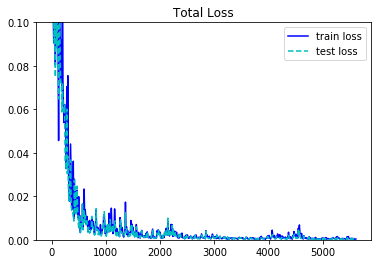

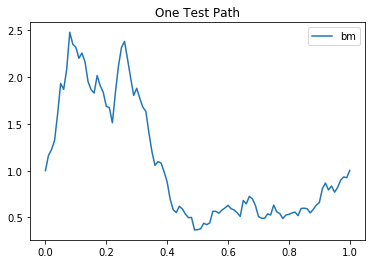

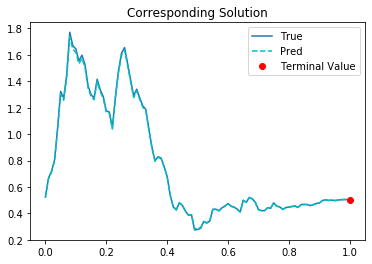

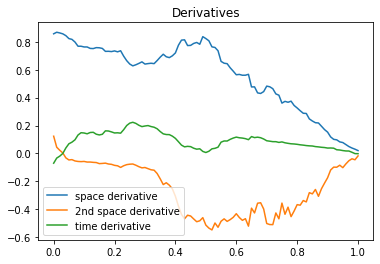

5611th Epoch:
traing loss is 0.00038255559047684073, test loss is 0.00028151675360277295, and learning rate is 0.0010406901128590107, elapsed is 4.034992933273315.
 
5621th Epoch:
traing loss is 0.0006411399808712304, test loss is 0.0005947425379417837, and learning rate is 0.0010406901128590107, elapsed is 3.19016170501709.
 
5631th Epoch:
traing loss is 0.00023872269957792014, test loss is 0.00022965043899603188, and learning rate is 0.0010406901128590107, elapsed is 3.117727279663086.
 
5641th Epoch:
traing loss is 0.0008095487719401717, test loss is 0.0006975465803407133, and learning rate is 0.0010406901128590107, elapsed is 3.173051118850708.
 
5651th Epoch:
traing loss is 0.00032197684049606323, test loss is 0.00029756661388091743, and learning rate is 0.0010198763338848948, elapsed is 3.186335802078247.
 
5661th Epoch:
traing loss is 0.0009433653904125094, test loss is 0.0008102610008791089, and learning rate is 0.0010198763338848948, elapsed is 3.1303882598876953.
 
5671th Epo

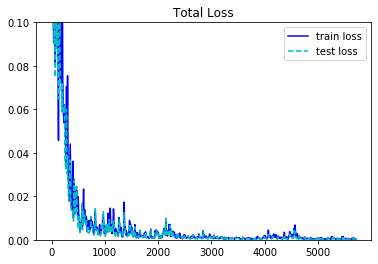

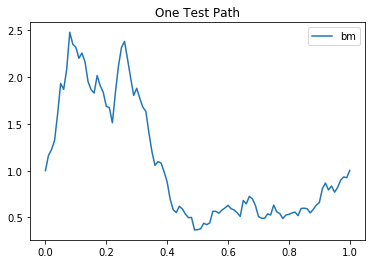

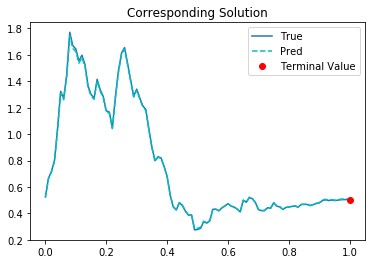

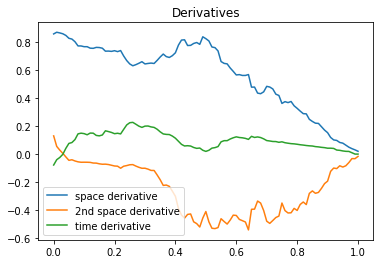

5711th Epoch:
traing loss is 0.0003682284732349217, test loss is 0.0002484110009390861, and learning rate is 0.0009994788561016321, elapsed is 4.021392345428467.
 
5721th Epoch:
traing loss is 0.0006315652281045914, test loss is 0.0005993033992126584, and learning rate is 0.0009994788561016321, elapsed is 3.101346492767334.
 
5731th Epoch:
traing loss is 0.0002587373892311007, test loss is 0.00026354240253567696, and learning rate is 0.0009994788561016321, elapsed is 3.1438324451446533.
 
5741th Epoch:
traing loss is 0.0004747686325572431, test loss is 0.0004457013274077326, and learning rate is 0.0009994788561016321, elapsed is 3.0850634574890137.
 
5751th Epoch:
traing loss is 0.00023684091866016388, test loss is 0.0002211136306868866, and learning rate is 0.0009794891811907291, elapsed is 3.0444090366363525.
 
5761th Epoch:
traing loss is 0.00033284342498518527, test loss is 0.00024029347696341574, and learning rate is 0.0009794891811907291, elapsed is 3.2099416255950928.
 
5771th E

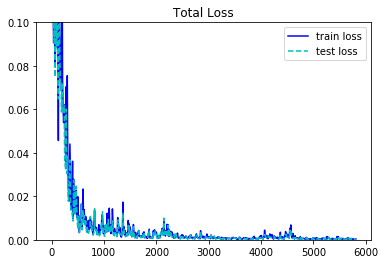

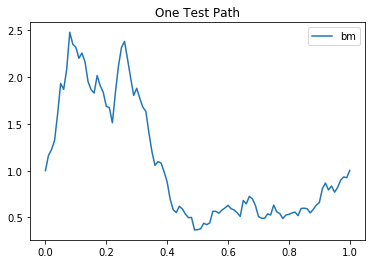

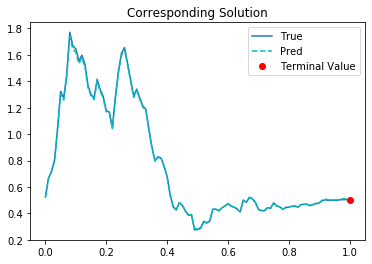

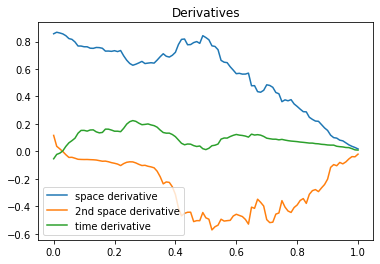

5811th Epoch:
traing loss is 0.00046507350634783506, test loss is 0.00034653610782697797, and learning rate is 0.0009598994511179626, elapsed is 3.9900193214416504.
 
5821th Epoch:
traing loss is 0.0008589032804593444, test loss is 0.0008118581026792526, and learning rate is 0.0009598994511179626, elapsed is 3.123201370239258.
 
5831th Epoch:
traing loss is 0.0005059695104137063, test loss is 0.0005068830214440823, and learning rate is 0.0009598994511179626, elapsed is 3.1161434650421143.
 
5841th Epoch:
traing loss is 0.0003703966795001179, test loss is 0.0003084953932557255, and learning rate is 0.0009598994511179626, elapsed is 3.08309006690979.
 
5851th Epoch:
traing loss is 0.00017672937246970832, test loss is 0.00015570639516226947, and learning rate is 0.0009407015168108046, elapsed is 3.08345103263855.
 
5861th Epoch:
traing loss is 0.0006935144774615765, test loss is 0.0005340795614756644, and learning rate is 0.0009407015168108046, elapsed is 3.1019082069396973.
 
5871th Epoc

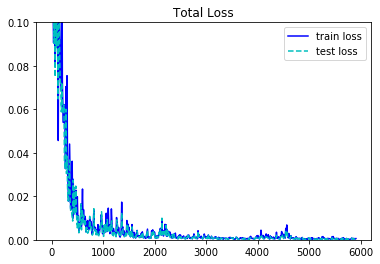

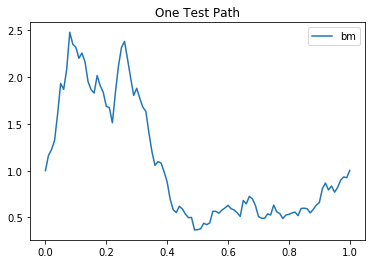

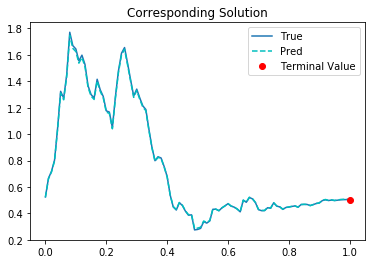

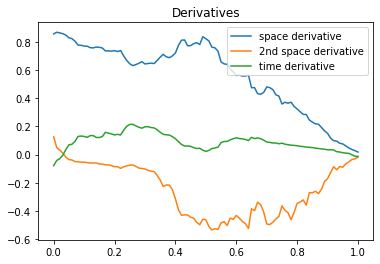

5911th Epoch:
traing loss is 0.00048378994688391685, test loss is 0.0003082128241658211, and learning rate is 0.0009218874620273709, elapsed is 4.017524003982544.
 
5921th Epoch:
traing loss is 0.0006024794420227408, test loss is 0.0005776111502200365, and learning rate is 0.0009218874620273709, elapsed is 3.07820987701416.
 
5931th Epoch:
traing loss is 0.0003397028485778719, test loss is 0.00038120688986964524, and learning rate is 0.0009218874620273709, elapsed is 2.9930288791656494.
 
5941th Epoch:
traing loss is 0.0007616435759700835, test loss is 0.000623200205154717, and learning rate is 0.0009218874620273709, elapsed is 3.061358690261841.
 
5951th Epoch:
traing loss is 0.00047292798990383744, test loss is 0.00044187650200910866, and learning rate is 0.0009034497779794037, elapsed is 3.1031148433685303.
 
5961th Epoch:
traing loss is 0.0007013223948888481, test loss is 0.0003285295097157359, and learning rate is 0.0009034497779794037, elapsed is 3.08796763420105.
 
5971th Epoch:

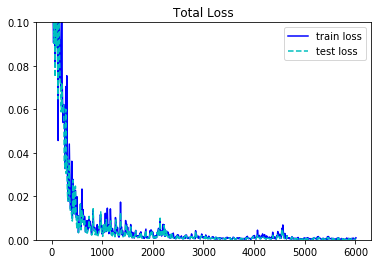

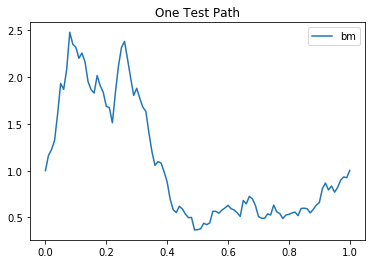

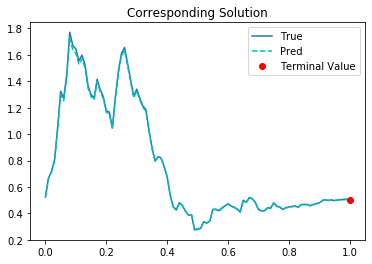

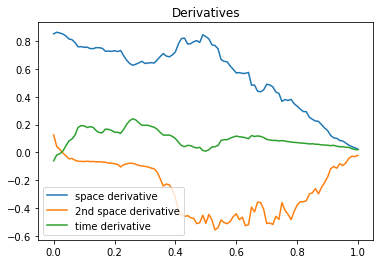

6011th Epoch:
traing loss is 0.00038706263876520097, test loss is 0.00025280489353463054, and learning rate is 0.0008853807812556624, elapsed is 4.0193092823028564.
 
6021th Epoch:
traing loss is 0.0005089431069791317, test loss is 0.0004946988774463534, and learning rate is 0.0008853807812556624, elapsed is 3.1820995807647705.
 
6031th Epoch:
traing loss is 0.00034286812297068536, test loss is 0.0003449733485467732, and learning rate is 0.0008853807812556624, elapsed is 3.054147958755493.
 
6041th Epoch:
traing loss is 0.0010575951309874654, test loss is 0.0005366362165659666, and learning rate is 0.0008853807812556624, elapsed is 3.1184399127960205.
 
6051th Epoch:
traing loss is 0.00046597293112426996, test loss is 0.0004119145742151886, and learning rate is 0.0008676731958985329, elapsed is 3.034264087677002.
 
6061th Epoch:
traing loss is 0.0019299400737509131, test loss is 0.0013599065132439137, and learning rate is 0.0008676731958985329, elapsed is 3.0861828327178955.
 
6071th E

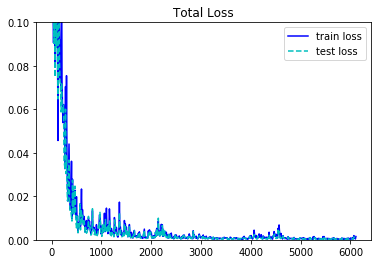

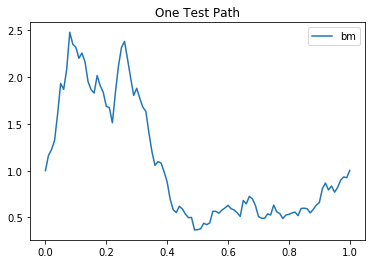

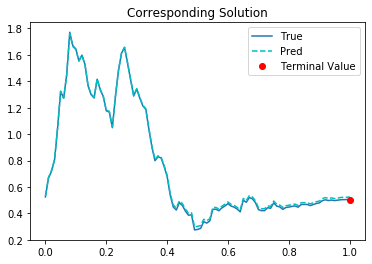

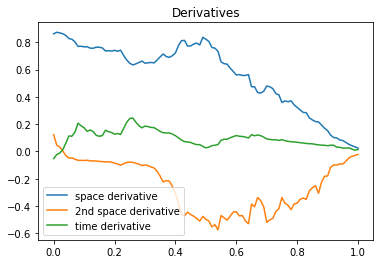

6111th Epoch:
traing loss is 0.0007910068379715085, test loss is 0.0003426407929509878, and learning rate is 0.0008503196877427399, elapsed is 4.206914901733398.
 
6121th Epoch:
traing loss is 0.0004032781289424747, test loss is 0.00037421914748847485, and learning rate is 0.0008503196877427399, elapsed is 3.2840497493743896.
 
6131th Epoch:
traing loss is 0.00023660525039304048, test loss is 0.000301433727145195, and learning rate is 0.0008503196877427399, elapsed is 3.1363117694854736.
 
6141th Epoch:
traing loss is 0.0010486190440133214, test loss is 0.0009907570201903582, and learning rate is 0.0008503196877427399, elapsed is 3.188225746154785.
 
6151th Epoch:
traing loss is 0.0006869806675240397, test loss is 0.0006624571979045868, and learning rate is 0.0008333133882842958, elapsed is 3.132028102874756.
 
6161th Epoch:
traing loss is 0.001334688626229763, test loss is 0.0007590248133055866, and learning rate is 0.0008333133882842958, elapsed is 3.1308233737945557.
 
6171th Epoch:

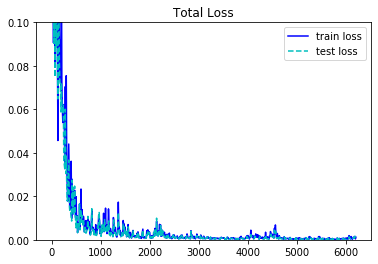

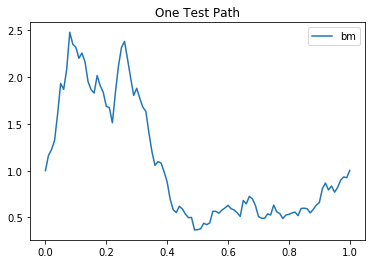

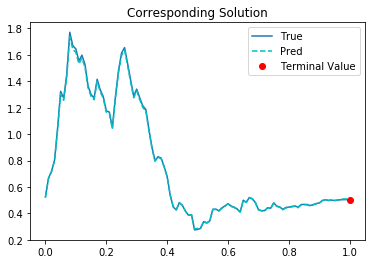

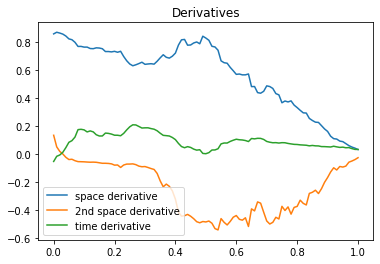

6211th Epoch:
traing loss is 0.0007023828802630305, test loss is 0.0004106470732949674, and learning rate is 0.0008166470797732472, elapsed is 4.124516725540161.
 
6221th Epoch:
traing loss is 0.001259895390830934, test loss is 0.0010721497237682343, and learning rate is 0.0008166470797732472, elapsed is 3.2191431522369385.
 
6231th Epoch:
traing loss is 0.0003281915851403028, test loss is 0.00037830157089047134, and learning rate is 0.0008166470797732472, elapsed is 3.209674596786499.
 
6241th Epoch:
traing loss is 0.0005439206724986434, test loss is 0.0004637623205780983, and learning rate is 0.0008166470797732472, elapsed is 3.1406919956207275.
 
6251th Epoch:
traing loss is 0.0003081726608797908, test loss is 0.00028140898211859167, and learning rate is 0.0008003141265362501, elapsed is 3.180920124053955.
 
6261th Epoch:
traing loss is 0.000871404365170747, test loss is 0.0004394267743919045, and learning rate is 0.0008003141265362501, elapsed is 3.1373772621154785.
 
6271th Epoch:

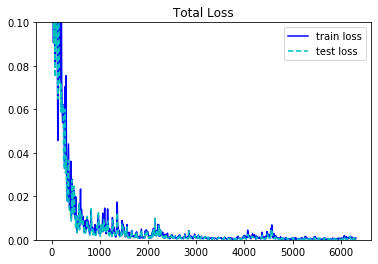

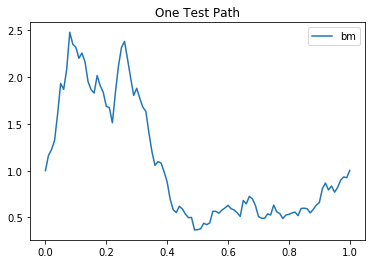

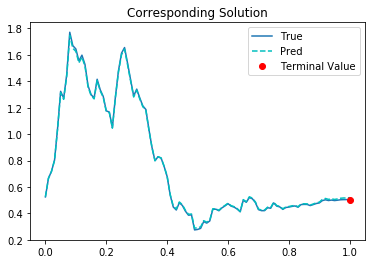

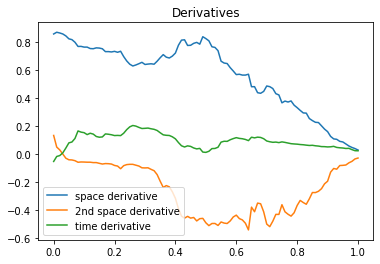

6311th Epoch:
traing loss is 0.0006214542081579566, test loss is 0.00043746046139858663, and learning rate is 0.0007843079511076212, elapsed is 4.118594646453857.
 
6321th Epoch:
traing loss is 0.0006188023835420609, test loss is 0.0005292523419484496, and learning rate is 0.0007843079511076212, elapsed is 3.1165971755981445.
 
6331th Epoch:
traing loss is 0.0003018898132722825, test loss is 0.00038236513501033187, and learning rate is 0.0007843079511076212, elapsed is 3.1460790634155273.
 
6341th Epoch:
traing loss is 0.0002710344851948321, test loss is 0.0002506547898519784, and learning rate is 0.0007843079511076212, elapsed is 3.1200387477874756.
 
6351th Epoch:
traing loss is 0.00015716876077931374, test loss is 0.00016291534120682627, and learning rate is 0.0007686217431910336, elapsed is 3.123138666152954.
 
6361th Epoch:
traing loss is 0.0005681232432834804, test loss is 0.0002961080754175782, and learning rate is 0.0007686217431910336, elapsed is 3.154224157333374.
 
6371th Ep

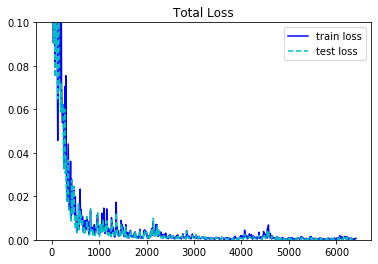

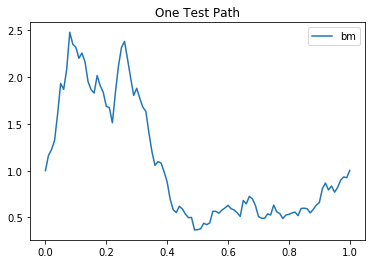

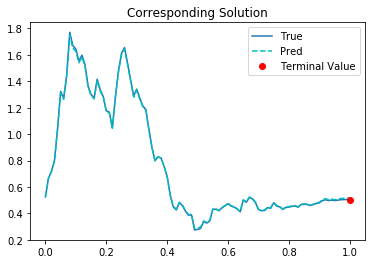

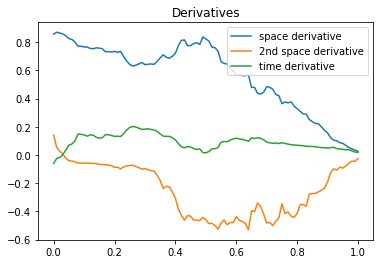

6411th Epoch:
traing loss is 0.0006236918270587921, test loss is 0.00043782504508271813, and learning rate is 0.0007532493327744305, elapsed is 4.154616355895996.
 
6421th Epoch:
traing loss is 0.0005947939353063703, test loss is 0.0005231521208770573, and learning rate is 0.0007532493327744305, elapsed is 3.1504359245300293.
 
6431th Epoch:
traing loss is 0.0003010891086887568, test loss is 0.0003841368015855551, and learning rate is 0.0007532493327744305, elapsed is 3.0957939624786377.
 
6441th Epoch:
traing loss is 0.00019877591694239527, test loss is 0.00019440852338448167, and learning rate is 0.0007532493327744305, elapsed is 3.1321542263031006.
 
6451th Epoch:
traing loss is 0.00011141558934468776, test loss is 0.00012998143211007118, and learning rate is 0.0007381843752227724, elapsed is 3.117206573486328.
 
6461th Epoch:
traing loss is 0.0003625878307502717, test loss is 0.00019366703054402024, and learning rate is 0.0007381843752227724, elapsed is 3.0425615310668945.
 
6471th

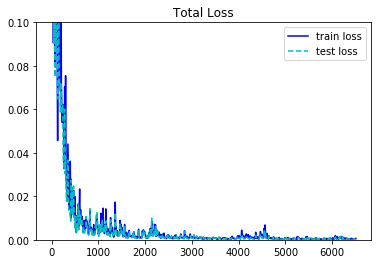

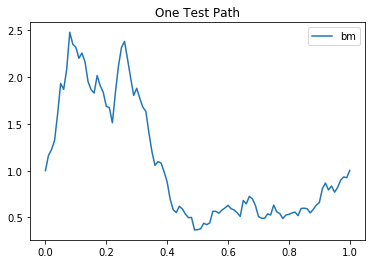

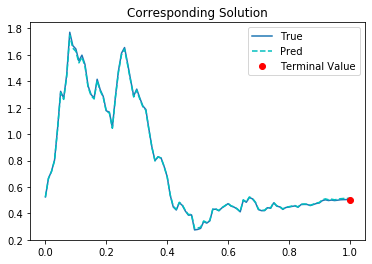

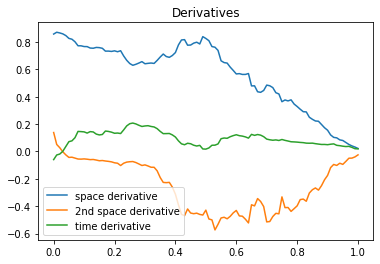

6511th Epoch:
traing loss is 0.0006294178892858326, test loss is 0.00043330935295671225, and learning rate is 0.0007234206423163414, elapsed is 4.960068225860596.
 
6521th Epoch:
traing loss is 0.0005056805675849319, test loss is 0.00044734569382853806, and learning rate is 0.0007234206423163414, elapsed is 3.19313383102417.
 
6531th Epoch:
traing loss is 0.00027726287953555584, test loss is 0.0003602973010856658, and learning rate is 0.0007234206423163414, elapsed is 3.177274703979492.
 
6541th Epoch:
traing loss is 0.00017545055015943944, test loss is 0.00017630941874813288, and learning rate is 0.0007234206423163414, elapsed is 3.074612855911255.
 
6551th Epoch:
traing loss is 9.915581904351711e-05, test loss is 0.00011514843936311081, and learning rate is 0.0007089523132890463, elapsed is 3.107341766357422.
 
6561th Epoch:
traing loss is 0.00028662869590334594, test loss is 0.00014812506560701877, and learning rate is 0.0007089523132890463, elapsed is 3.1029019355773926.
 
6571th E

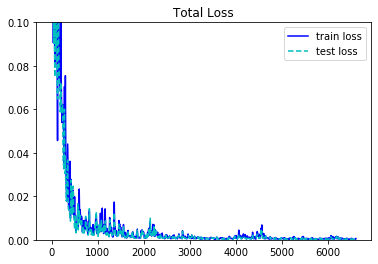

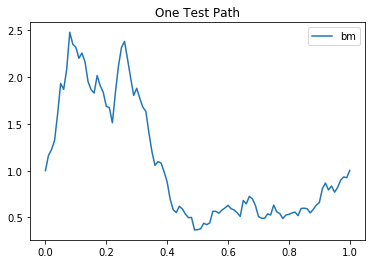

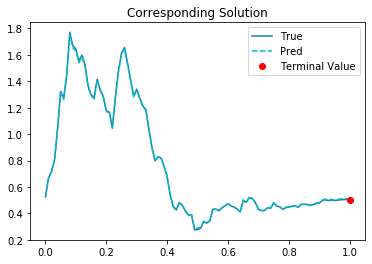

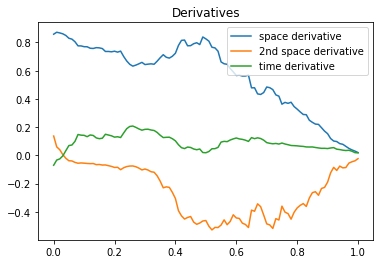

6611th Epoch:
traing loss is 0.0005613456014543772, test loss is 0.0004113492905162275, and learning rate is 0.0006947732763364911, elapsed is 4.09984278678894.
 
6621th Epoch:
traing loss is 0.000446427526185289, test loss is 0.00039166214992292225, and learning rate is 0.0006947732763364911, elapsed is 3.1324827671051025.
 
6631th Epoch:
traing loss is 0.00025747373001649976, test loss is 0.00033492344664409757, and learning rate is 0.0006947732763364911, elapsed is 3.1053006649017334.
 
6641th Epoch:
traing loss is 0.00017192590166814625, test loss is 0.00017389390268363059, and learning rate is 0.0006947732763364911, elapsed is 3.0551071166992188.
 
6651th Epoch:
traing loss is 9.562439663568512e-05, test loss is 0.00011000595986843109, and learning rate is 0.0006808778271079063, elapsed is 3.074986457824707.
 
6661th Epoch:
traing loss is 0.00022552258451469243, test loss is 0.00012009093188680708, and learning rate is 0.0006808778271079063, elapsed is 3.1089367866516113.
 
6671th

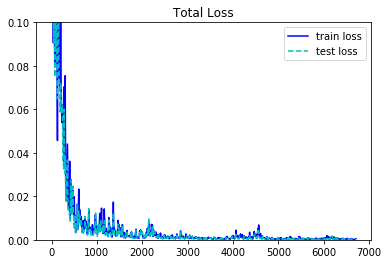

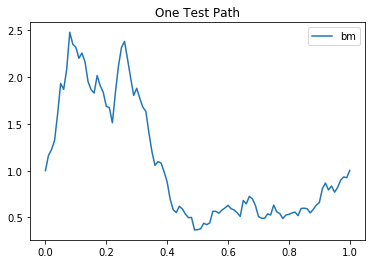

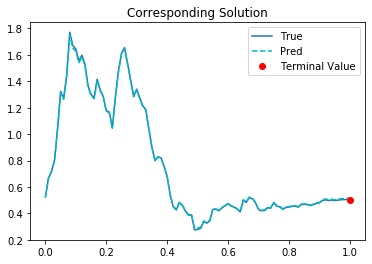

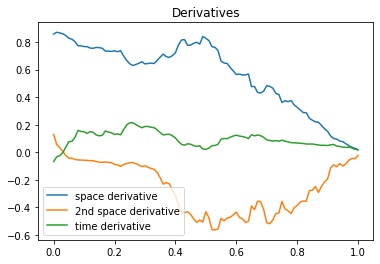

6711th Epoch:
traing loss is 0.0005004355916753411, test loss is 0.00033934772363863885, and learning rate is 0.0006672602612525225, elapsed is 4.0657806396484375.
 
6721th Epoch:
traing loss is 0.00026122306007891893, test loss is 0.00022994533355813473, and learning rate is 0.0006672602612525225, elapsed is 3.0996921062469482.
 
6731th Epoch:
traing loss is 0.00017141035641543567, test loss is 0.00023438695643562824, and learning rate is 0.0006672602612525225, elapsed is 3.040224313735962.
 
6741th Epoch:
traing loss is 0.00014253755216486752, test loss is 0.000121943601698149, and learning rate is 0.0006672602612525225, elapsed is 3.116377592086792.
 
6751th Epoch:
traing loss is 8.817749767331406e-05, test loss is 0.0001039635535562411, and learning rate is 0.0006539151072502136, elapsed is 3.0805234909057617.
 
6761th Epoch:
traing loss is 0.00019585550762712955, test loss is 0.00011917493975488469, and learning rate is 0.0006539151072502136, elapsed is 3.096100091934204.
 
6771th

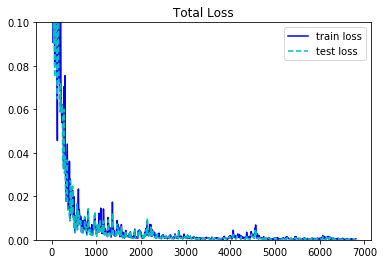

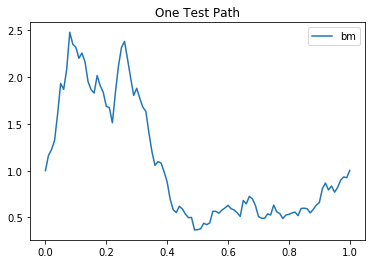

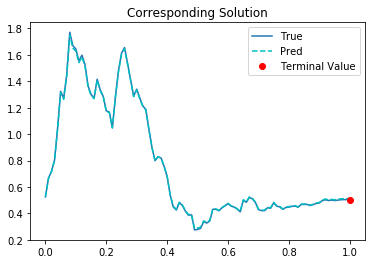

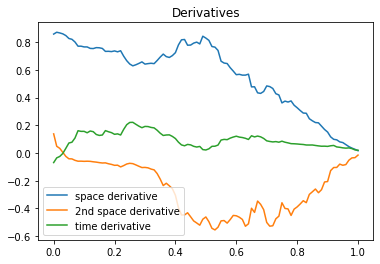

6811th Epoch:
traing loss is 0.0004262322327122092, test loss is 0.00029408623231574893, and learning rate is 0.0006408367771655321, elapsed is 4.1458868980407715.
 
6821th Epoch:
traing loss is 0.0002817675704136491, test loss is 0.0002474302309565246, and learning rate is 0.0006408367771655321, elapsed is 3.042635202407837.
 
6831th Epoch:
traing loss is 0.0001684363669482991, test loss is 0.0002262673806399107, and learning rate is 0.0006408367771655321, elapsed is 3.0561511516571045.
 
6841th Epoch:
traing loss is 0.0002606260823085904, test loss is 0.00023560722183901817, and learning rate is 0.0006408367771655321, elapsed is 3.1682310104370117.
 
6851th Epoch:
traing loss is 0.00012218821211718023, test loss is 0.0001383976632496342, and learning rate is 0.0006280200905166566, elapsed is 3.2770638465881348.
 
6861th Epoch:
traing loss is 0.0002787228731904179, test loss is 0.0001432394637959078, and learning rate is 0.0006280200905166566, elapsed is 3.117720603942871.
 
6871th Ep

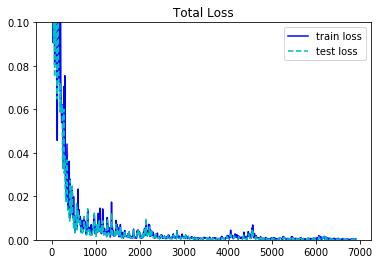

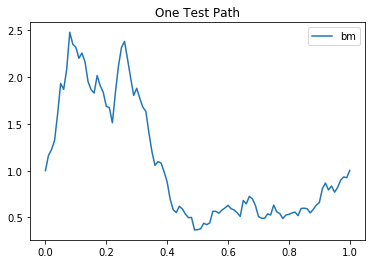

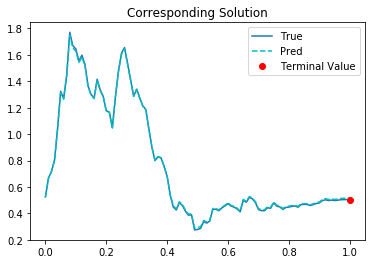

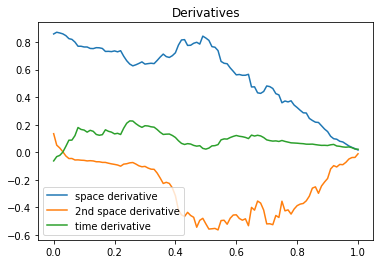

6911th Epoch:
traing loss is 0.00038407029933296144, test loss is 0.00022561581863556057, and learning rate is 0.0006154596921987832, elapsed is 4.034261465072632.
 
6921th Epoch:
traing loss is 0.00015281751984730363, test loss is 0.00013612749171443284, and learning rate is 0.0006154596921987832, elapsed is 3.0755131244659424.
 
6931th Epoch:
traing loss is 0.00010848657984752208, test loss is 0.0001584605051903054, and learning rate is 0.0006154596921987832, elapsed is 3.114344358444214.
 
6941th Epoch:
traing loss is 0.001230924273841083, test loss is 0.0006937059806659818, and learning rate is 0.0006154596921987832, elapsed is 3.046168088912964.
 
6951th Epoch:
traing loss is 0.0005082066054455936, test loss is 0.0004150292952544987, and learning rate is 0.0006031504599377513, elapsed is 3.10371470451355.
 
6961th Epoch:
traing loss is 0.0008701531332917511, test loss is 0.00035874167224392295, and learning rate is 0.0006031504599377513, elapsed is 3.13742733001709.
 
6971th Epoch

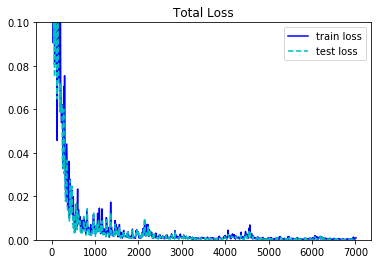

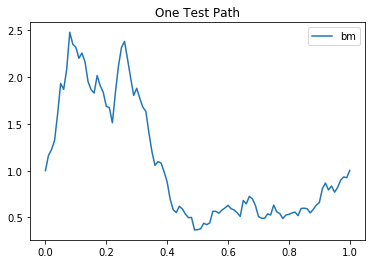

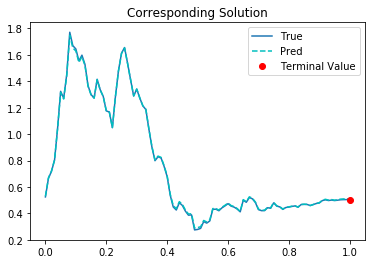

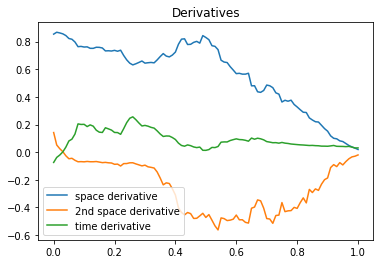

7011th Epoch:
traing loss is 0.00039353102329187095, test loss is 0.00028381479205563664, and learning rate is 0.0005910875042900443, elapsed is 4.043147563934326.
 
7021th Epoch:
traing loss is 0.0006149520631879568, test loss is 0.0005099732079543173, and learning rate is 0.0005910875042900443, elapsed is 3.1167538166046143.
 
7031th Epoch:
traing loss is 0.0002854216727428138, test loss is 0.0003531184047460556, and learning rate is 0.0005910875042900443, elapsed is 3.192624807357788.
 
7041th Epoch:
traing loss is 0.0009129404788836837, test loss is 0.0004098141798749566, and learning rate is 0.0005910875042900443, elapsed is 3.1090121269226074.
 
7051th Epoch:
traing loss is 0.0003086569777224213, test loss is 0.00031231908360496163, and learning rate is 0.0005792657611891627, elapsed is 3.174582004547119.
 
7061th Epoch:
traing loss is 0.0005459141102619469, test loss is 0.0004133573092985898, and learning rate is 0.0005792657611891627, elapsed is 2.994147777557373.
 
7071th Epoc

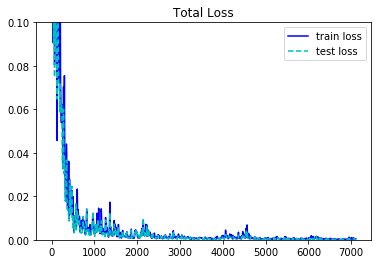

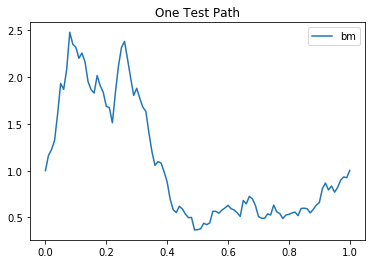

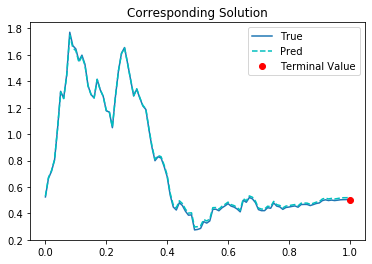

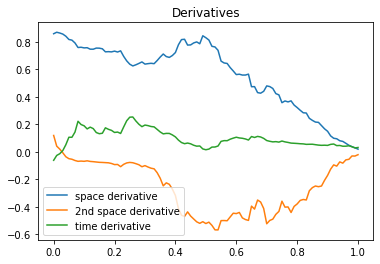

7111th Epoch:
traing loss is 0.00029638383421115577, test loss is 0.0001699893909972161, and learning rate is 0.0005676804576069117, elapsed is 4.012732982635498.
 
7121th Epoch:
traing loss is 0.0001526705891592428, test loss is 0.00016255053924396634, and learning rate is 0.0005676804576069117, elapsed is 3.0026590824127197.
 
7131th Epoch:
traing loss is 9.424702875548974e-05, test loss is 0.00012898299610242248, and learning rate is 0.0005676804576069117, elapsed is 3.116685628890991.
 
7141th Epoch:
traing loss is 0.0005909505998715758, test loss is 0.0004773658874910325, and learning rate is 0.0005676804576069117, elapsed is 3.0625200271606445.
 
7151th Epoch:
traing loss is 0.00028039352037012577, test loss is 0.00025060801999643445, and learning rate is 0.0005563268787227571, elapsed is 3.079131841659546.
 
7161th Epoch:
traing loss is 0.00039432651828974485, test loss is 0.0002817124768625945, and learning rate is 0.0005563268787227571, elapsed is 3.109783887863159.
 
7171th E

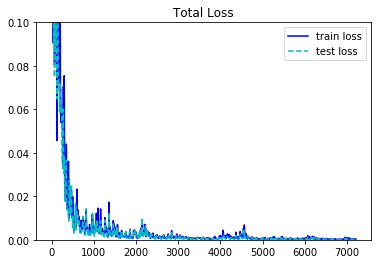

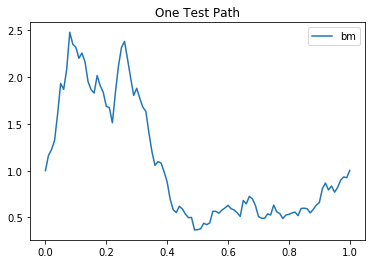

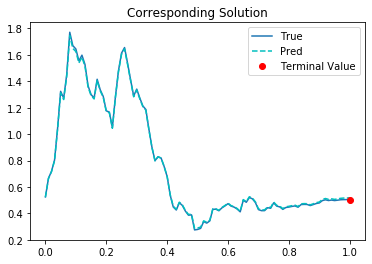

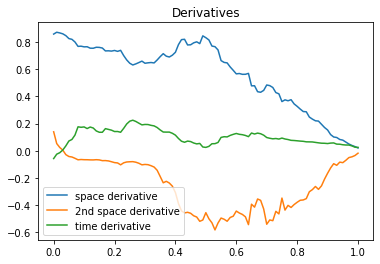

7211th Epoch:
traing loss is 0.00046409328933805227, test loss is 0.00032671133521944284, and learning rate is 0.0005452003097161651, elapsed is 4.024752855300903.
 
7221th Epoch:
traing loss is 0.00016632411279715598, test loss is 0.0001640603441046551, and learning rate is 0.0005452003097161651, elapsed is 3.0454938411712646.
 
7231th Epoch:
traing loss is 0.00012649352720472962, test loss is 0.0001841574121499434, and learning rate is 0.0005452003097161651, elapsed is 3.0940310955047607.
 
7241th Epoch:
traing loss is 0.000322631181916222, test loss is 0.00025233582709915936, and learning rate is 0.0005452003097161651, elapsed is 2.954939603805542.
 
7251th Epoch:
traing loss is 0.00013425422366708517, test loss is 0.00014371763973031193, and learning rate is 0.0005342963268049061, elapsed is 3.054309606552124.
 
7261th Epoch:
traing loss is 0.00023221361334435642, test loss is 0.00015593752323184162, and learning rate is 0.0005342963268049061, elapsed is 3.039660692214966.
 
7271th

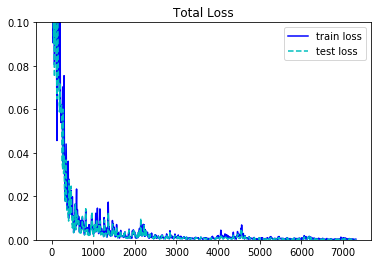

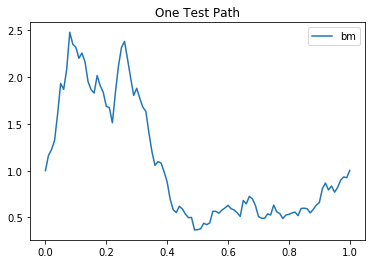

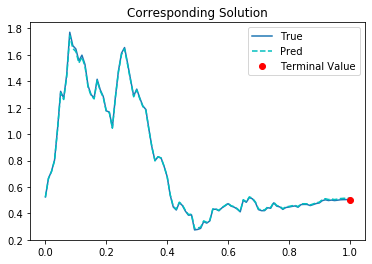

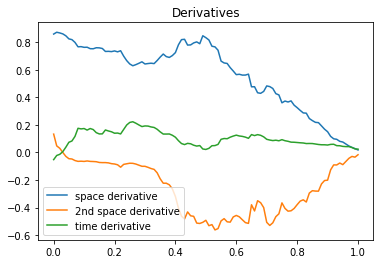

7311th Epoch:
traing loss is 0.0004818718880414963, test loss is 0.00032983021810650826, and learning rate is 0.000523610389791429, elapsed is 4.043477535247803.
 
7321th Epoch:
traing loss is 0.0001639488327782601, test loss is 0.0001532646274426952, and learning rate is 0.000523610389791429, elapsed is 3.061920166015625.
 
7331th Epoch:
traing loss is 0.00012793188216164708, test loss is 0.00018620173796080053, and learning rate is 0.000523610389791429, elapsed is 3.0922324657440186.
 
7341th Epoch:
traing loss is 0.00021075397671665996, test loss is 0.0001626096200197935, and learning rate is 0.000523610389791429, elapsed is 3.1502039432525635.
 
7351th Epoch:
traing loss is 0.00010068552364828065, test loss is 0.0001112191894208081, and learning rate is 0.0005131382495164871, elapsed is 3.088477373123169.
 
7361th Epoch:
traing loss is 0.00017813508748076856, test loss is 0.00011348498810548335, and learning rate is 0.0005131382495164871, elapsed is 3.124690055847168.
 
7371th Epoc

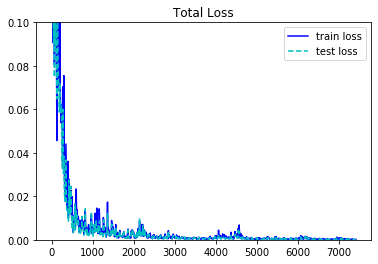

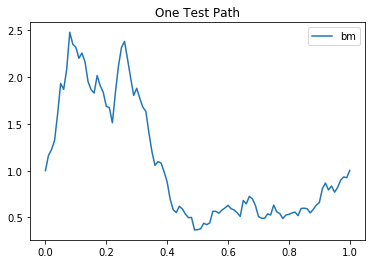

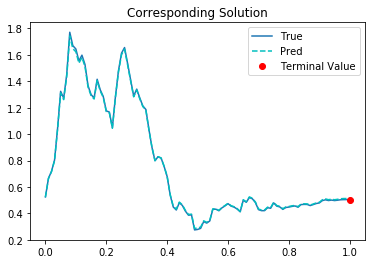

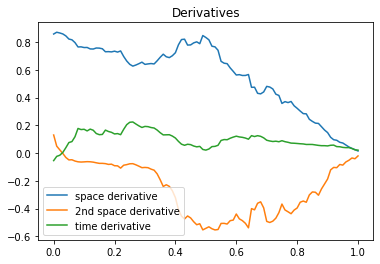

7411th Epoch:
traing loss is 0.0004130752058699727, test loss is 0.0002703073259908706, and learning rate is 0.0005028754821978509, elapsed is 4.014016389846802.
 
7421th Epoch:
traing loss is 0.0001335618580924347, test loss is 0.00012389078619889915, and learning rate is 0.0005028754821978509, elapsed is 2.9985759258270264.
 
7431th Epoch:
traing loss is 0.00010681153071345761, test loss is 0.0001567427534610033, and learning rate is 0.0005028754821978509, elapsed is 3.0423927307128906.
 
7441th Epoch:
traing loss is 0.0001295447291340679, test loss is 0.00011563571752049029, and learning rate is 0.0005028754821978509, elapsed is 3.094052314758301.
 
7451th Epoch:
traing loss is 8.169066131813452e-05, test loss is 9.285323176300153e-05, and learning rate is 0.0004928179550915956, elapsed is 3.0551562309265137.
 
7461th Epoch:
traing loss is 0.0001624805445317179, test loss is 9.826226596487686e-05, and learning rate is 0.0004928179550915956, elapsed is 3.0514979362487793.
 
7471th Ep

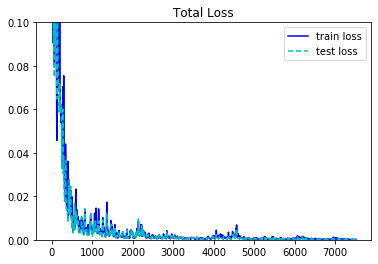

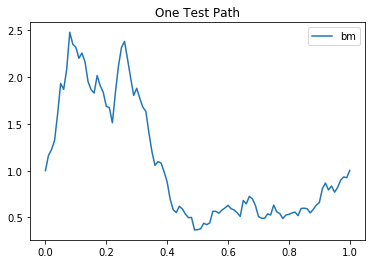

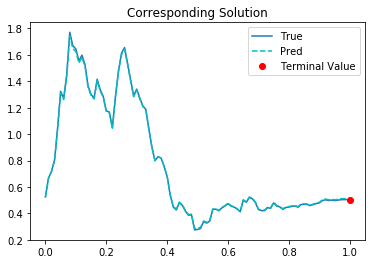

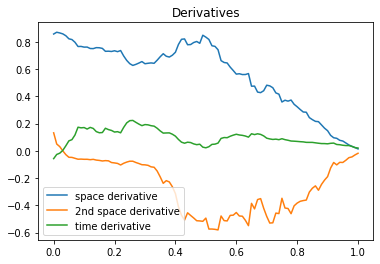

7511th Epoch:
traing loss is 0.0003690563316922635, test loss is 0.00024119803856592625, and learning rate is 0.0004829615936614573, elapsed is 4.147614240646362.
 
7521th Epoch:
traing loss is 0.0001326190249528736, test loss is 0.00011930034088436514, and learning rate is 0.0004829615936614573, elapsed is 3.119617462158203.
 
7531th Epoch:
traing loss is 9.958224836736917e-05, test loss is 0.00014633229875471443, and learning rate is 0.0004829615936614573, elapsed is 3.106959104537964.
 
7541th Epoch:
traing loss is 9.900875011226162e-05, test loss is 9.618177864467725e-05, and learning rate is 0.0004829615936614573, elapsed is 3.125514268875122.
 
7551th Epoch:
traing loss is 7.331877714022994e-05, test loss is 8.362714288523421e-05, and learning rate is 0.00047330238157883286, elapsed is 3.0750467777252197.
 
7561th Epoch:
traing loss is 0.00015029640053398907, test loss is 9.015073737828061e-05, and learning rate is 0.00047330238157883286, elapsed is 3.087975263595581.
 
7571th Ep

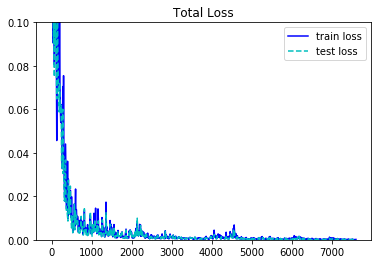

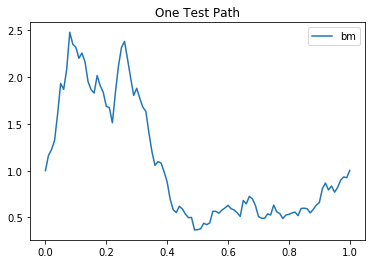

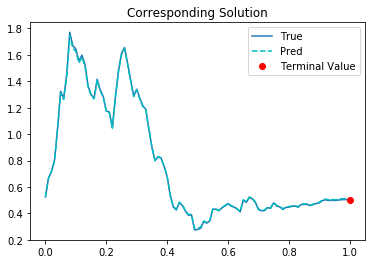

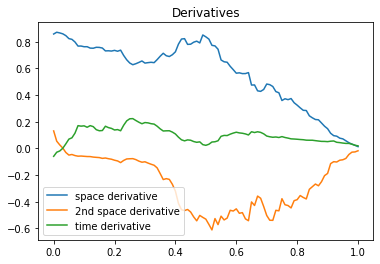

7611th Epoch:
traing loss is 0.000330625131027773, test loss is 0.00021823096903972328, and learning rate is 0.00046383636072278023, elapsed is 4.030153036117554.
 
7621th Epoch:
traing loss is 0.00012920834706164896, test loss is 0.00011350202839821577, and learning rate is 0.00046383636072278023, elapsed is 3.1135668754577637.
 
7631th Epoch:
traing loss is 9.511003008810803e-05, test loss is 0.00013817766739521176, and learning rate is 0.00046383636072278023, elapsed is 2.9871883392333984.
 
7641th Epoch:
traing loss is 8.80044317455031e-05, test loss is 8.640791202196851e-05, and learning rate is 0.00046383636072278023, elapsed is 3.01324462890625.
 
7651th Epoch:
traing loss is 6.821528950240463e-05, test loss is 7.72708299336955e-05, and learning rate is 0.00045455960207618773, elapsed is 3.115471363067627.
 
7661th Epoch:
traing loss is 0.00014373657177202404, test loss is 8.519148104824126e-05, and learning rate is 0.00045455960207618773, elapsed is 3.0316991806030273.
 
7671th

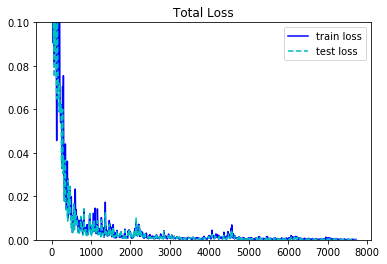

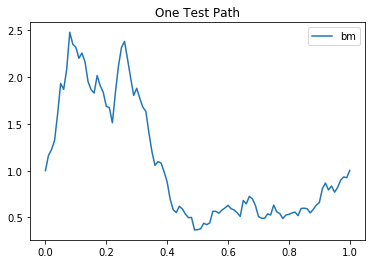

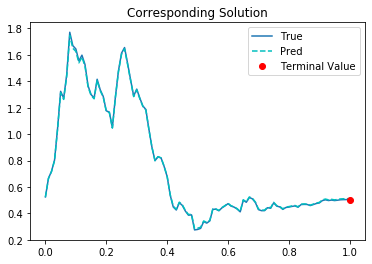

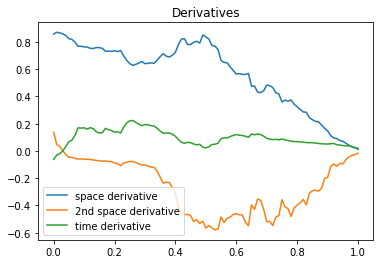

7711th Epoch:
traing loss is 0.00030511085060425103, test loss is 0.0002016777143580839, and learning rate is 0.0004454684385564178, elapsed is 4.118956565856934.
 
7721th Epoch:
traing loss is 0.00012831538333557546, test loss is 0.0001113159378292039, and learning rate is 0.0004454684385564178, elapsed is 3.1230361461639404.
 
7731th Epoch:
traing loss is 9.273439354728907e-05, test loss is 0.00013280048733577132, and learning rate is 0.0004454684385564178, elapsed is 3.097177267074585.
 
7741th Epoch:
traing loss is 8.50413998705335e-05, test loss is 8.252510451711714e-05, and learning rate is 0.0004454684385564178, elapsed is 3.0968329906463623.
 
7751th Epoch:
traing loss is 6.665570253971964e-05, test loss is 7.506081601604819e-05, and learning rate is 0.00043655908666551113, elapsed is 3.094496250152588.
 
7761th Epoch:
traing loss is 0.00013541399675887078, test loss is 8.129261550493538e-05, and learning rate is 0.00043655908666551113, elapsed is 3.1057910919189453.
 
7771th E

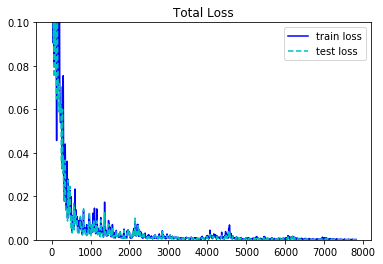

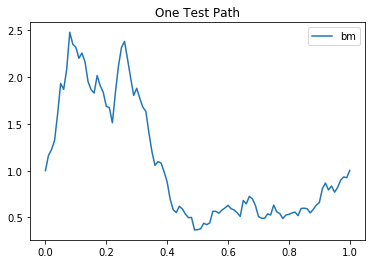

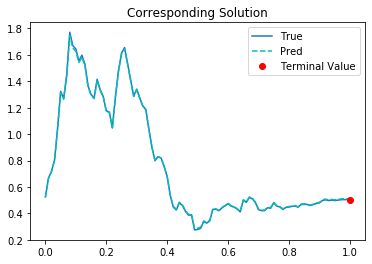

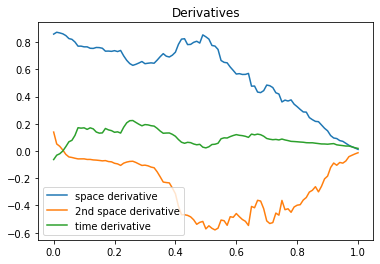

7811th Epoch:
traing loss is 0.0002877700899261981, test loss is 0.00019147360580973327, and learning rate is 0.00042782790842466056, elapsed is 4.0096166133880615.
 
7821th Epoch:
traing loss is 0.00012524261546786875, test loss is 0.00010684819426387548, and learning rate is 0.00042782790842466056, elapsed is 3.1180667877197266.
 
7831th Epoch:
traing loss is 8.802219235803932e-05, test loss is 0.0001261322759091854, and learning rate is 0.00042782790842466056, elapsed is 3.0546302795410156.
 
7841th Epoch:
traing loss is 8.508839528076351e-05, test loss is 7.991606980795041e-05, and learning rate is 0.00042782790842466056, elapsed is 3.1085424423217773.
 
7851th Epoch:
traing loss is 6.354677316267043e-05, test loss is 7.108994759619236e-05, and learning rate is 0.0004192713531665504, elapsed is 3.0241878032684326.
 
7861th Epoch:
traing loss is 0.00012677082850132138, test loss is 7.658399408683181e-05, and learning rate is 0.0004192713531665504, elapsed is 3.098884344100952.
 
787

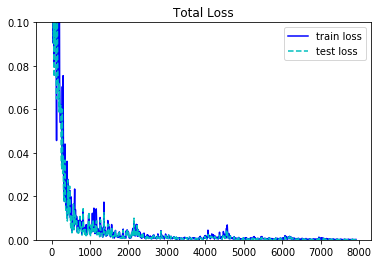

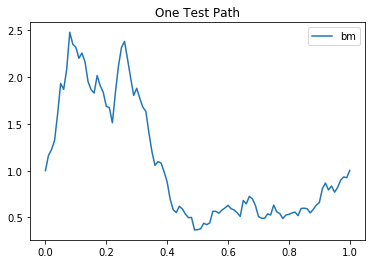

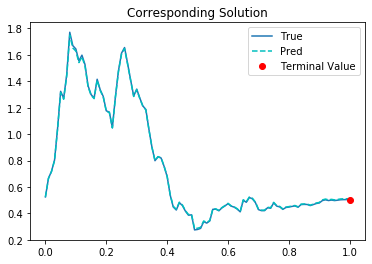

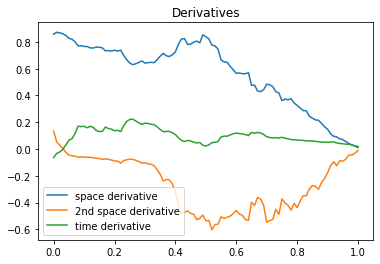

7911th Epoch:
traing loss is 0.00027690856950357556, test loss is 0.00018367629672866315, and learning rate is 0.0004108859575353563, elapsed is 4.05424427986145.
 
7921th Epoch:
traing loss is 0.00012301756942179054, test loss is 0.00010479710181243718, and learning rate is 0.0004108859575353563, elapsed is 3.018649101257324.
 
7931th Epoch:
traing loss is 8.702065679244697e-05, test loss is 0.00012271481682546437, and learning rate is 0.0004108859575353563, elapsed is 3.075481414794922.
 
7941th Epoch:
traing loss is 8.368209091713652e-05, test loss is 7.837351586204022e-05, and learning rate is 0.0004108859575353563, elapsed is 2.968579053878784.
 
7951th Epoch:
traing loss is 6.023605237714946e-05, test loss is 6.78792130202055e-05, and learning rate is 0.0004026682290714234, elapsed is 3.0978500843048096.
 
7961th Epoch:
traing loss is 0.00012013460946036503, test loss is 7.323454337893054e-05, and learning rate is 0.0004026682290714234, elapsed is 3.1300241947174072.
 
7971th Epo

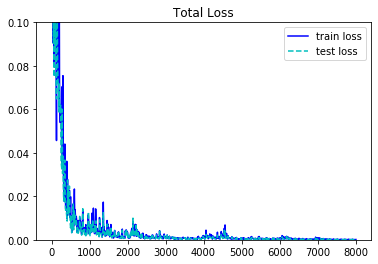

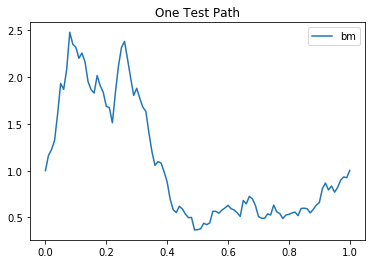

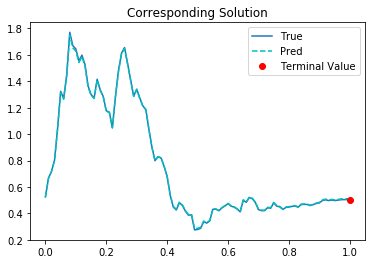

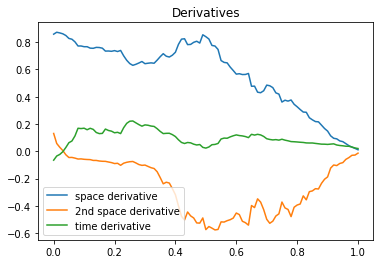

8011th Epoch:
traing loss is 0.0002678825694601983, test loss is 0.00017931938054971397, and learning rate is 0.00039461487904191017, elapsed is 4.056264877319336.
 
8021th Epoch:
traing loss is 0.00011823813110822812, test loss is 9.985271753976122e-05, and learning rate is 0.00039461487904191017, elapsed is 3.1510238647460938.
 
8031th Epoch:
traing loss is 8.283302304334939e-05, test loss is 0.00011764784721890464, and learning rate is 0.00039461487904191017, elapsed is 3.102970600128174.
 
8041th Epoch:
traing loss is 8.302293281303719e-05, test loss is 7.595613715238869e-05, and learning rate is 0.00039461487904191017, elapsed is 3.0607664585113525.
 
8051th Epoch:
traing loss is 5.89376941206865e-05, test loss is 6.649353599641472e-05, and learning rate is 0.0003867225896101445, elapsed is 3.083627223968506.
 
8061th Epoch:
traing loss is 0.00011423173418734223, test loss is 7.108444697223604e-05, and learning rate is 0.0003867225896101445, elapsed is 3.1612226963043213.
 
8071th

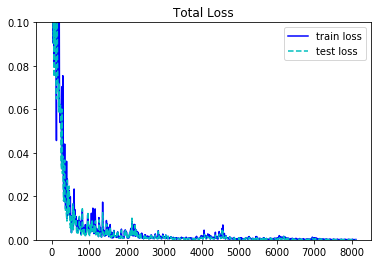

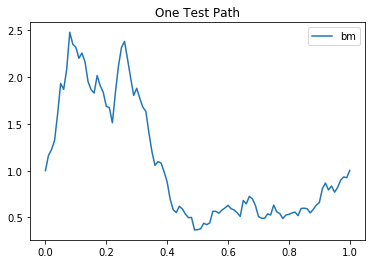

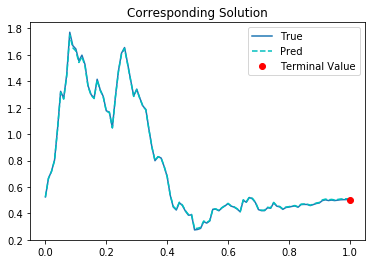

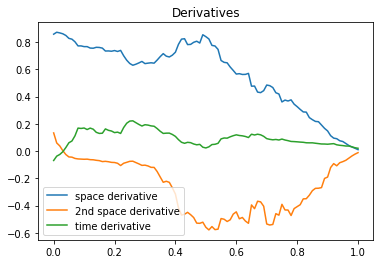

8111th Epoch:
traing loss is 0.00025565168471075594, test loss is 0.00017268533702008426, and learning rate is 0.00037898815935477614, elapsed is 4.104108572006226.
 
8121th Epoch:
traing loss is 0.00011181024456163868, test loss is 9.496849088463932e-05, and learning rate is 0.00037898815935477614, elapsed is 3.085742235183716.
 
8131th Epoch:
traing loss is 7.886173989390954e-05, test loss is 0.00011181434092577547, and learning rate is 0.00037898815935477614, elapsed is 3.1347315311431885.
 
8141th Epoch:
traing loss is 8.359803905477747e-05, test loss is 7.738178101135418e-05, and learning rate is 0.00037898815935477614, elapsed is 3.0834739208221436.
 
8151th Epoch:
traing loss is 5.776345278718509e-05, test loss is 6.595873855985701e-05, and learning rate is 0.0003714083868544549, elapsed is 3.1585733890533447.
 
8161th Epoch:
traing loss is 0.00011306280794087797, test loss is 6.894723628647625e-05, and learning rate is 0.0003714083868544549, elapsed is 3.063563585281372.
 
8171

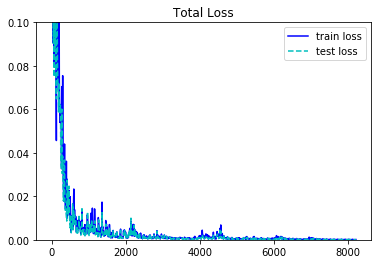

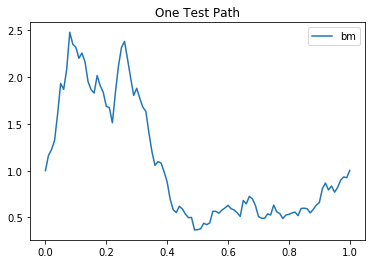

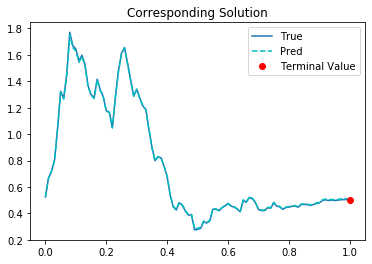

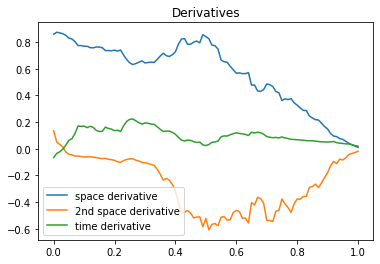

8211th Epoch:
traing loss is 0.00024590411339886487, test loss is 0.00016750914801377803, and learning rate is 0.00036398021620698273, elapsed is 4.115468263626099.
 
8221th Epoch:
traing loss is 0.00010402098268968984, test loss is 8.850869198795408e-05, and learning rate is 0.00036398021620698273, elapsed is 3.0535998344421387.
 
8231th Epoch:
traing loss is 7.249778718687594e-05, test loss is 0.0001027532052830793, and learning rate is 0.00036398021620698273, elapsed is 3.073185920715332.
 
8241th Epoch:
traing loss is 8.130559581331909e-05, test loss is 7.308941712835804e-05, and learning rate is 0.00036398021620698273, elapsed is 3.141510009765625.
 
8251th Epoch:
traing loss is 5.512802817975171e-05, test loss is 6.384462903952226e-05, and learning rate is 0.00035670064971782267, elapsed is 3.143096446990967.
 
8261th Epoch:
traing loss is 0.0001079303547157906, test loss is 6.638040213147178e-05, and learning rate is 0.00035670064971782267, elapsed is 3.120128870010376.
 
8271th

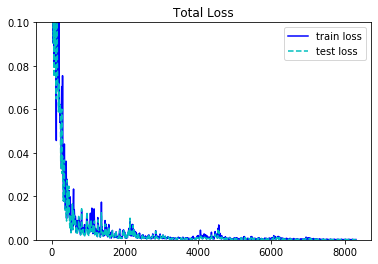

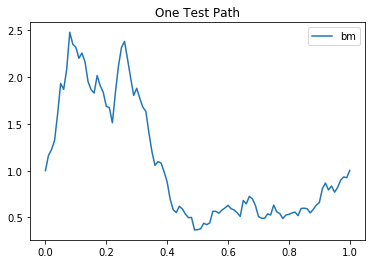

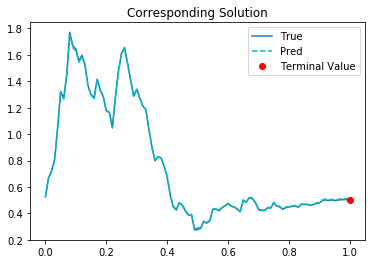

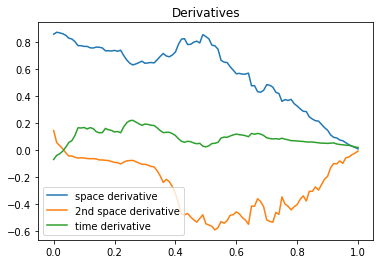

8311th Epoch:
traing loss is 0.0002389932342339307, test loss is 0.0001648776524234563, and learning rate is 0.00034956663148477674, elapsed is 4.13278341293335.
 
8321th Epoch:
traing loss is 0.00010128015128429979, test loss is 8.655276178615168e-05, and learning rate is 0.00034956663148477674, elapsed is 3.04618239402771.
 
8331th Epoch:
traing loss is 7.176500366767868e-05, test loss is 0.00010079755884362385, and learning rate is 0.00034956663148477674, elapsed is 3.064152479171753.
 
8341th Epoch:
traing loss is 7.996067870408297e-05, test loss is 7.465628004865721e-05, and learning rate is 0.00034956663148477674, elapsed is 3.1172635555267334.
 
8351th Epoch:
traing loss is 5.551573121920228e-05, test loss is 6.371827475959435e-05, and learning rate is 0.00034257530933246017, elapsed is 3.0727310180664062.
 
8361th Epoch:
traing loss is 0.00010323220340069383, test loss is 6.490620580734685e-05, and learning rate is 0.00034257530933246017, elapsed is 3.0249276161193848.
 
8371th

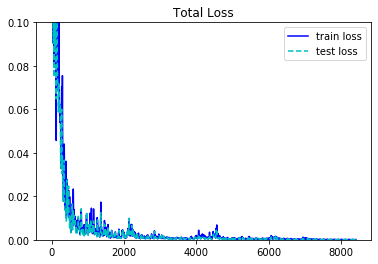

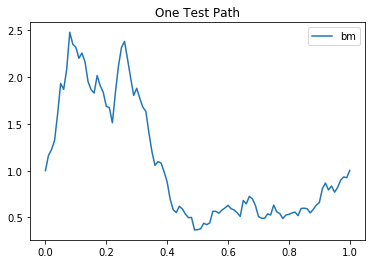

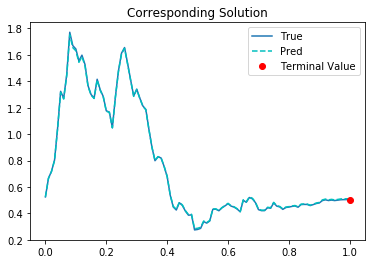

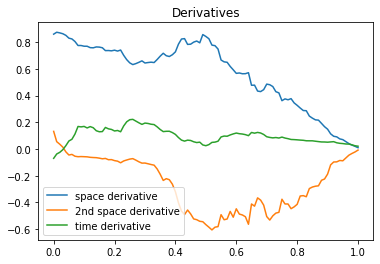

8411th Epoch:
traing loss is 0.0002279627078678459, test loss is 0.00015523238107562065, and learning rate is 0.00033572380198165774, elapsed is 4.033830165863037.
 
8421th Epoch:
traing loss is 9.397578833159059e-05, test loss is 8.044604328460991e-05, and learning rate is 0.00033572380198165774, elapsed is 3.1483209133148193.
 
8431th Epoch:
traing loss is 6.51049631414935e-05, test loss is 9.193384903483093e-05, and learning rate is 0.00033572380198165774, elapsed is 3.128140449523926.
 
8441th Epoch:
traing loss is 7.845282380003482e-05, test loss is 7.030640699667856e-05, and learning rate is 0.00033572380198165774, elapsed is 3.0898478031158447.
 
8451th Epoch:
traing loss is 5.5558168241987005e-05, test loss is 6.286687130341306e-05, and learning rate is 0.0003290093154646456, elapsed is 3.089592456817627.
 
8461th Epoch:
traing loss is 0.0001025973615469411, test loss is 6.241231312742457e-05, and learning rate is 0.0003290093154646456, elapsed is 3.0771756172180176.
 
8471th E

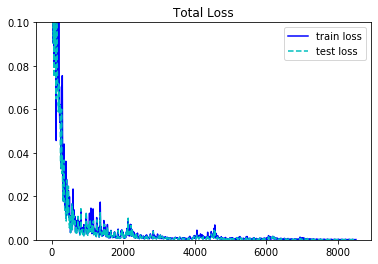

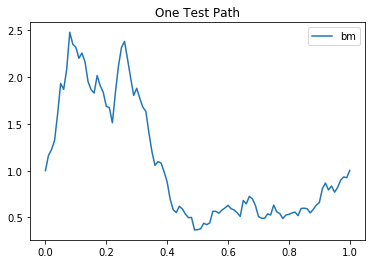

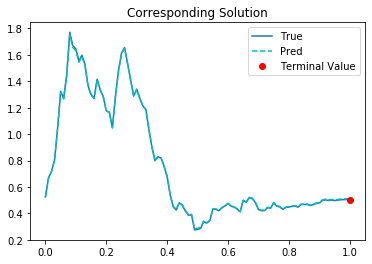

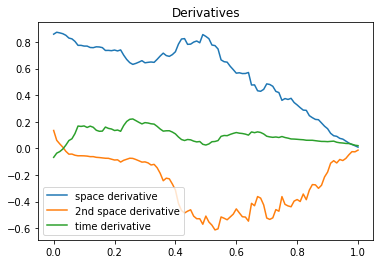

8511th Epoch:
traing loss is 0.00022140963119454682, test loss is 0.00015229331620503217, and learning rate is 0.0003224291722290218, elapsed is 4.016741514205933.
 
8521th Epoch:
traing loss is 9.091461106436327e-05, test loss is 7.661408744752407e-05, and learning rate is 0.0003224291722290218, elapsed is 3.0524282455444336.
 
8531th Epoch:
traing loss is 6.501723692053929e-05, test loss is 9.073002001969144e-05, and learning rate is 0.0003224291722290218, elapsed is 3.1946475505828857.
 
8541th Epoch:
traing loss is 7.706587348366156e-05, test loss is 7.333189569180831e-05, and learning rate is 0.0003224291722290218, elapsed is 3.07951021194458.
 
8551th Epoch:
traing loss is 5.5121239711297676e-05, test loss is 6.373725045705214e-05, and learning rate is 0.0003159805783070624, elapsed is 3.051905393600464.
 
8561th Epoch:
traing loss is 9.689928992884234e-05, test loss is 6.167893297970295e-05, and learning rate is 0.0003159805783070624, elapsed is 3.0934646129608154.
 
8571th Epoc

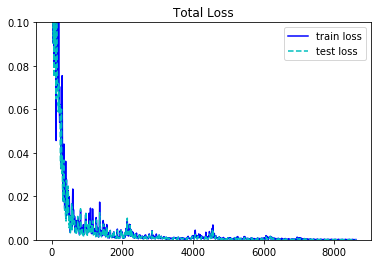

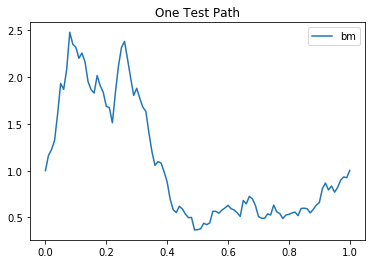

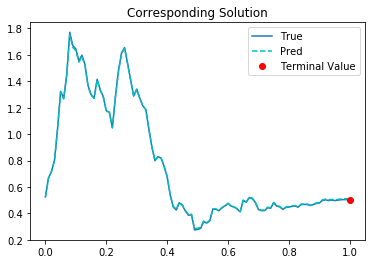

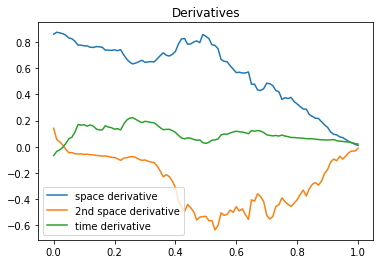

8611th Epoch:
traing loss is 0.00021022804139647633, test loss is 0.00014359632041305304, and learning rate is 0.00030966097256168723, elapsed is 4.049853324890137.
 
8621th Epoch:
traing loss is 8.468054147670045e-05, test loss is 7.170917524490505e-05, and learning rate is 0.00030966097256168723, elapsed is 2.9624087810516357.
 
8631th Epoch:
traing loss is 5.6817661970853806e-05, test loss is 8.020860695978627e-05, and learning rate is 0.00030966097256168723, elapsed is 3.1477487087249756.
 
8641th Epoch:
traing loss is 7.82420247560367e-05, test loss is 6.741559627698734e-05, and learning rate is 0.00030966097256168723, elapsed is 3.1178672313690186.
 
8651th Epoch:
traing loss is 5.4799020290374756e-05, test loss is 6.302235851762816e-05, and learning rate is 0.0003034677356481552, elapsed is 3.1054816246032715.
 
8661th Epoch:
traing loss is 9.767695883056149e-05, test loss is 6.0722912166966125e-05, and learning rate is 0.0003034677356481552, elapsed is 3.0364229679107666.
 
867

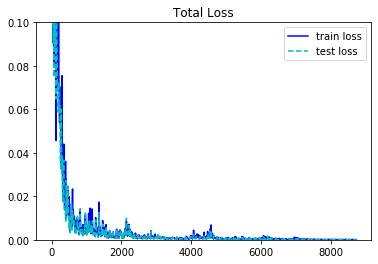

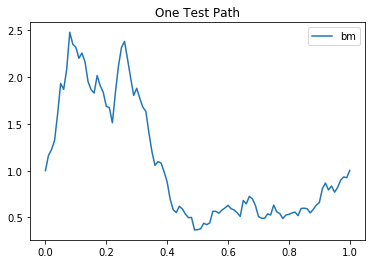

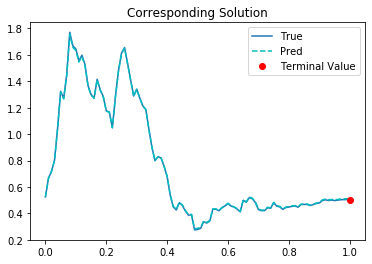

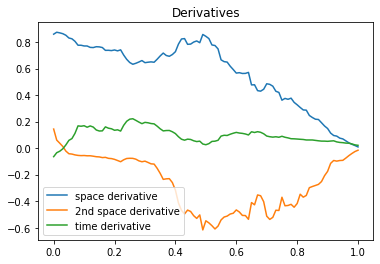

8711th Epoch:
traing loss is 0.00020645638869609684, test loss is 0.00014278781600296497, and learning rate is 0.00029739842284470797, elapsed is 3.994354486465454.
 
8721th Epoch:
traing loss is 8.405405969824642e-05, test loss is 6.98761796229519e-05, and learning rate is 0.00029739842284470797, elapsed is 3.0128653049468994.
 
8731th Epoch:
traing loss is 5.7203564210794866e-05, test loss is 7.943002128740773e-05, and learning rate is 0.00029739842284470797, elapsed is 3.1041321754455566.
 
8741th Epoch:
traing loss is 7.343990728259087e-05, test loss is 7.157125946832821e-05, and learning rate is 0.00029739842284470797, elapsed is 3.079824209213257.
 
8751th Epoch:
traing loss is 5.5524695198982954e-05, test loss is 6.388029578374699e-05, and learning rate is 0.00029145044391043484, elapsed is 3.0790364742279053.
 
8761th Epoch:
traing loss is 9.171897545456886e-05, test loss is 5.889042222406715e-05, and learning rate is 0.00029145044391043484, elapsed is 3.0823817253112793.
 
877

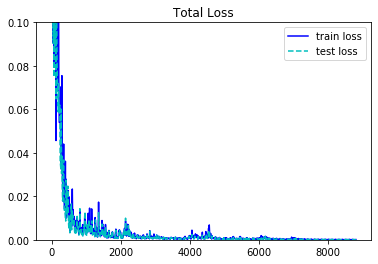

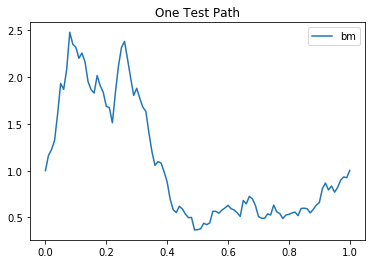

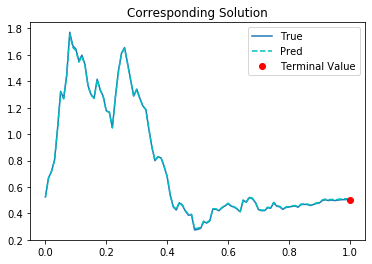

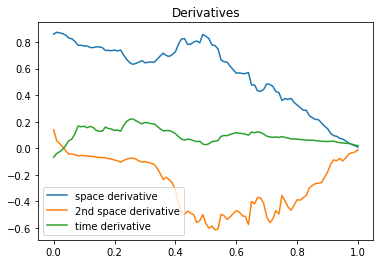

8811th Epoch:
traing loss is 0.00019734562374651432, test loss is 0.00013159906666260213, and learning rate is 0.00028562144143506885, elapsed is 4.009132623672485.
 
8821th Epoch:
traing loss is 7.577169162686914e-05, test loss is 6.469817890319973e-05, and learning rate is 0.00028562144143506885, elapsed is 3.098322868347168.
 
8831th Epoch:
traing loss is 5.024289566790685e-05, test loss is 6.984989158809185e-05, and learning rate is 0.00028562144143506885, elapsed is 3.0196802616119385.
 
8841th Epoch:
traing loss is 8.237664587795734e-05, test loss is 6.505712372018024e-05, and learning rate is 0.00028562144143506885, elapsed is 3.006624460220337.
 
8851th Epoch:
traing loss is 5.680464892066084e-05, test loss is 6.340417894534767e-05, and learning rate is 0.00027990899980068207, elapsed is 3.0136730670928955.
 
8861th Epoch:
traing loss is 0.00010176459909416735, test loss is 6.060425948817283e-05, and learning rate is 0.00027990899980068207, elapsed is 3.082613706588745.
 
8871t

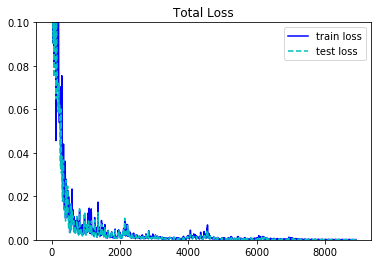

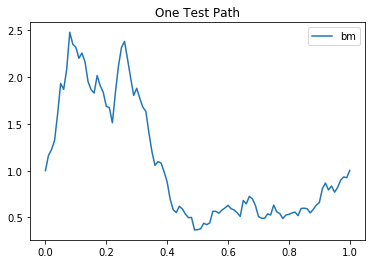

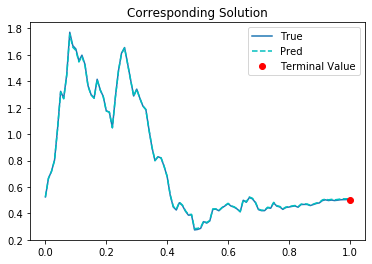

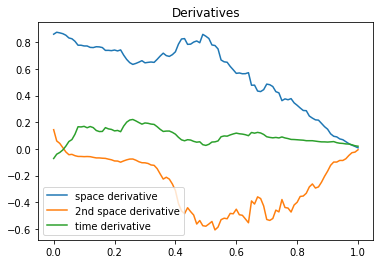

8911th Epoch:
traing loss is 0.00019527060794644058, test loss is 0.0001364982163067907, and learning rate is 0.0002743108489084989, elapsed is 4.032451391220093.
 
8921th Epoch:
traing loss is 8.251488907262683e-05, test loss is 6.625366950174794e-05, and learning rate is 0.0002743108489084989, elapsed is 3.1695759296417236.
 
8931th Epoch:
traing loss is 5.144227179698646e-05, test loss is 7.102530071279034e-05, and learning rate is 0.0002743108489084989, elapsed is 3.1155846118927.
 
8941th Epoch:
traing loss is 7.728138007223606e-05, test loss is 7.645935693290085e-05, and learning rate is 0.0002743108489084989, elapsed is 3.1568527221679688.
 
8951th Epoch:
traing loss is 6.033486715750769e-05, test loss is 6.658171332674101e-05, and learning rate is 0.00026882460224442184, elapsed is 3.036327362060547.
 
8961th Epoch:
traing loss is 9.45327992667444e-05, test loss is 6.105928332544863e-05, and learning rate is 0.00026882460224442184, elapsed is 3.092430591583252.
 
8971th Epoch:


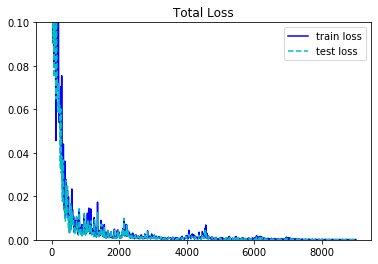

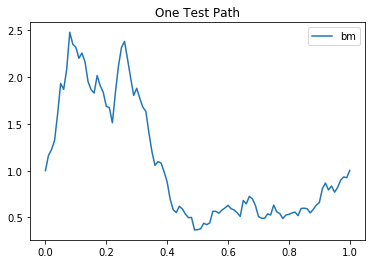

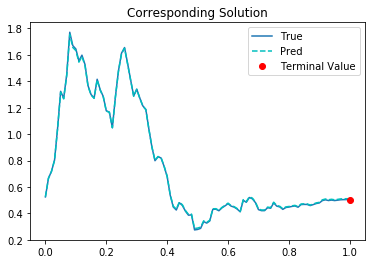

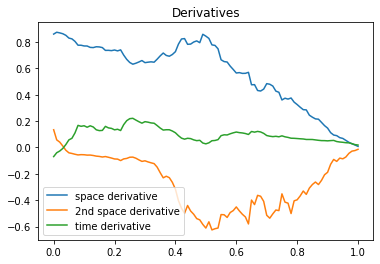

9011th Epoch:
traing loss is 0.00018366368021816015, test loss is 0.00011686496145557612, and learning rate is 0.0002634481352288276, elapsed is 4.068301439285278.
 
9021th Epoch:
traing loss is 7.074861059663817e-05, test loss is 6.298418884398416e-05, and learning rate is 0.0002634481352288276, elapsed is 3.02748703956604.
 
9031th Epoch:
traing loss is 4.461496791918762e-05, test loss is 6.085784116294235e-05, and learning rate is 0.0002634481352288276, elapsed is 3.0823965072631836.
 
9041th Epoch:
traing loss is 0.00010796120477607474, test loss is 6.639125058427453e-05, and learning rate is 0.0002634481352288276, elapsed is 3.1456966400146484.
 
9051th Epoch:
traing loss is 6.626315007451922e-05, test loss is 6.981602928135544e-05, and learning rate is 0.0002581791777629405, elapsed is 3.1219615936279297.
 
9061th Epoch:
traing loss is 0.00013312797818798572, test loss is 7.243218715302646e-05, and learning rate is 0.0002581791777629405, elapsed is 3.0208635330200195.
 
9071th Ep

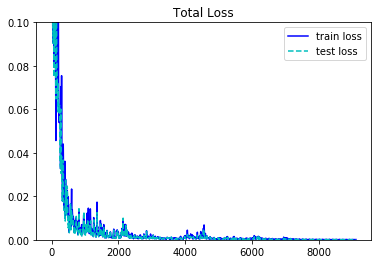

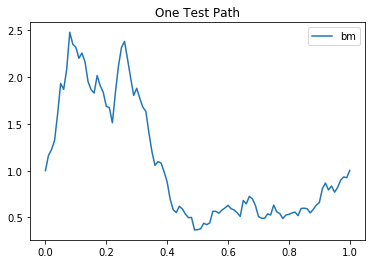

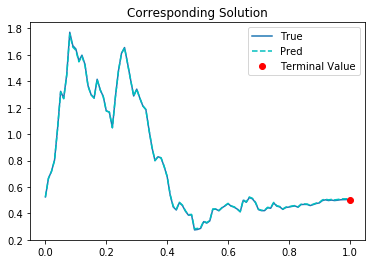

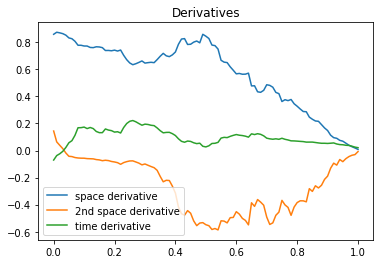

9111th Epoch:
traing loss is 0.00019165209960192442, test loss is 0.00013124353426974267, and learning rate is 0.0002530156052671373, elapsed is 4.011179447174072.
 
9121th Epoch:
traing loss is 8.386358240386471e-05, test loss is 6.489768566098064e-05, and learning rate is 0.0002530156052671373, elapsed is 3.0190491676330566.
 
9131th Epoch:
traing loss is 4.9369984481018037e-05, test loss is 6.695442425552756e-05, and learning rate is 0.0002530156052671373, elapsed is 3.0057268142700195.
 
9141th Epoch:
traing loss is 0.0001139998494181782, test loss is 9.609958215150982e-05, and learning rate is 0.0002530156052671373, elapsed is 3.0872268676757812.
 
9151th Epoch:
traing loss is 7.981538510648534e-05, test loss is 8.135262760333717e-05, and learning rate is 0.00024795529316179454, elapsed is 3.156684398651123.
 
9161th Epoch:
traing loss is 0.00012849211634602398, test loss is 7.720461144344881e-05, and learning rate is 0.00024795529316179454, elapsed is 3.133819580078125.
 
9171th 

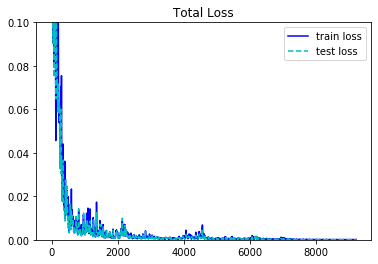

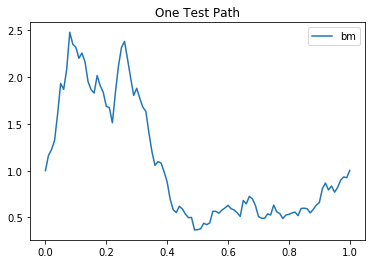

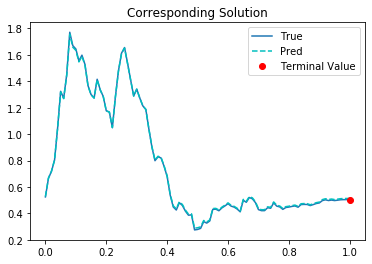

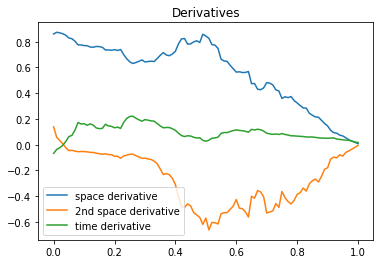

9211th Epoch:
traing loss is 0.00017918481898959726, test loss is 9.189919364871457e-05, and learning rate is 0.0002429961896268651, elapsed is 4.024720907211304.
 
9221th Epoch:
traing loss is 7.495830504922196e-05, test loss is 7.214760989882052e-05, and learning rate is 0.0002429961896268651, elapsed is 3.020563840866089.
 
9231th Epoch:
traing loss is 5.108527693664655e-05, test loss is 6.511033279821277e-05, and learning rate is 0.0002429961896268651, elapsed is 3.0270142555236816.
 
9241th Epoch:
traing loss is 0.0001788178487913683, test loss is 8.869844168657437e-05, and learning rate is 0.0002429961896268651, elapsed is 3.016484260559082.
 
9251th Epoch:
traing loss is 9.074151603272185e-05, test loss is 8.602198795415461e-05, and learning rate is 0.00023813627194613218, elapsed is 3.0501108169555664.
 
9261th Epoch:
traing loss is 0.00020914251217618585, test loss is 0.00010453449067426845, and learning rate is 0.00023813627194613218, elapsed is 3.0511090755462646.
 
9271th E

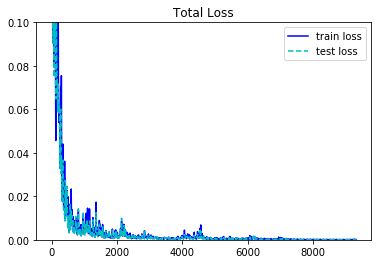

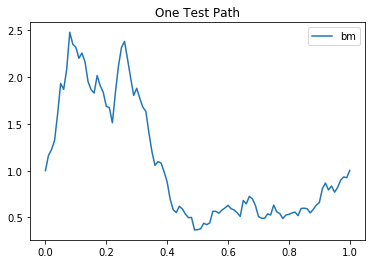

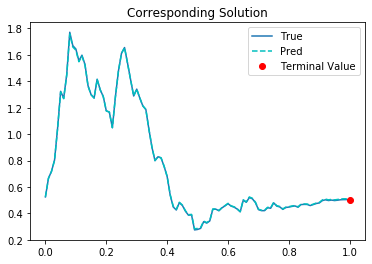

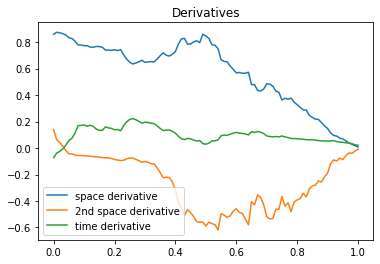

9311th Epoch:
traing loss is 0.00019878936291206628, test loss is 0.00012854310625698417, and learning rate is 0.00023337356105912477, elapsed is 4.074592590332031.
 
9321th Epoch:
traing loss is 8.8506392785348e-05, test loss is 6.756663788110018e-05, and learning rate is 0.00023337356105912477, elapsed is 3.0429458618164062.
 
9331th Epoch:
traing loss is 5.1959988923044875e-05, test loss is 6.58773205941543e-05, and learning rate is 0.00023337356105912477, elapsed is 3.0765552520751953.
 
9341th Epoch:
traing loss is 0.0001740598672768101, test loss is 0.00011758386244764552, and learning rate is 0.00023337356105912477, elapsed is 3.0773251056671143.
 
9351th Epoch:
traing loss is 9.470792429056019e-05, test loss is 9.311077155871317e-05, and learning rate is 0.000228706092457287, elapsed is 2.997636079788208.
 
9361th Epoch:
traing loss is 0.00016758327546995133, test loss is 0.00010423209459986538, and learning rate is 0.000228706092457287, elapsed is 3.0902533531188965.
 
9371th 

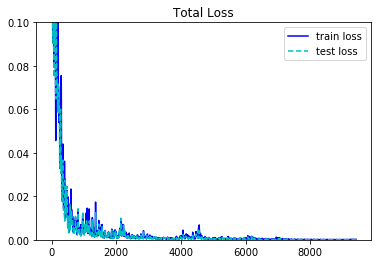

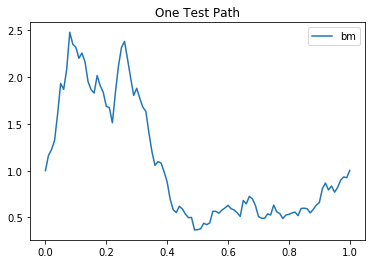

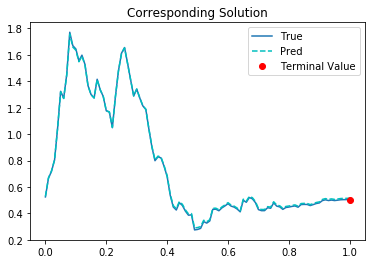

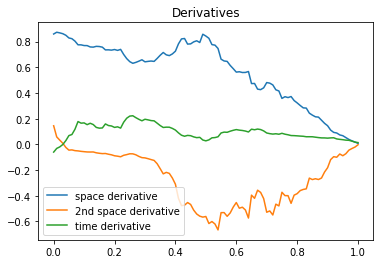

9411th Epoch:
traing loss is 0.0001716797414701432, test loss is 7.688317418796942e-05, and learning rate is 0.00022413197439163923, elapsed is 4.199394941329956.
 
9421th Epoch:
traing loss is 7.324977923417464e-05, test loss is 7.146754796849564e-05, and learning rate is 0.00022413197439163923, elapsed is 2.9784443378448486.
 
9431th Epoch:
traing loss is 5.555665848078206e-05, test loss is 6.963428313611075e-05, and learning rate is 0.00022413197439163923, elapsed is 3.0920522212982178.
 
9441th Epoch:
traing loss is 0.00016460896586067975, test loss is 8.858425280777737e-05, and learning rate is 0.00022413197439163923, elapsed is 2.9995920658111572.
 
9451th Epoch:
traing loss is 8.981689461506903e-05, test loss is 8.554278610972688e-05, and learning rate is 0.00021964932966511697, elapsed is 2.994081735610962.
 
9461th Epoch:
traing loss is 0.00019128287385683507, test loss is 9.518981096334755e-05, and learning rate is 0.00021964932966511697, elapsed is 3.0518367290496826.
 
9471

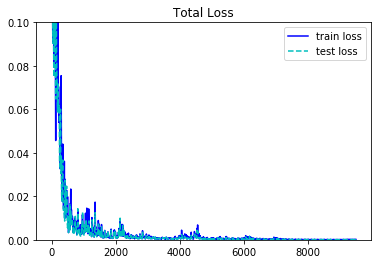

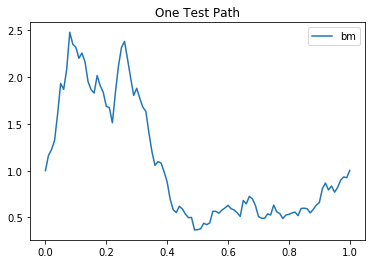

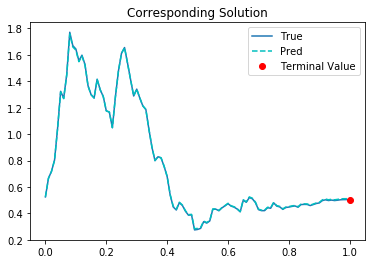

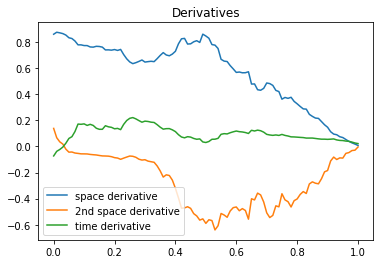

9511th Epoch:
traing loss is 0.0001859287149272859, test loss is 0.0001129294978454709, and learning rate is 0.0002152563538402319, elapsed is 3.986609697341919.
 
9521th Epoch:
traing loss is 8.916531805880368e-05, test loss is 7.090827421052381e-05, and learning rate is 0.0002152563538402319, elapsed is 2.997213125228882.
 
9531th Epoch:
traing loss is 5.5725424317643046e-05, test loss is 6.840449350420386e-05, and learning rate is 0.0002152563538402319, elapsed is 3.0731897354125977.
 
9541th Epoch:
traing loss is 0.00012886626063846052, test loss is 9.722851245896891e-05, and learning rate is 0.0002152563538402319, elapsed is 3.027597188949585.
 
9551th Epoch:
traing loss is 6.415443203877658e-05, test loss is 6.973154086153954e-05, and learning rate is 0.00021095122792758048, elapsed is 3.0850062370300293.
 
9561th Epoch:
traing loss is 0.00013387018407229334, test loss is 9.403901640325785e-05, and learning rate is 0.00021095122792758048, elapsed is 3.0851895809173584.
 
9571th E

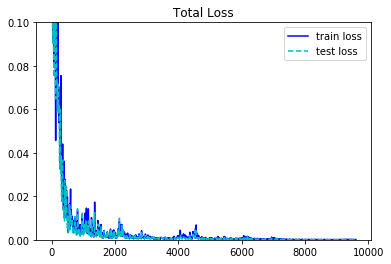

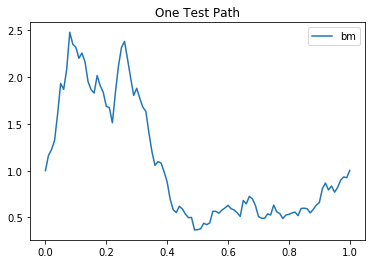

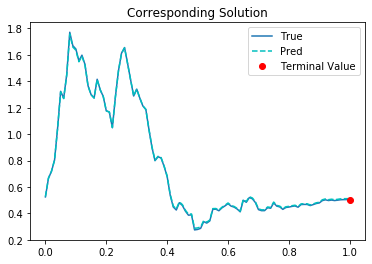

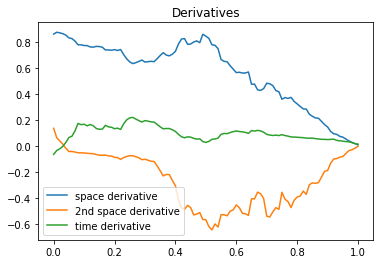

9611th Epoch:
traing loss is 0.0001541158853797242, test loss is 8.01584028522484e-05, and learning rate is 0.00020673222024925053, elapsed is 4.040882587432861.
 
9621th Epoch:
traing loss is 7.553549949079752e-05, test loss is 7.460507185896859e-05, and learning rate is 0.00020673222024925053, elapsed is 3.001147747039795.
 
9631th Epoch:
traing loss is 5.526704990188591e-05, test loss is 6.856150139356032e-05, and learning rate is 0.00020673222024925053, elapsed is 3.058297872543335.
 
9641th Epoch:
traing loss is 0.00010811904212459922, test loss is 6.646272231591865e-05, and learning rate is 0.00020673222024925053, elapsed is 3.080390453338623.
 
9651th Epoch:
traing loss is 5.7831442973110825e-05, test loss is 6.081908941268921e-05, and learning rate is 0.0002025975554715842, elapsed is 3.052534580230713.
 
9661th Epoch:
traing loss is 0.00011677208385663107, test loss is 6.220640352694318e-05, and learning rate is 0.0002025975554715842, elapsed is 3.0327131748199463.
 
9671th Ep

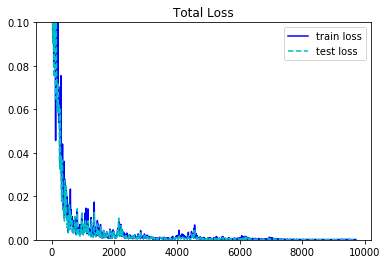

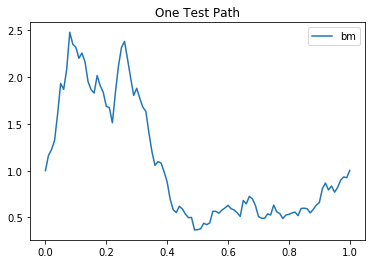

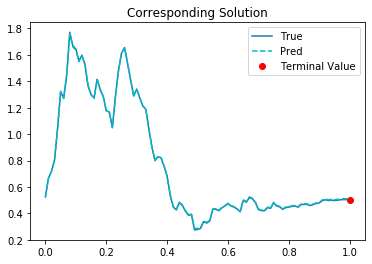

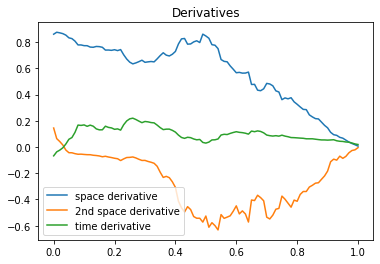

9711th Epoch:
traing loss is 0.0001661917194724083, test loss is 9.53673297772184e-05, and learning rate is 0.00019854561833199114, elapsed is 4.09797215461731.
 
9721th Epoch:
traing loss is 8.533694926882163e-05, test loss is 7.11709726601839e-05, and learning rate is 0.00019854561833199114, elapsed is 3.0915064811706543.
 
9731th Epoch:
traing loss is 5.238855010247789e-05, test loss is 6.50483270874247e-05, and learning rate is 0.00019854561833199114, elapsed is 3.1247315406799316.
 
9741th Epoch:
traing loss is 8.010426972759888e-05, test loss is 7.256718527060002e-05, and learning rate is 0.00019854561833199114, elapsed is 3.0696022510528564.
 
9751th Epoch:
traing loss is 4.4796441216021776e-05, test loss is 5.4583928431384265e-05, and learning rate is 0.00019457472080830485, elapsed is 3.055302858352661.
 
9761th Epoch:
traing loss is 0.00010040240158559754, test loss is 7.529178401455283e-05, and learning rate is 0.00019457472080830485, elapsed is 3.0320818424224854.
 
9771th 

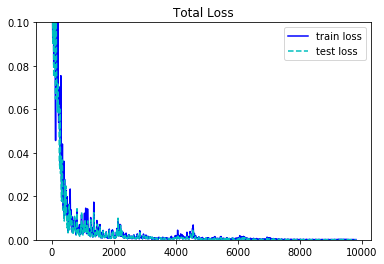

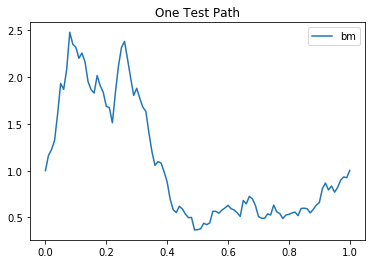

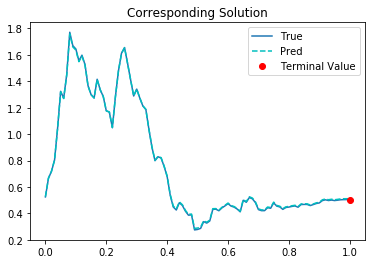

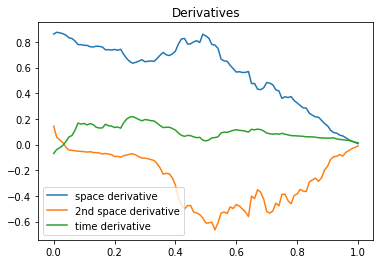

9811th Epoch:
traing loss is 0.00014143859152682126, test loss is 7.640587136847898e-05, and learning rate is 0.00019068323308601975, elapsed is 3.9554922580718994.
 
9821th Epoch:
traing loss is 7.609232852701098e-05, test loss is 7.07121507730335e-05, and learning rate is 0.00019068323308601975, elapsed is 3.010395050048828.
 
9831th Epoch:
traing loss is 4.980119410902262e-05, test loss is 6.189751002239063e-05, and learning rate is 0.00019068323308601975, elapsed is 3.11903715133667.
 
9841th Epoch:
traing loss is 8.429711306234822e-05, test loss is 5.779157436336391e-05, and learning rate is 0.00019068323308601975, elapsed is 3.060748338699341.
 
9851th Epoch:
traing loss is 4.566803545458242e-05, test loss is 5.216551653575152e-05, and learning rate is 0.00018686955445446074, elapsed is 3.106398344039917.
 
9861th Epoch:
traing loss is 8.995246753329411e-05, test loss is 5.286583473207429e-05, and learning rate is 0.00018686955445446074, elapsed is 3.1406335830688477.
 
9871th Ep

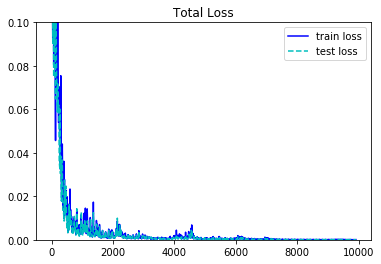

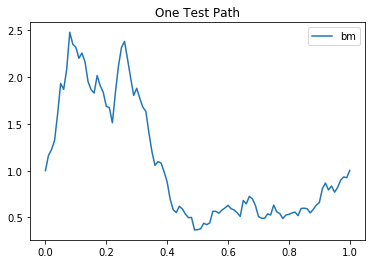

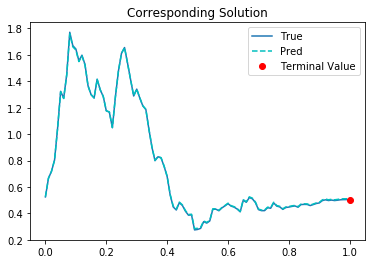

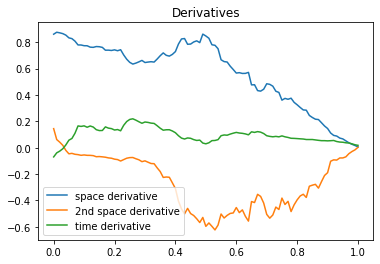

9911th Epoch:
traing loss is 0.00014524796279147267, test loss is 8.318354957737029e-05, and learning rate is 0.00018313217151444405, elapsed is 4.000921249389648.
 
9921th Epoch:
traing loss is 8.006974530871958e-05, test loss is 7.009984983596951e-05, and learning rate is 0.00018313217151444405, elapsed is 3.107905864715576.
 
9931th Epoch:
traing loss is 4.97693290526513e-05, test loss is 6.230081635294482e-05, and learning rate is 0.00018313217151444405, elapsed is 3.0623903274536133.
 
9941th Epoch:
traing loss is 6.246473640203476e-05, test loss is 6.114807911217213e-05, and learning rate is 0.00018313217151444405, elapsed is 3.1283082962036133.
 
9951th Epoch:
traing loss is 3.747391019714996e-05, test loss is 4.876363163930364e-05, and learning rate is 0.0001794695417629555, elapsed is 2.9850046634674072.
 
9961th Epoch:
traing loss is 8.560971764381975e-05, test loss is 6.163447687868029e-05, and learning rate is 0.0001794695417629555, elapsed is 3.0001561641693115.
 
9971th E

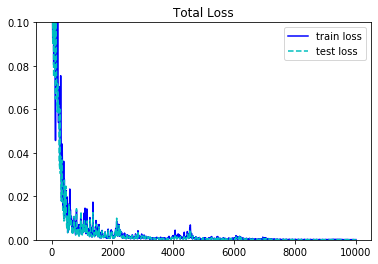

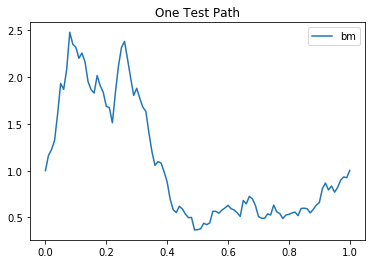

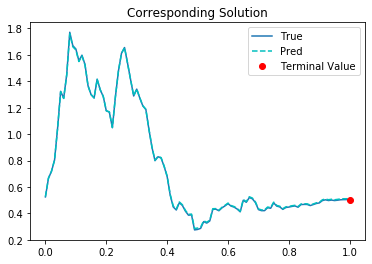

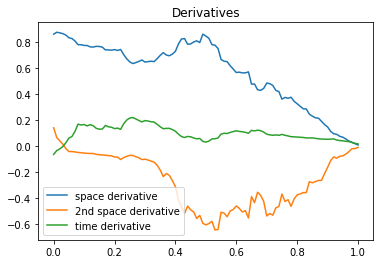

10011th Epoch:
traing loss is 0.00013366196071729064, test loss is 7.411180558847263e-05, and learning rate is 0.0001758801518008113, elapsed is 4.065577268600464.
 
10021th Epoch:
traing loss is 7.648839527973905e-05, test loss is 6.817581743234769e-05, and learning rate is 0.0001758801518008113, elapsed is 3.039900302886963.
 
10031th Epoch:
traing loss is 4.675514719565399e-05, test loss is 5.884270649403334e-05, and learning rate is 0.0001758801518008113, elapsed is 3.0688343048095703.
 
10041th Epoch:
traing loss is 7.216705125756562e-05, test loss is 5.380938819143921e-05, and learning rate is 0.0001758801518008113, elapsed is 3.0692830085754395.
 
10051th Epoch:
traing loss is 4.1360966861248016e-05, test loss is 4.8556401452515274e-05, and learning rate is 0.00017236254643648863, elapsed is 3.059798240661621.
 
10061th Epoch:
traing loss is 8.125197928166017e-05, test loss is 4.9023710744222626e-05, and learning rate is 0.00017236254643648863, elapsed is 3.083381175994873.
 
10

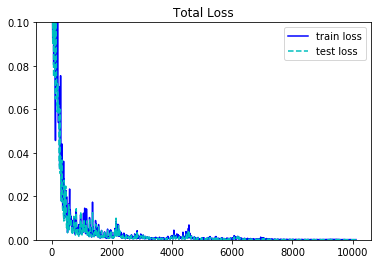

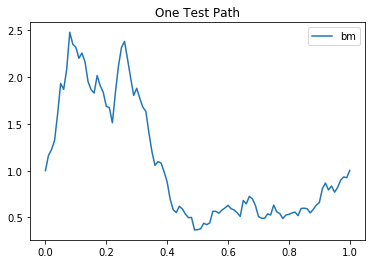

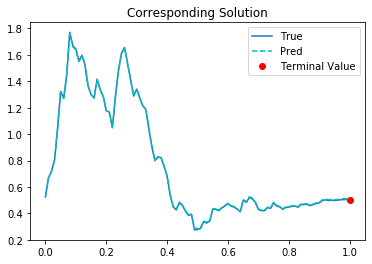

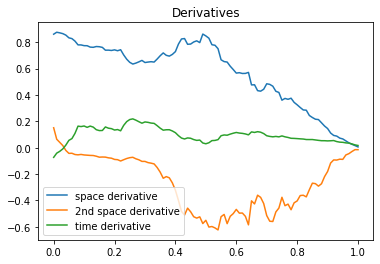

10111th Epoch:
traing loss is 0.00013309552741702646, test loss is 7.669875776628032e-05, and learning rate is 0.00016891529958229512, elapsed is 4.049829006195068.
 
10121th Epoch:
traing loss is 8.134671952575445e-05, test loss is 6.803251744713634e-05, and learning rate is 0.00016891529958229512, elapsed is 2.9929039478302.
 
10131th Epoch:
traing loss is 4.7669811465311795e-05, test loss is 5.911002881475724e-05, and learning rate is 0.00016891529958229512, elapsed is 3.1360137462615967.
 
10141th Epoch:
traing loss is 5.630637315334752e-05, test loss is 5.47590825590305e-05, and learning rate is 0.00016891529958229512, elapsed is 3.1299636363983154.
 
10151th Epoch:
traing loss is 3.582471254048869e-05, test loss is 4.632871423382312e-05, and learning rate is 0.0001655369997024536, elapsed is 3.066136598587036.
 
10161th Epoch:
traing loss is 7.65697768656537e-05, test loss is 5.5406308092642576e-05, and learning rate is 0.0001655369997024536, elapsed is 3.053983449935913.
 
10171

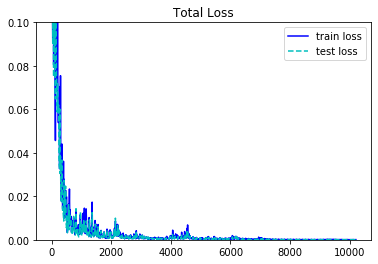

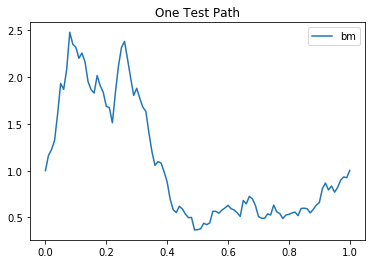

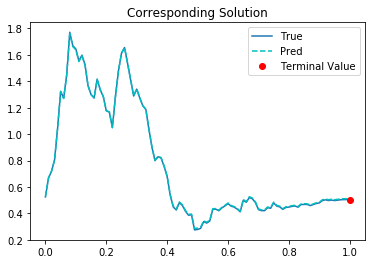

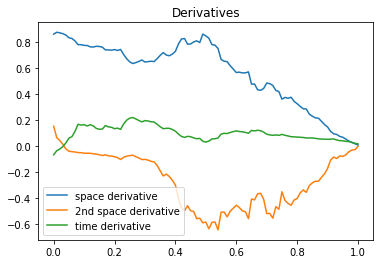

10211th Epoch:
traing loss is 0.0001275902905035764, test loss is 7.00667078490369e-05, and learning rate is 0.00016222624981310219, elapsed is 4.039360761642456.
 
10221th Epoch:
traing loss is 7.478066254407167e-05, test loss is 6.465874321293086e-05, and learning rate is 0.00016222624981310219, elapsed is 3.122313976287842.
 
10231th Epoch:
traing loss is 4.50624902441632e-05, test loss is 5.683148265234195e-05, and learning rate is 0.00016222624981310219, elapsed is 3.1089415550231934.
 
10241th Epoch:
traing loss is 6.48119457764551e-05, test loss is 5.011143002775498e-05, and learning rate is 0.00016222624981310219, elapsed is 3.099169969558716.
 
10251th Epoch:
traing loss is 3.896116322721355e-05, test loss is 4.7196310333674774e-05, and learning rate is 0.00015898174024187028, elapsed is 3.1262574195861816.
 
10261th Epoch:
traing loss is 7.604843995068222e-05, test loss is 4.817179433302954e-05, and learning rate is 0.00015898174024187028, elapsed is 3.0975003242492676.
 
102

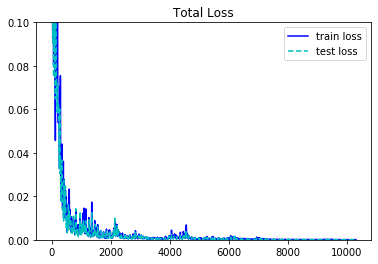

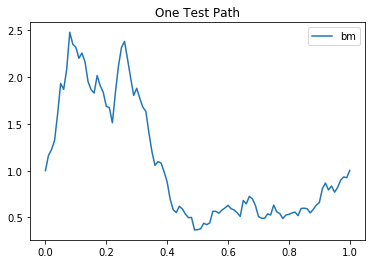

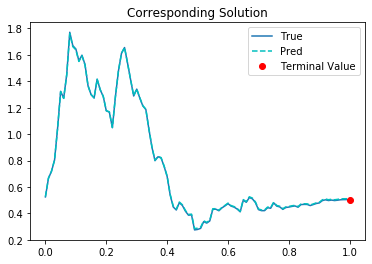

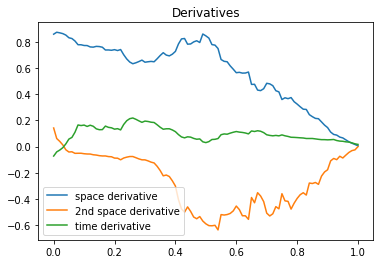

10311th Epoch:
traing loss is 0.00012603816867340356, test loss is 7.24258425179869e-05, and learning rate is 0.00015580210310872644, elapsed is 4.096755027770996.
 
10321th Epoch:
traing loss is 7.994630868779495e-05, test loss is 6.672069866908714e-05, and learning rate is 0.00015580210310872644, elapsed is 3.105114221572876.
 
10331th Epoch:
traing loss is 4.5259603211889043e-05, test loss is 5.716504529118538e-05, and learning rate is 0.00015580210310872644, elapsed is 3.1740643978118896.
 
10341th Epoch:
traing loss is 5.2979699830757454e-05, test loss is 5.11159269080963e-05, and learning rate is 0.00015580210310872644, elapsed is 3.165911912918091.
 
10351th Epoch:
traing loss is 3.4136704925913364e-05, test loss is 4.437021925696172e-05, and learning rate is 0.0001526860723970458, elapsed is 3.0377957820892334.
 
10361th Epoch:
traing loss is 7.403493509627879e-05, test loss is 5.248927845968865e-05, and learning rate is 0.0001526860723970458, elapsed is 3.105072498321533.
 
10

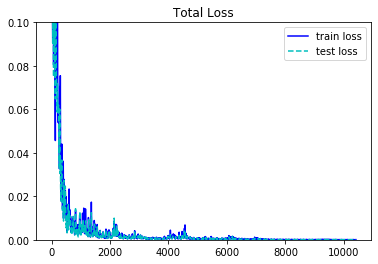

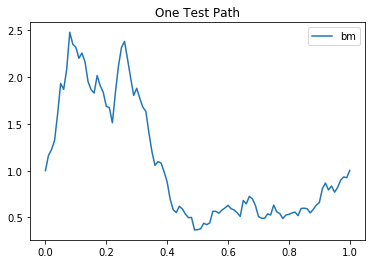

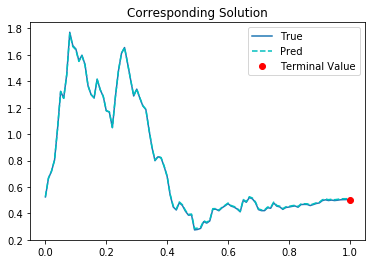

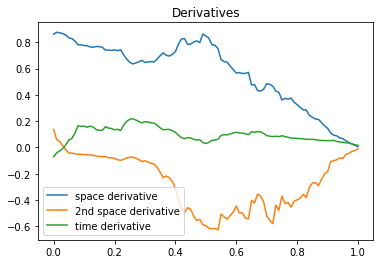

10411th Epoch:
traing loss is 0.00011953570356126875, test loss is 6.671761366305873e-05, and learning rate is 0.000149632352986373, elapsed is 4.080266237258911.
 
10421th Epoch:
traing loss is 7.572382310172543e-05, test loss is 6.375498924171552e-05, and learning rate is 0.000149632352986373, elapsed is 3.2384021282196045.
 
10431th Epoch:
traing loss is 4.203652497380972e-05, test loss is 5.430042801890522e-05, and learning rate is 0.000149632352986373, elapsed is 3.2222402095794678.
 
10441th Epoch:
traing loss is 6.129823304945603e-05, test loss is 4.826448275707662e-05, and learning rate is 0.000149632352986373, elapsed is 3.1681408882141113.
 
10451th Epoch:
traing loss is 3.837784970528446e-05, test loss is 4.597864972311072e-05, and learning rate is 0.00014663970796391368, elapsed is 3.2122249603271484.
 
10461th Epoch:
traing loss is 7.414270658046007e-05, test loss is 4.716304465546273e-05, and learning rate is 0.00014663970796391368, elapsed is 3.2076377868652344.
 
10471t

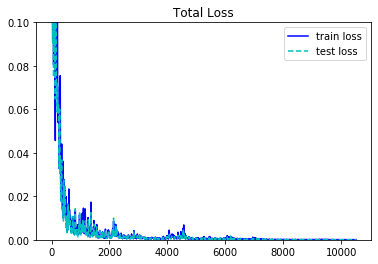

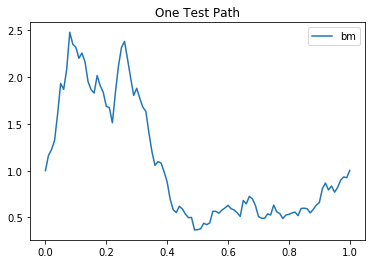

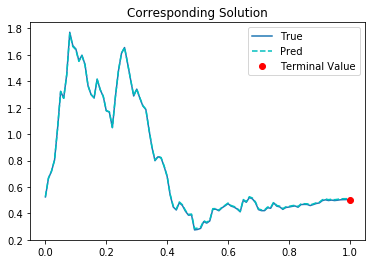

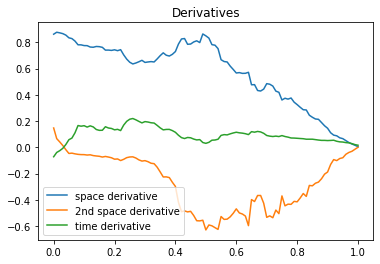

10511th Epoch:
traing loss is 0.00012067038915120065, test loss is 6.856727850390598e-05, and learning rate is 0.00014370691496878862, elapsed is 5.116045236587524.
 
10521th Epoch:
traing loss is 7.848865789128467e-05, test loss is 6.361374835250899e-05, and learning rate is 0.00014370691496878862, elapsed is 3.220442533493042.
 
10531th Epoch:
traing loss is 4.2938791011692956e-05, test loss is 5.466560833156109e-05, and learning rate is 0.00014370691496878862, elapsed is 3.077623128890991.
 
10541th Epoch:
traing loss is 5.099551708553918e-05, test loss is 4.872606950812042e-05, and learning rate is 0.00014370691496878862, elapsed is 3.1561052799224854.
 
10551th Epoch:
traing loss is 3.290560198365711e-05, test loss is 4.352822725195438e-05, and learning rate is 0.00014083278074394912, elapsed is 3.177262783050537.
 
10561th Epoch:
traing loss is 7.239461410790682e-05, test loss is 5.134168895892799e-05, and learning rate is 0.00014083278074394912, elapsed is 3.073193311691284.
 
1

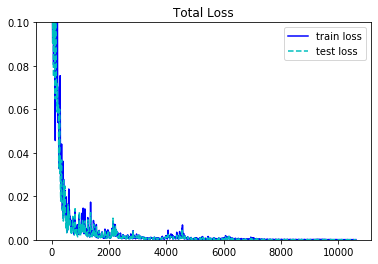

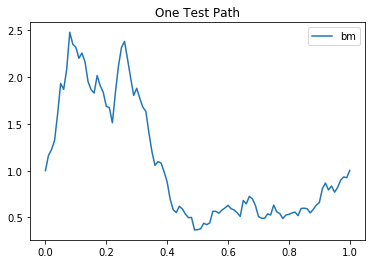

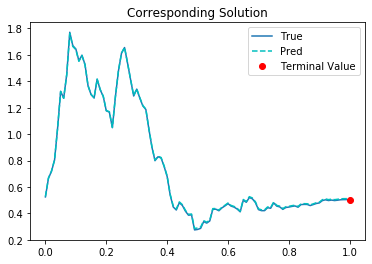

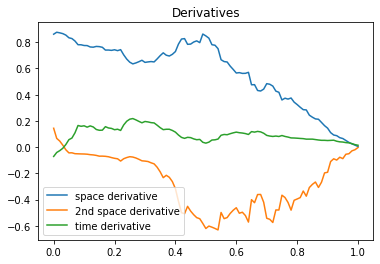

10611th Epoch:
traing loss is 0.00011796332546509802, test loss is 6.4906693296507e-05, and learning rate is 0.00013801612658426166, elapsed is 4.097713232040405.
 
10621th Epoch:
traing loss is 7.516353070968762e-05, test loss is 6.228869460755959e-05, and learning rate is 0.00013801612658426166, elapsed is 3.0990307331085205.
 
10631th Epoch:
traing loss is 4.0234557673102245e-05, test loss is 5.251467155176215e-05, and learning rate is 0.00013801612658426166, elapsed is 3.1531994342803955.
 
10641th Epoch:
traing loss is 5.877353032701649e-05, test loss is 4.6374629164347425e-05, and learning rate is 0.00013801612658426166, elapsed is 3.148303270339966.
 
10651th Epoch:
traing loss is 3.671647937153466e-05, test loss is 4.493195592658594e-05, and learning rate is 0.0001352558028884232, elapsed is 3.0644567012786865.
 
10661th Epoch:
traing loss is 7.350149098783731e-05, test loss is 4.739443102153018e-05, and learning rate is 0.0001352558028884232, elapsed is 3.1260013580322266.
 
1

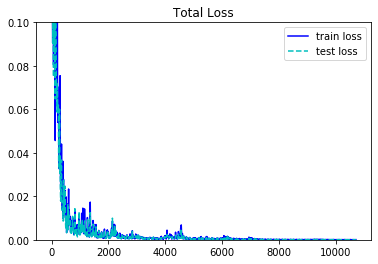

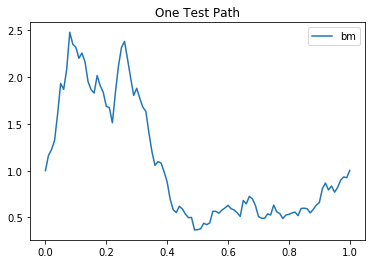

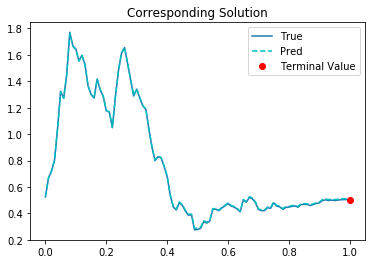

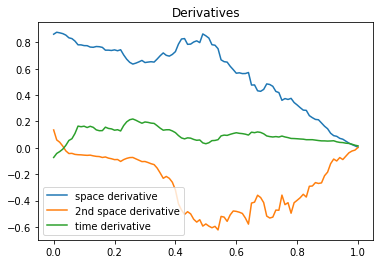

10711th Epoch:
traing loss is 0.0001182516643893905, test loss is 6.673571624560282e-05, and learning rate is 0.00013255068915896118, elapsed is 4.111213207244873.
 
10721th Epoch:
traing loss is 7.983682735357434e-05, test loss is 6.565210060216486e-05, and learning rate is 0.00013255068915896118, elapsed is 3.158320188522339.
 
10731th Epoch:
traing loss is 4.031277057947591e-05, test loss is 5.183521716389805e-05, and learning rate is 0.00013255068915896118, elapsed is 3.1698925495147705.
 
10741th Epoch:
traing loss is 4.877568062511273e-05, test loss is 4.5597058488056064e-05, and learning rate is 0.00013255068915896118, elapsed is 3.166245222091675.
 
10751th Epoch:
traing loss is 3.300779280834831e-05, test loss is 4.358178921393119e-05, and learning rate is 0.00012989967945031822, elapsed is 3.1285862922668457.
 
10761th Epoch:
traing loss is 7.175686914706603e-05, test loss is 5.115720341564156e-05, and learning rate is 0.00012989967945031822, elapsed is 3.0573272705078125.
 


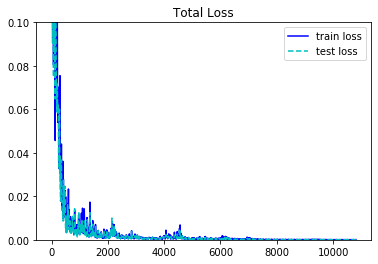

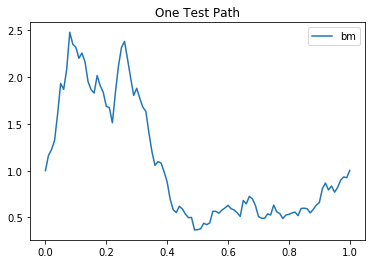

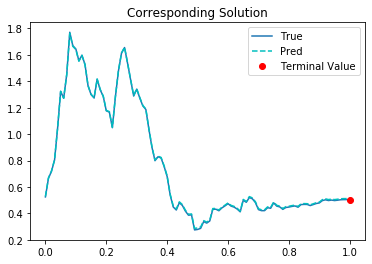

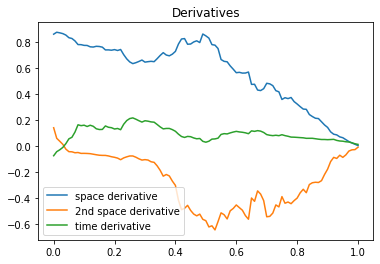

10811th Epoch:
traing loss is 0.00011568454647203907, test loss is 6.368514732457697e-05, and learning rate is 0.0001273016823688522, elapsed is 4.1786863803863525.
 
10821th Epoch:
traing loss is 7.588672451674938e-05, test loss is 6.492743705166504e-05, and learning rate is 0.0001273016823688522, elapsed is 3.225423574447632.
 
10831th Epoch:
traing loss is 3.728806404978968e-05, test loss is 4.894384983344935e-05, and learning rate is 0.0001273016823688522, elapsed is 3.1454694271087646.
 
10841th Epoch:
traing loss is 5.724186485167593e-05, test loss is 4.647297828341834e-05, and learning rate is 0.0001273016823688522, elapsed is 3.037426471710205.
 
10851th Epoch:
traing loss is 3.6589328374248e-05, test loss is 4.38061251770705e-05, and learning rate is 0.00012475565017666668, elapsed is 3.080791473388672.
 
10861th Epoch:
traing loss is 7.565796113340184e-05, test loss is 5.0246268074261025e-05, and learning rate is 0.00012475565017666668, elapsed is 3.139068365097046.
 
10871th

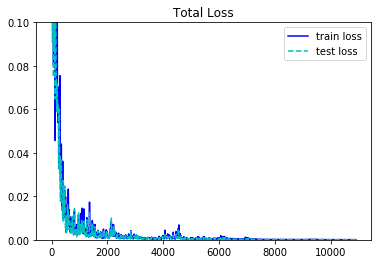

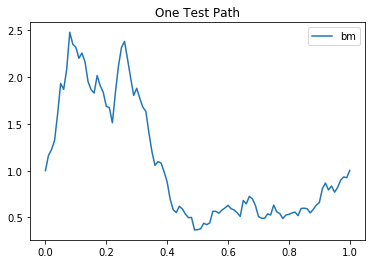

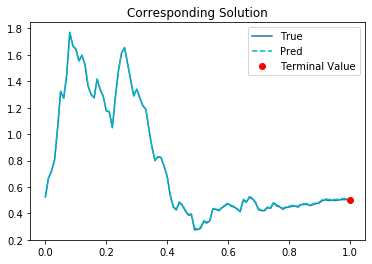

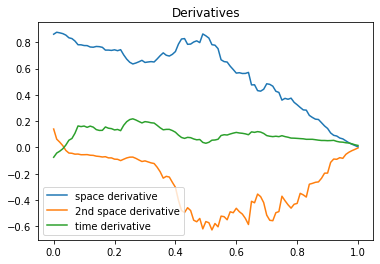

10911th Epoch:
traing loss is 0.00011224541231058538, test loss is 6.312820187304169e-05, and learning rate is 0.0001222605351358652, elapsed is 4.050954818725586.
 
10921th Epoch:
traing loss is 8.276908192783594e-05, test loss is 7.03255645930767e-05, and learning rate is 0.0001222605351358652, elapsed is 3.060964345932007.
 
10931th Epoch:
traing loss is 3.6361620004754514e-05, test loss is 4.796466600964777e-05, and learning rate is 0.0001222605351358652, elapsed is 3.1433815956115723.
 
10941th Epoch:
traing loss is 4.975360570824705e-05, test loss is 4.6303815906867385e-05, and learning rate is 0.0001222605351358652, elapsed is 3.1081759929656982.
 
10951th Epoch:
traing loss is 3.195329918526113e-05, test loss is 4.293231540941633e-05, and learning rate is 0.00011981533316429704, elapsed is 3.1681087017059326.
 
10961th Epoch:
traing loss is 7.419975008815527e-05, test loss is 5.4925800213823095e-05, and learning rate is 0.00011981533316429704, elapsed is 3.185633659362793.
 
10

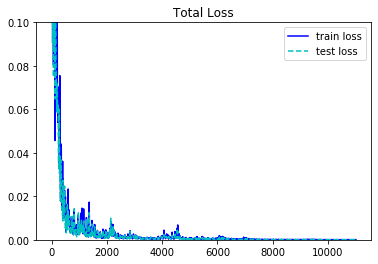

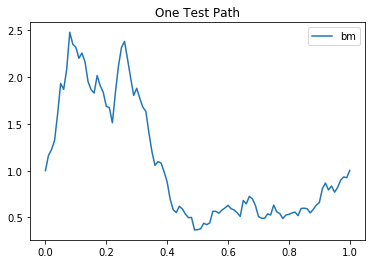

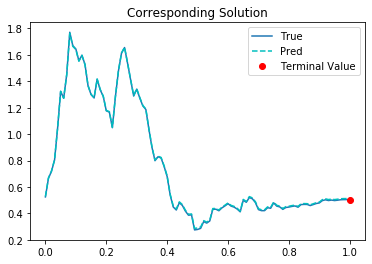

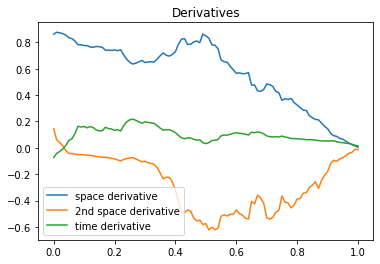

11011th Epoch:
traing loss is 0.00010667776223272085, test loss is 5.9508824051590636e-05, and learning rate is 0.0001174190329038538, elapsed is 4.022891521453857.
 
11021th Epoch:
traing loss is 7.859555626055226e-05, test loss is 6.808545003877953e-05, and learning rate is 0.0001174190329038538, elapsed is 3.0840914249420166.
 
11031th Epoch:
traing loss is 3.2973577617667615e-05, test loss is 4.432184505276382e-05, and learning rate is 0.0001174190329038538, elapsed is 3.0915796756744385.
 
11041th Epoch:
traing loss is 6.027485869708471e-05, test loss is 5.0215956434840336e-05, and learning rate is 0.0001174190329038538, elapsed is 3.083733558654785.
 
11051th Epoch:
traing loss is 3.456439662841149e-05, test loss is 4.235763844917528e-05, and learning rate is 0.00011507065937621519, elapsed is 3.0477101802825928.
 
11061th Epoch:
traing loss is 8.17029140307568e-05, test loss is 5.9294532547937706e-05, and learning rate is 0.00011507065937621519, elapsed is 3.067171573638916.
 
1

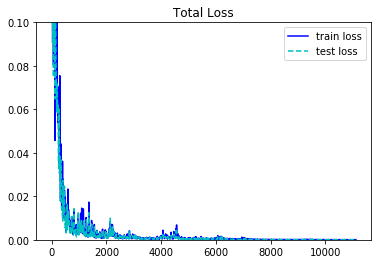

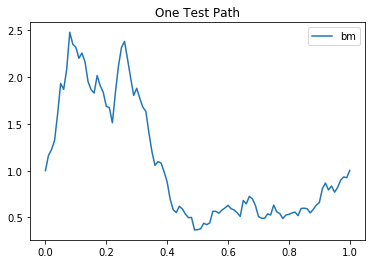

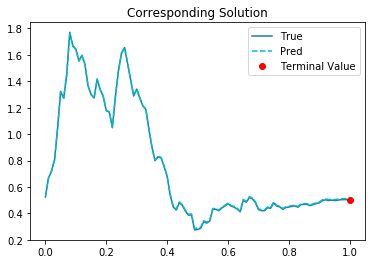

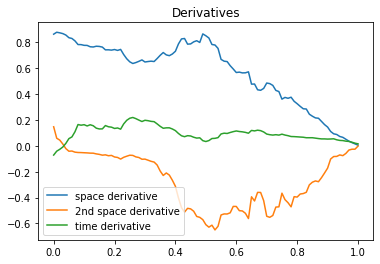

11111th Epoch:
traing loss is 0.00010483233927516267, test loss is 6.191765714902431e-05, and learning rate is 0.00011276924487901852, elapsed is 4.0801568031311035.
 
11121th Epoch:
traing loss is 8.3482067566365e-05, test loss is 7.15265196049586e-05, and learning rate is 0.00011276924487901852, elapsed is 3.0973684787750244.
 
11131th Epoch:
traing loss is 3.4440749004716054e-05, test loss is 4.5961020077811554e-05, and learning rate is 0.00011276924487901852, elapsed is 3.1176154613494873.
 
11141th Epoch:
traing loss is 5.130043064127676e-05, test loss is 4.737034032586962e-05, and learning rate is 0.00011276924487901852, elapsed is 3.097581386566162.
 
11151th Epoch:
traing loss is 3.3772666938602924e-05, test loss is 4.4845401134807616e-05, and learning rate is 0.00011051386536564678, elapsed is 3.145176410675049.
 
11161th Epoch:
traing loss is 7.840653415769339e-05, test loss is 5.864691411261447e-05, and learning rate is 0.00011051386536564678, elapsed is 3.212188720703125.
 

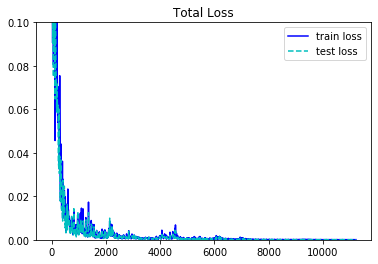

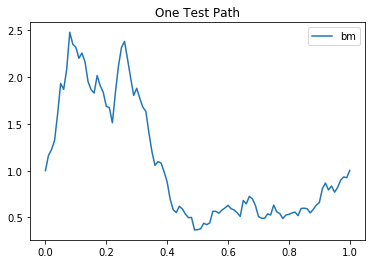

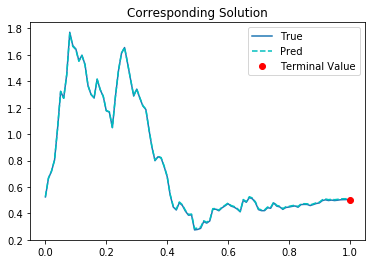

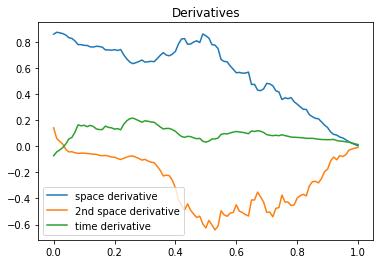

11211th Epoch:
traing loss is 0.00010479961929377168, test loss is 5.9066358517156914e-05, and learning rate is 0.00010830358223756775, elapsed is 4.176714181900024.
 
11221th Epoch:
traing loss is 7.319256837945431e-05, test loss is 6.319375825114548e-05, and learning rate is 0.00010830358223756775, elapsed is 3.127047538757324.
 
11231th Epoch:
traing loss is 3.5486824344843626e-05, test loss is 4.747318962472491e-05, and learning rate is 0.00010830358223756775, elapsed is 3.1148624420166016.
 
11241th Epoch:
traing loss is 5.869599408470094e-05, test loss is 4.828049713978544e-05, and learning rate is 0.00010830358223756775, elapsed is 3.1362693309783936.
 
11251th Epoch:
traing loss is 3.7967161915730685e-05, test loss is 4.667474786401726e-05, and learning rate is 0.00010613752237986773, elapsed is 4.24657130241394.
 
11261th Epoch:
traing loss is 7.806202484061942e-05, test loss is 5.4037547670304775e-05, and learning rate is 0.00010613752237986773, elapsed is 3.156949996948242.


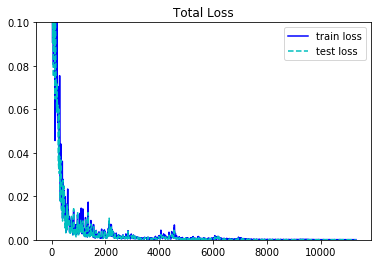

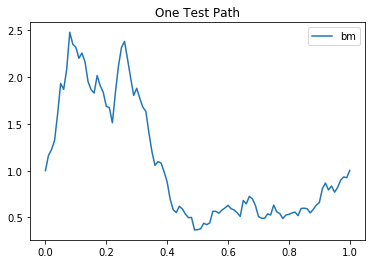

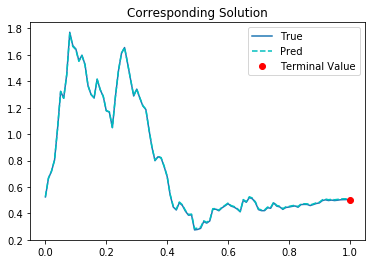

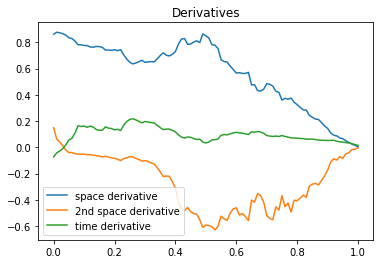

11311th Epoch:
traing loss is 0.00010151362948818132, test loss is 6.008079435559921e-05, and learning rate is 0.00010401476902188733, elapsed is 4.164497375488281.
 
11321th Epoch:
traing loss is 7.249927148222923e-05, test loss is 6.044641122571193e-05, and learning rate is 0.00010401476902188733, elapsed is 3.0238959789276123.
 
11331th Epoch:
traing loss is 3.911254680133425e-05, test loss is 5.13788872922305e-05, and learning rate is 0.00010401476902188733, elapsed is 3.0835623741149902.
 
11341th Epoch:
traing loss is 4.568683652905747e-05, test loss is 4.3886051571462303e-05, and learning rate is 0.00010401476902188733, elapsed is 3.139671802520752.
 
11351th Epoch:
traing loss is 3.780868064495735e-05, test loss is 4.889288902631961e-05, and learning rate is 0.00010193447087658569, elapsed is 3.0759215354919434.
 
11361th Epoch:
traing loss is 6.857763219159096e-05, test loss is 4.528859426500276e-05, and learning rate is 0.00010193447087658569, elapsed is 3.145946741104126.
 


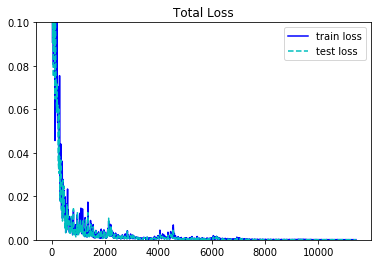

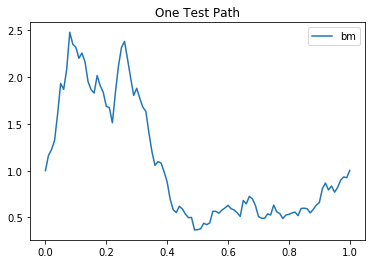

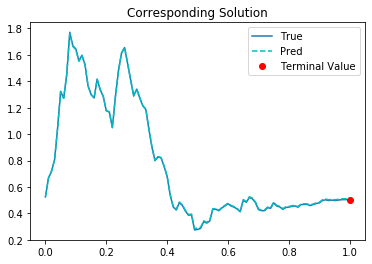

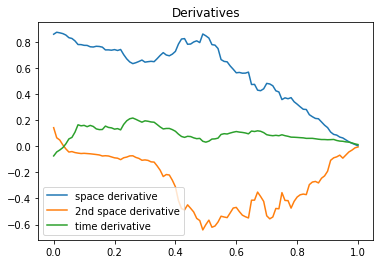

11411th Epoch:
traing loss is 0.00010123995889443904, test loss is 5.9071124269394204e-05, and learning rate is 9.989579120883718e-05, elapsed is 4.099317312240601.
 
11421th Epoch:
traing loss is 6.695279444102198e-05, test loss is 5.438657899503596e-05, and learning rate is 9.989579120883718e-05, elapsed is 3.035259962081909.
 
11431th Epoch:
traing loss is 3.7975867599016055e-05, test loss is 4.987733336747624e-05, and learning rate is 9.989579120883718e-05, elapsed is 3.152747869491577.
 
11441th Epoch:
traing loss is 5.4012256441637874e-05, test loss is 4.2947223846567795e-05, and learning rate is 9.989579120883718e-05, elapsed is 3.08469557762146.
 
11451th Epoch:
traing loss is 3.9093087252695113e-05, test loss is 4.7255874960683286e-05, and learning rate is 9.789787145564333e-05, elapsed is 3.1233198642730713.
 
11461th Epoch:
traing loss is 6.915989797562361e-05, test loss is 4.4086118577979505e-05, and learning rate is 9.789787145564333e-05, elapsed is 3.1448631286621094.
 
1

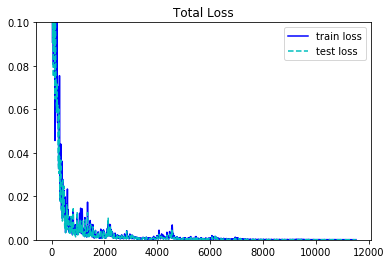

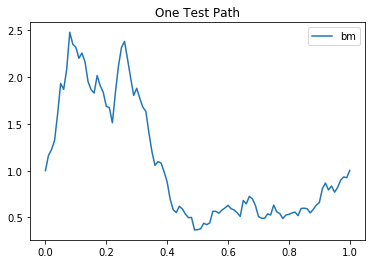

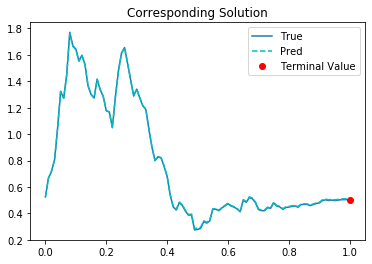

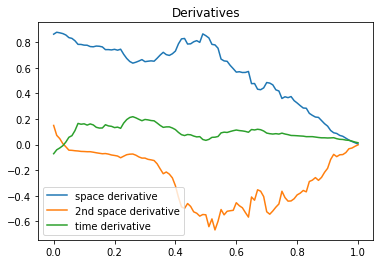

11511th Epoch:
traing loss is 9.926381608238444e-05, test loss is 5.9082845837110654e-05, and learning rate is 9.59399258135818e-05, elapsed is 4.104819297790527.
 
11521th Epoch:
traing loss is 6.594839942408726e-05, test loss is 5.238974335952662e-05, and learning rate is 9.59399258135818e-05, elapsed is 3.1014108657836914.
 
11531th Epoch:
traing loss is 3.7470439565368e-05, test loss is 4.9249472795054317e-05, and learning rate is 9.59399258135818e-05, elapsed is 3.164191484451294.
 
11541th Epoch:
traing loss is 4.5678614696953446e-05, test loss is 4.374208583612926e-05, and learning rate is 9.59399258135818e-05, elapsed is 3.122082471847534.
 
11551th Epoch:
traing loss is 3.365635348018259e-05, test loss is 4.389690002426505e-05, and learning rate is 9.402111754752696e-05, elapsed is 3.1294338703155518.
 
11561th Epoch:
traing loss is 6.365917943185195e-05, test loss is 4.2020979890367016e-05, and learning rate is 9.402111754752696e-05, elapsed is 3.0666418075561523.
 
11571th E

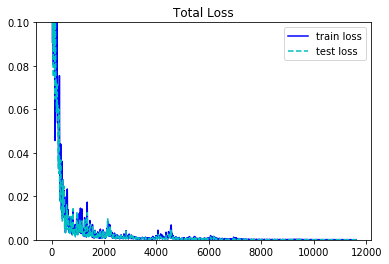

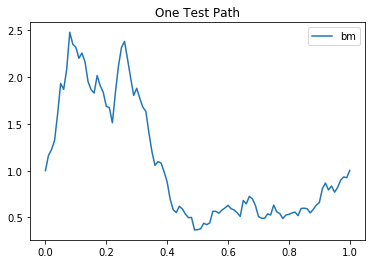

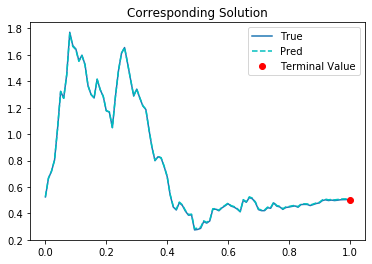

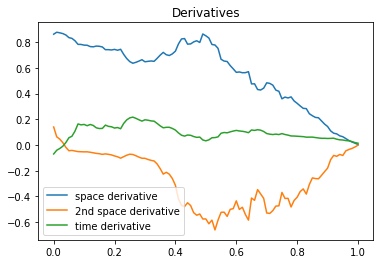

11611th Epoch:
traing loss is 9.778298408491537e-05, test loss is 5.536031676456332e-05, and learning rate is 9.214070450980216e-05, elapsed is 4.221789598464966.
 
11621th Epoch:
traing loss is 6.304584530880675e-05, test loss is 4.933689706376754e-05, and learning rate is 9.214070450980216e-05, elapsed is 3.1082985401153564.
 
11631th Epoch:
traing loss is 3.503748666844331e-05, test loss is 4.634388460544869e-05, and learning rate is 9.214070450980216e-05, elapsed is 3.0457305908203125.
 
11641th Epoch:
traing loss is 5.352212974685244e-05, test loss is 4.281074507161975e-05, and learning rate is 9.214070450980216e-05, elapsed is 3.1010453701019287.
 
11651th Epoch:
traing loss is 3.576912058633752e-05, test loss is 4.3957101297564805e-05, and learning rate is 9.029788634506986e-05, elapsed is 3.109407663345337.
 
11661th Epoch:
traing loss is 6.79873555782251e-05, test loss is 4.256670217728242e-05, and learning rate is 9.029788634506986e-05, elapsed is 3.136828899383545.
 
11671th

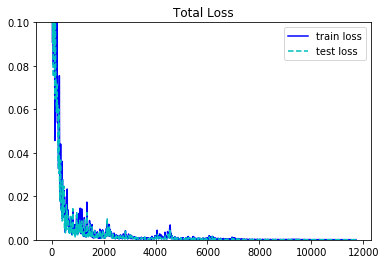

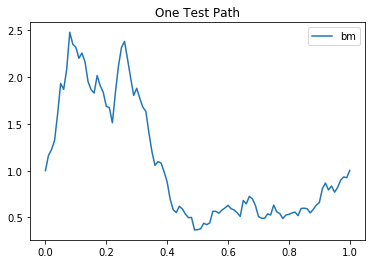

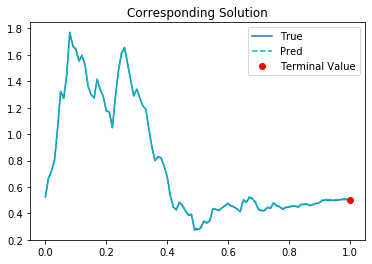

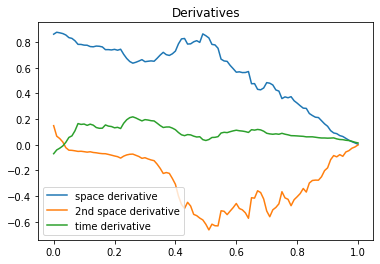

11711th Epoch:
traing loss is 9.610684355720878e-05, test loss is 5.523666550288908e-05, and learning rate is 8.8491928181611e-05, elapsed is 4.139094114303589.
 
11721th Epoch:
traing loss is 6.476711860159412e-05, test loss is 4.911160431220196e-05, and learning rate is 8.8491928181611e-05, elapsed is 3.104323625564575.
 
11731th Epoch:
traing loss is 3.5252320230938494e-05, test loss is 4.641880514100194e-05, and learning rate is 8.8491928181611e-05, elapsed is 3.1104328632354736.
 
11741th Epoch:
traing loss is 4.603328852681443e-05, test loss is 4.502896626945585e-05, and learning rate is 8.8491928181611e-05, elapsed is 3.1630616188049316.
 
11751th Epoch:
traing loss is 3.086691503995098e-05, test loss is 4.0986247768159956e-05, and learning rate is 8.672209514770657e-05, elapsed is 3.123046636581421.
 
11761th Epoch:
traing loss is 6.342582491924986e-05, test loss is 4.177688606432639e-05, and learning rate is 8.672209514770657e-05, elapsed is 3.1241328716278076.
 
11771th Epoch

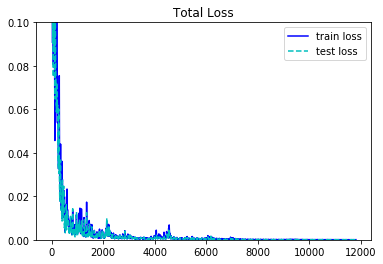

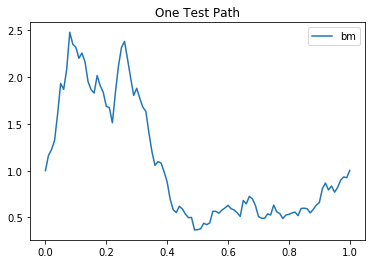

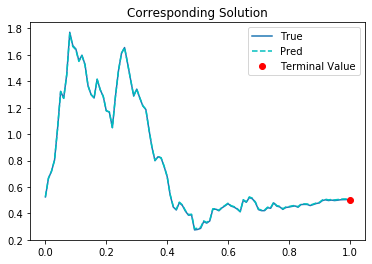

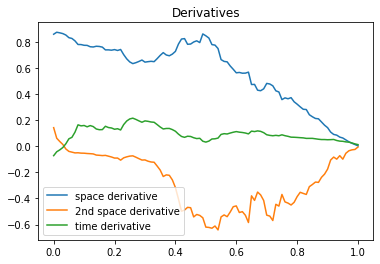

11811th Epoch:
traing loss is 9.614697773940861e-05, test loss is 5.322877041180618e-05, and learning rate is 8.498765237163752e-05, elapsed is 4.050611257553101.
 
11821th Epoch:
traing loss is 6.146477244328707e-05, test loss is 4.681975769926794e-05, and learning rate is 8.498765237163752e-05, elapsed is 3.1266889572143555.
 
11831th Epoch:
traing loss is 3.30541588482447e-05, test loss is 4.3793763325084e-05, and learning rate is 8.498765237163752e-05, elapsed is 3.0740561485290527.
 
11841th Epoch:
traing loss is 5.326789687387645e-05, test loss is 4.254710802342743e-05, and learning rate is 8.498765237163752e-05, elapsed is 3.137122631072998.
 
11851th Epoch:
traing loss is 3.4493346902308986e-05, test loss is 4.164918573223986e-05, and learning rate is 8.328790863743052e-05, elapsed is 3.06319260597229.
 
11861th Epoch:
traing loss is 6.813826621510088e-05, test loss is 4.156852810410783e-05, and learning rate is 8.328790863743052e-05, elapsed is 3.06261944770813.
 
11871th Epoc

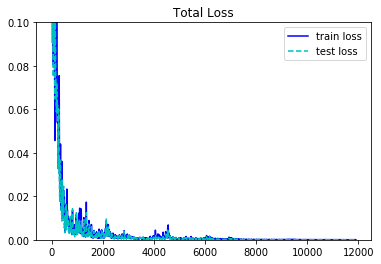

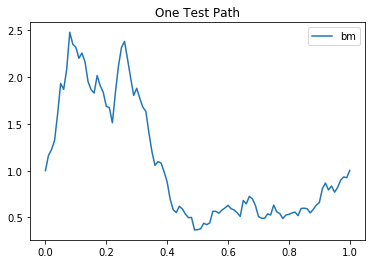

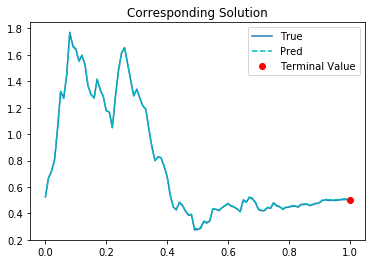

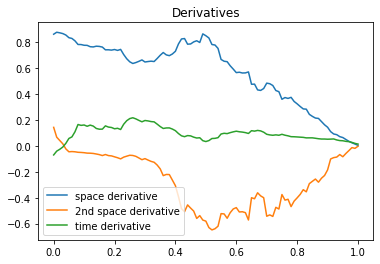

11911th Epoch:
traing loss is 9.30053138290532e-05, test loss is 5.188387876842171e-05, and learning rate is 8.162215090123937e-05, elapsed is 4.177356719970703.
 
11921th Epoch:
traing loss is 6.01846695644781e-05, test loss is 4.658672696677968e-05, and learning rate is 8.162215090123937e-05, elapsed is 3.1705238819122314.
 
11931th Epoch:
traing loss is 3.317504524602555e-05, test loss is 4.3896896386286244e-05, and learning rate is 8.162215090123937e-05, elapsed is 3.1066293716430664.
 
11941th Epoch:
traing loss is 4.4970180169912055e-05, test loss is 4.3503085180418566e-05, and learning rate is 8.162215090123937e-05, elapsed is 3.1800172328948975.
 
11951th Epoch:
traing loss is 2.9732176699326374e-05, test loss is 3.9675906009506434e-05, and learning rate is 7.998970977496356e-05, elapsed is 3.1228721141815186.
 
11961th Epoch:
traing loss is 6.272875907598063e-05, test loss is 4.171911859884858e-05, and learning rate is 7.998970977496356e-05, elapsed is 3.0647635459899902.
 
11

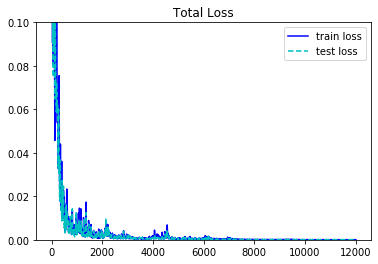

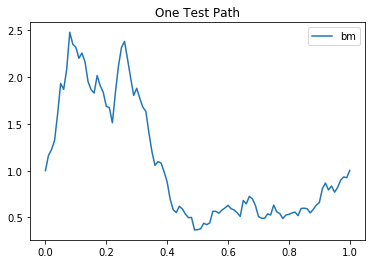

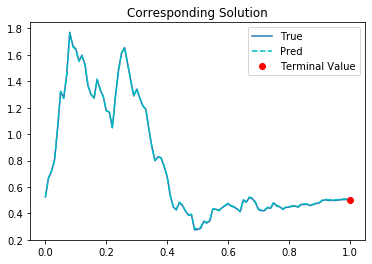

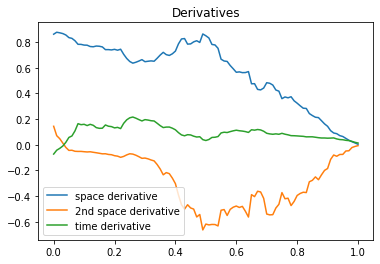

12011th Epoch:
traing loss is 9.358344686916098e-05, test loss is 5.0436930905561894e-05, and learning rate is 7.838991587050259e-05, elapsed is 4.035160779953003.
 
12021th Epoch:
traing loss is 5.9808204241562635e-05, test loss is 4.5507167669711635e-05, and learning rate is 7.838991587050259e-05, elapsed is 3.1587932109832764.
 
12031th Epoch:
traing loss is 3.139348700642586e-05, test loss is 4.2297393520129845e-05, and learning rate is 7.838991587050259e-05, elapsed is 3.1351184844970703.
 
12041th Epoch:
traing loss is 5.242606857791543e-05, test loss is 4.1662082367111e-05, and learning rate is 7.838991587050259e-05, elapsed is 3.128202199935913.
 
12051th Epoch:
traing loss is 3.3620519388932735e-05, test loss is 4.0813087252900004e-05, and learning rate is 7.682211435167119e-05, elapsed is 3.1611156463623047.
 
12061th Epoch:
traing loss is 6.479019793914631e-05, test loss is 4.111412272322923e-05, and learning rate is 7.682211435167119e-05, elapsed is 3.065309524536133.
 
120

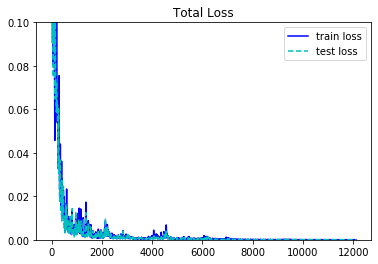

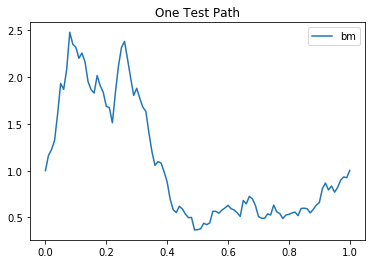

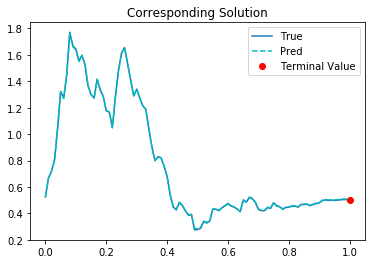

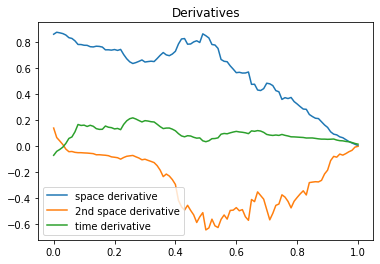

12111th Epoch:
traing loss is 8.977613470051438e-05, test loss is 5.077431706013158e-05, and learning rate is 7.528567221015692e-05, elapsed is 4.114940404891968.
 
12121th Epoch:
traing loss is 5.961265924270265e-05, test loss is 4.4349570089252666e-05, and learning rate is 7.528567221015692e-05, elapsed is 3.100795269012451.
 
12131th Epoch:
traing loss is 3.164281224599108e-05, test loss is 4.156617433181964e-05, and learning rate is 7.528567221015692e-05, elapsed is 3.155881404876709.
 
12141th Epoch:
traing loss is 4.369580710772425e-05, test loss is 4.303184323362075e-05, and learning rate is 7.528567221015692e-05, elapsed is 3.077986717224121.
 
12151th Epoch:
traing loss is 2.9552096748375334e-05, test loss is 3.942571856896393e-05, and learning rate is 7.377996371360496e-05, elapsed is 3.0916121006011963.
 
12161th Epoch:
traing loss is 6.196874164743349e-05, test loss is 4.131440800847486e-05, and learning rate is 7.377996371360496e-05, elapsed is 3.0402469635009766.
 
12171t

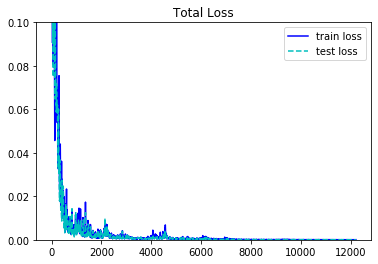

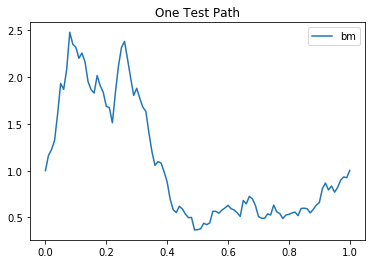

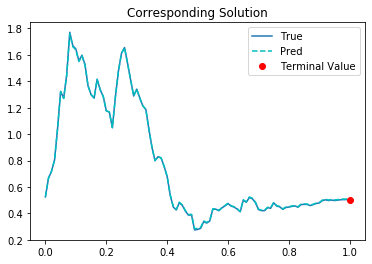

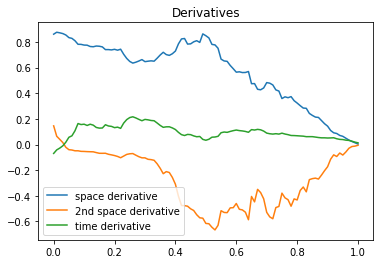

12211th Epoch:
traing loss is 9.043341560754925e-05, test loss is 4.8623260227032006e-05, and learning rate is 7.23043704056181e-05, elapsed is 4.170583724975586.
 
12221th Epoch:
traing loss is 5.8527606597635895e-05, test loss is 4.385917418403551e-05, and learning rate is 7.23043704056181e-05, elapsed is 3.1178157329559326.
 
12231th Epoch:
traing loss is 3.0357159630511887e-05, test loss is 4.102907041669823e-05, and learning rate is 7.23043704056181e-05, elapsed is 3.1074721813201904.
 
12241th Epoch:
traing loss is 5.0826023652916774e-05, test loss is 4.067205736646429e-05, and learning rate is 7.23043704056181e-05, elapsed is 3.126054048538208.
 
12251th Epoch:
traing loss is 3.2941017707344145e-05, test loss is 4.009383701486513e-05, and learning rate is 7.085828110575676e-05, elapsed is 3.1512389183044434.
 
12261th Epoch:
traing loss is 6.582924834219739e-05, test loss is 3.99216114601586e-05, and learning rate is 7.085828110575676e-05, elapsed is 3.1008663177490234.
 
12271t

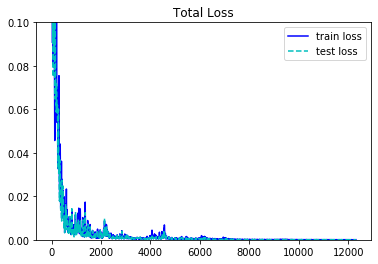

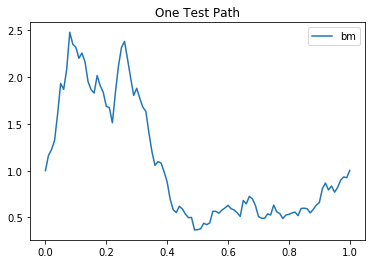

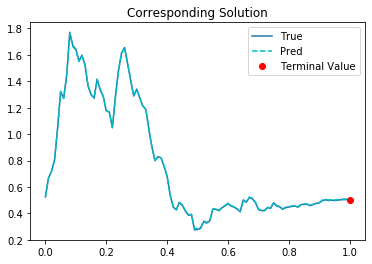

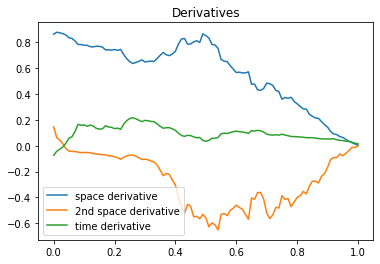

12311th Epoch:
traing loss is 8.59915598994121e-05, test loss is 4.8309248086297885e-05, and learning rate is 6.94411137374118e-05, elapsed is 4.175678730010986.
 
12321th Epoch:
traing loss is 5.776277248514816e-05, test loss is 4.325140980654396e-05, and learning rate is 6.94411137374118e-05, elapsed is 3.1112003326416016.
 
12331th Epoch:
traing loss is 3.0207007512217388e-05, test loss is 4.0552386053605005e-05, and learning rate is 6.94411137374118e-05, elapsed is 3.1143174171447754.
 
12341th Epoch:
traing loss is 4.22001066908706e-05, test loss is 4.12686713389121e-05, and learning rate is 6.94411137374118e-05, elapsed is 3.0609776973724365.
 
12351th Epoch:
traing loss is 2.8359176212688908e-05, test loss is 3.847150583169423e-05, and learning rate is 6.805230077588931e-05, elapsed is 3.0795135498046875.
 
12361th Epoch:
traing loss is 6.146746454760432e-05, test loss is 4.1129402234219015e-05, and learning rate is 6.805230077588931e-05, elapsed is 3.1314961910247803.
 
12371th

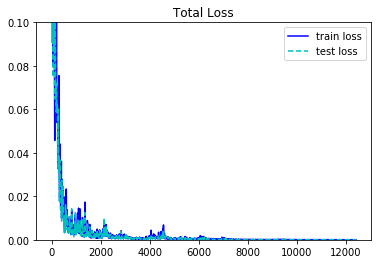

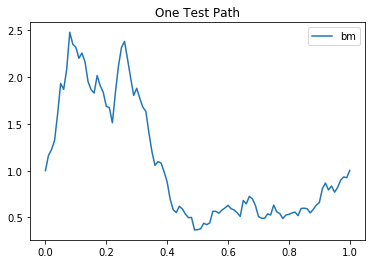

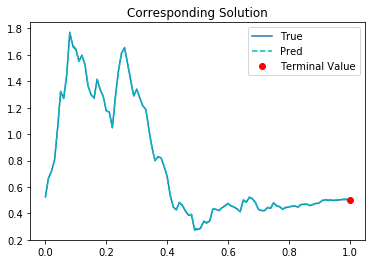

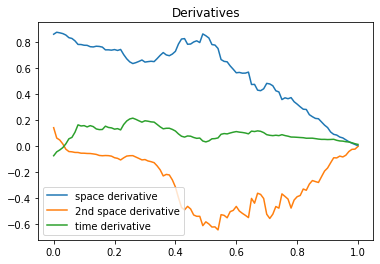

12411th Epoch:
traing loss is 9.038187272381037e-05, test loss is 4.748612627736293e-05, and learning rate is 6.669124559266493e-05, elapsed is 4.097020149230957.
 
12421th Epoch:
traing loss is 5.754737867391668e-05, test loss is 4.2879113607341424e-05, and learning rate is 6.669124559266493e-05, elapsed is 3.014557123184204.
 
12431th Epoch:
traing loss is 2.931426752184052e-05, test loss is 3.9711467252345756e-05, and learning rate is 6.669124559266493e-05, elapsed is 2.9861016273498535.
 
12441th Epoch:
traing loss is 5.012270776205696e-05, test loss is 4.009139593108557e-05, and learning rate is 6.669124559266493e-05, elapsed is 3.0638113021850586.
 
12451th Epoch:
traing loss is 3.261179881519638e-05, test loss is 3.981300687883049e-05, and learning rate is 6.535742431879044e-05, elapsed is 3.144880771636963.
 
12461th Epoch:
traing loss is 6.28988491371274e-05, test loss is 3.928922888007946e-05, and learning rate is 6.535742431879044e-05, elapsed is 3.129551649093628.
 
12471th

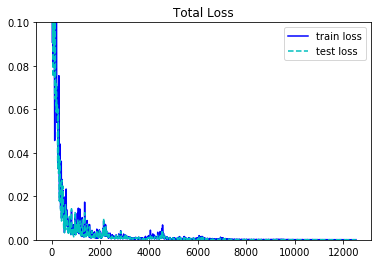

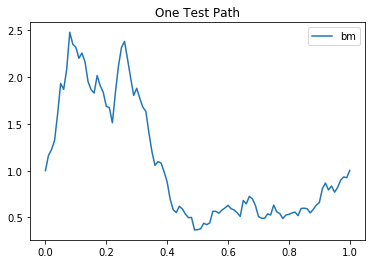

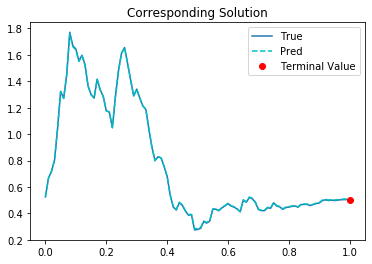

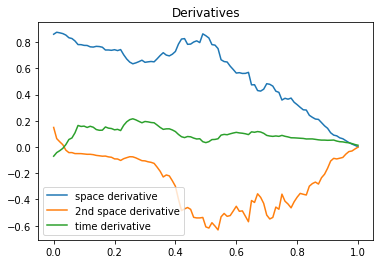

12511th Epoch:
traing loss is 8.443419937975705e-05, test loss is 4.6689543523825705e-05, and learning rate is 6.405027670552954e-05, elapsed is 4.027740240097046.
 
12521th Epoch:
traing loss is 5.735809827456251e-05, test loss is 4.233375875628553e-05, and learning rate is 6.405027670552954e-05, elapsed is 3.0460448265075684.
 
12531th Epoch:
traing loss is 2.9501219614758156e-05, test loss is 3.994957296526991e-05, and learning rate is 6.405027670552954e-05, elapsed is 3.057953357696533.
 
12541th Epoch:
traing loss is 4.055059253005311e-05, test loss is 3.965641371905804e-05, and learning rate is 6.405027670552954e-05, elapsed is 3.0599076747894287.
 
12551th Epoch:
traing loss is 2.8393509637680836e-05, test loss is 3.817178730969317e-05, and learning rate is 6.276927888393402e-05, elapsed is 3.0810954570770264.
 
12561th Epoch:
traing loss is 6.0104590374976397e-05, test loss is 3.971974365413189e-05, and learning rate is 6.276927888393402e-05, elapsed is 3.0630440711975098.
 
12

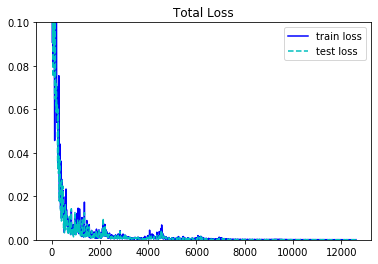

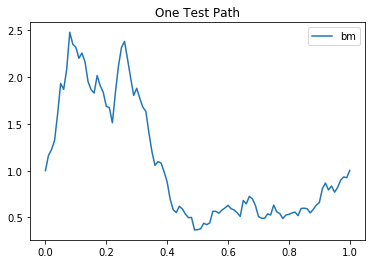

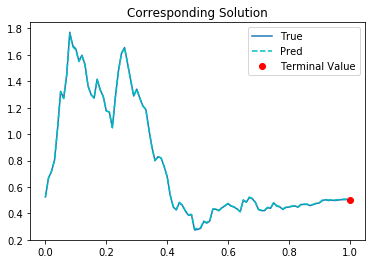

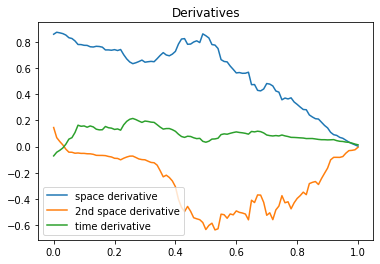

12611th Epoch:
traing loss is 8.63101813592948e-05, test loss is 4.5919350668555126e-05, and learning rate is 6.151389243314043e-05, elapsed is 4.019390106201172.
 
12621th Epoch:
traing loss is 5.649301965604536e-05, test loss is 4.195821384200826e-05, and learning rate is 6.151389243314043e-05, elapsed is 3.1349267959594727.
 
12631th Epoch:
traing loss is 2.8827422283939086e-05, test loss is 3.9681784983258694e-05, and learning rate is 6.151389243314043e-05, elapsed is 3.141122341156006.
 
12641th Epoch:
traing loss is 4.727535633719526e-05, test loss is 3.926235149265267e-05, and learning rate is 6.151389243314043e-05, elapsed is 3.0137805938720703.
 
12651th Epoch:
traing loss is 3.2039992220234126e-05, test loss is 3.954549174522981e-05, and learning rate is 6.028361531207338e-05, elapsed is 3.0803894996643066.
 
12661th Epoch:
traing loss is 6.25863904133439e-05, test loss is 3.793881114688702e-05, and learning rate is 6.028361531207338e-05, elapsed is 3.071793794631958.
 
12671

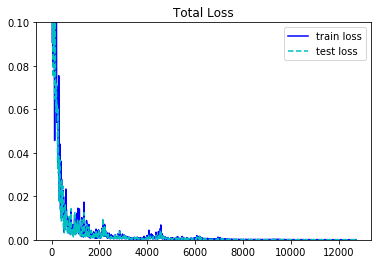

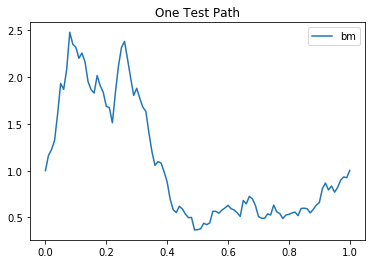

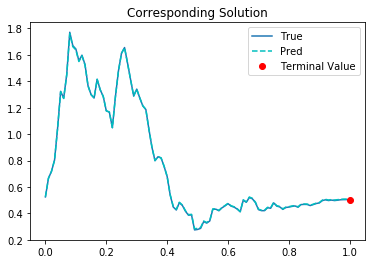

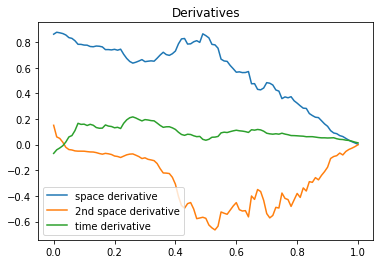

12711th Epoch:
traing loss is 8.46154143800959e-05, test loss is 4.749200525111519e-05, and learning rate is 5.9077941841678694e-05, elapsed is 4.0411553382873535.
 
12721th Epoch:
traing loss is 5.6082219089148566e-05, test loss is 4.168488158029504e-05, and learning rate is 5.9077941841678694e-05, elapsed is 3.090576171875.
 
12731th Epoch:
traing loss is 2.9251712476252578e-05, test loss is 4.039872874272987e-05, and learning rate is 5.9077941841678694e-05, elapsed is 3.0553112030029297.
 
12741th Epoch:
traing loss is 3.907395148416981e-05, test loss is 3.84473278245423e-05, and learning rate is 5.9077941841678694e-05, elapsed is 3.125519275665283.
 
12751th Epoch:
traing loss is 2.8492859200923704e-05, test loss is 3.859696153085679e-05, and learning rate is 5.789638453279622e-05, elapsed is 3.1429169178009033.
 
12761th Epoch:
traing loss is 5.796354162157513e-05, test loss is 3.8555885112145916e-05, and learning rate is 5.789638453279622e-05, elapsed is 3.085707426071167.
 
1277

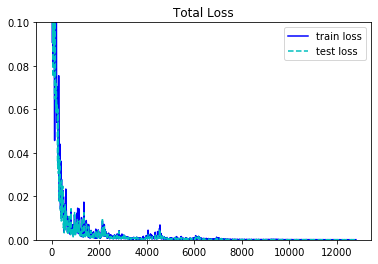

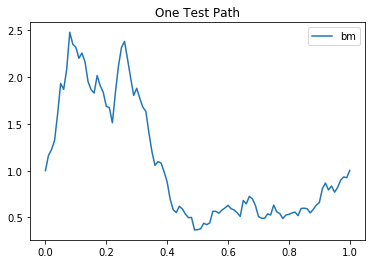

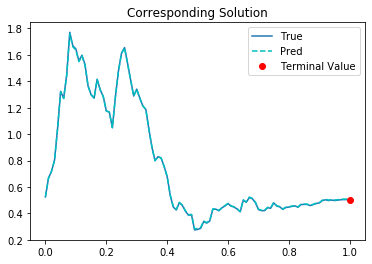

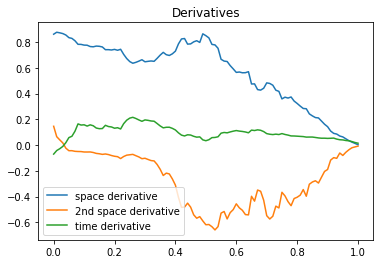

12811th Epoch:
traing loss is 8.343627268914133e-05, test loss is 4.640756014850922e-05, and learning rate is 5.673845953424461e-05, elapsed is 4.022160291671753.
 
12821th Epoch:
traing loss is 5.63896719540935e-05, test loss is 4.0477207221556455e-05, and learning rate is 5.673845953424461e-05, elapsed is 3.048670768737793.
 
12831th Epoch:
traing loss is 2.8324522645561956e-05, test loss is 3.882716191583313e-05, and learning rate is 5.673845953424461e-05, elapsed is 3.020673990249634.
 
12841th Epoch:
traing loss is 4.5576580305350944e-05, test loss is 3.9026188460411504e-05, and learning rate is 5.673845953424461e-05, elapsed is 3.1143014430999756.
 
12851th Epoch:
traing loss is 3.2336931326426566e-05, test loss is 3.986683441326022e-05, and learning rate is 5.5603690270800143e-05, elapsed is 3.10774302482605.
 
12861th Epoch:
traing loss is 6.138952448964119e-05, test loss is 3.7671325117116794e-05, and learning rate is 5.5603690270800143e-05, elapsed is 3.0604567527770996.
 
12

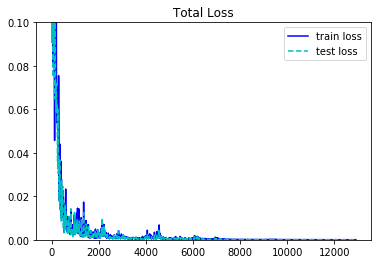

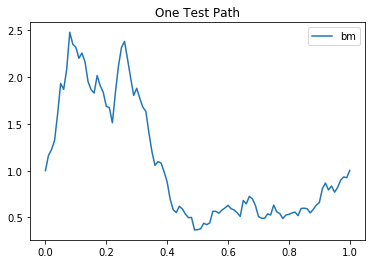

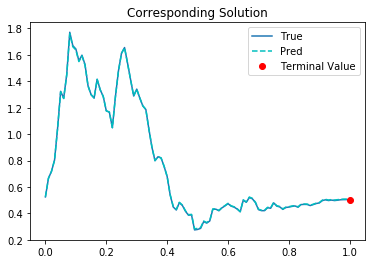

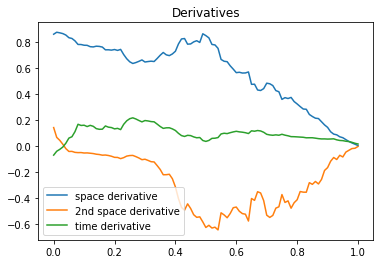

12911th Epoch:
traing loss is 8.268125384347513e-05, test loss is 4.73337531730067e-05, and learning rate is 5.449161835713312e-05, elapsed is 4.098276853561401.
 
12921th Epoch:
traing loss is 5.6471799325663596e-05, test loss is 4.177687151241116e-05, and learning rate is 5.449161835713312e-05, elapsed is 3.1598308086395264.
 
12931th Epoch:
traing loss is 2.9286480639711954e-05, test loss is 4.07498846470844e-05, and learning rate is 5.449161835713312e-05, elapsed is 3.0545670986175537.
 
12941th Epoch:
traing loss is 3.8563968701055273e-05, test loss is 3.742661283467896e-05, and learning rate is 5.449161835713312e-05, elapsed is 3.0429768562316895.
 
12951th Epoch:
traing loss is 2.8268928872421384e-05, test loss is 3.767746238736436e-05, and learning rate is 5.3401789045892656e-05, elapsed is 3.166633129119873.
 
12961th Epoch:
traing loss is 5.869810047443025e-05, test loss is 3.8070811569923535e-05, and learning rate is 5.3401789045892656e-05, elapsed is 3.002563953399658.
 
12

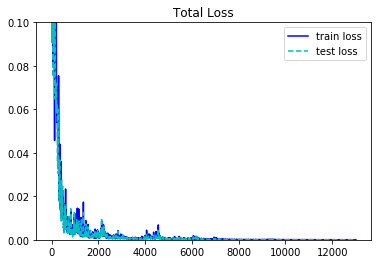

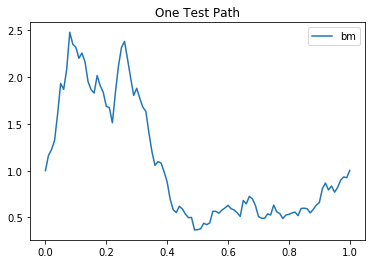

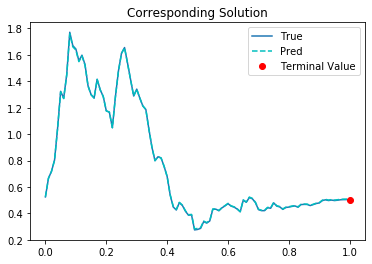

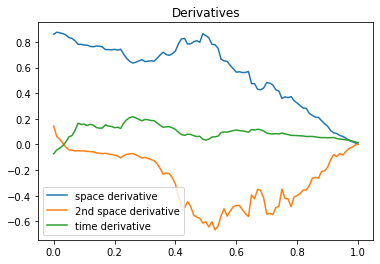

13011th Epoch:
traing loss is 8.228069054894149e-05, test loss is 4.6639983338536695e-05, and learning rate is 5.233375122770667e-05, elapsed is 4.002608060836792.
 
13021th Epoch:
traing loss is 5.765404421254061e-05, test loss is 4.1558421798981726e-05, and learning rate is 5.233375122770667e-05, elapsed is 3.0567610263824463.
 
13031th Epoch:
traing loss is 2.907264388340991e-05, test loss is 4.008375617559068e-05, and learning rate is 5.233375122770667e-05, elapsed is 3.126011610031128.
 
13041th Epoch:
traing loss is 4.395356882014312e-05, test loss is 3.856172043015249e-05, and learning rate is 5.233375122770667e-05, elapsed is 3.0169265270233154.
 
13051th Epoch:
traing loss is 3.170337367919274e-05, test loss is 3.954006388084963e-05, and learning rate is 5.128707562107593e-05, elapsed is 3.139012336730957.
 
13061th Epoch:
traing loss is 5.961233182461001e-05, test loss is 3.651200677268207e-05, and learning rate is 5.128707562107593e-05, elapsed is 3.0419209003448486.
 
13071

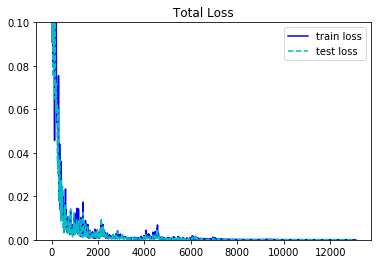

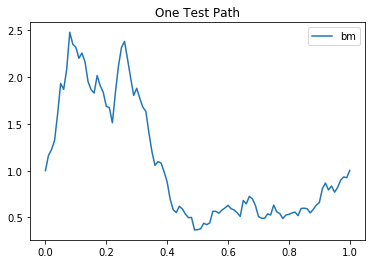

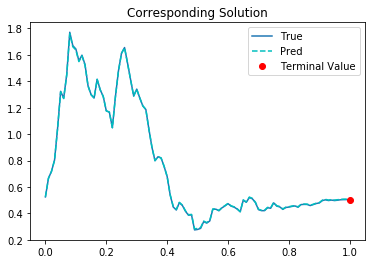

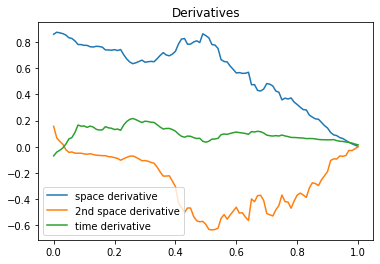

13111th Epoch:
traing loss is 8.249565144069493e-05, test loss is 4.728407657239586e-05, and learning rate is 5.026133658248e-05, elapsed is 4.128809452056885.
 
13121th Epoch:
traing loss is 5.769680137746036e-05, test loss is 4.1955132473958656e-05, and learning rate is 5.026133658248e-05, elapsed is 3.027836799621582.
 
13131th Epoch:
traing loss is 2.9413498850772157e-05, test loss is 4.036344398627989e-05, and learning rate is 5.026133658248e-05, elapsed is 3.1047656536102295.
 
13141th Epoch:
traing loss is 3.797909084823914e-05, test loss is 3.686308264150284e-05, and learning rate is 5.026133658248e-05, elapsed is 3.0343196392059326.
 
13151th Epoch:
traing loss is 2.726792445173487e-05, test loss is 3.7096597225172445e-05, and learning rate is 4.925611210637726e-05, elapsed is 3.130427837371826.
 
13161th Epoch:
traing loss is 5.763828448834829e-05, test loss is 3.673366518341936e-05, and learning rate is 4.925611210637726e-05, elapsed is 3.070091962814331.
 
13171th Epoch:
tr

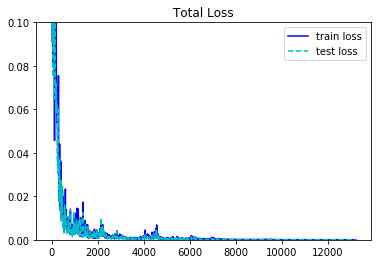

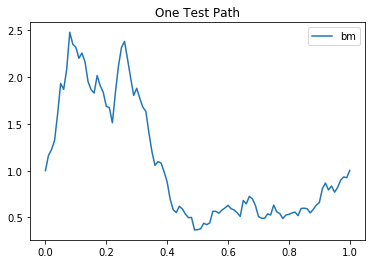

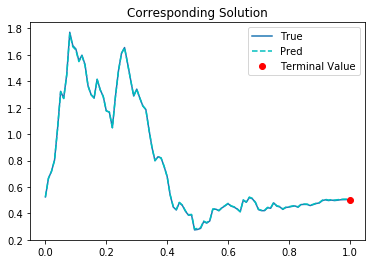

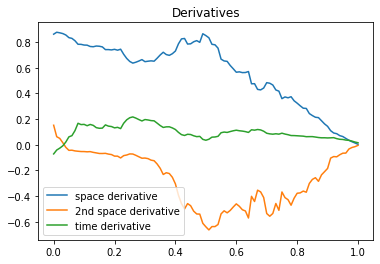

13211th Epoch:
traing loss is 8.350482676178217e-05, test loss is 4.762989192386158e-05, and learning rate is 4.82709874631837e-05, elapsed is 4.0300562381744385.
 
13221th Epoch:
traing loss is 5.929542749072425e-05, test loss is 4.290904325898737e-05, and learning rate is 4.82709874631837e-05, elapsed is 3.0519068241119385.
 
13231th Epoch:
traing loss is 2.8273741918383166e-05, test loss is 3.990043842350133e-05, and learning rate is 4.82709874631837e-05, elapsed is 3.0529444217681885.
 
13241th Epoch:
traing loss is 4.2820269300136715e-05, test loss is 3.743431807379238e-05, and learning rate is 4.82709874631837e-05, elapsed is 3.1501762866973877.
 
13251th Epoch:
traing loss is 2.9907840144005604e-05, test loss is 3.755529905902222e-05, and learning rate is 4.730556975118816e-05, elapsed is 3.028761625289917.
 
13261th Epoch:
traing loss is 5.866531137144193e-05, test loss is 3.602551805670373e-05, and learning rate is 4.730556975118816e-05, elapsed is 3.047764539718628.
 
13271th

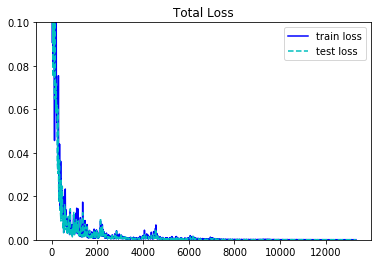

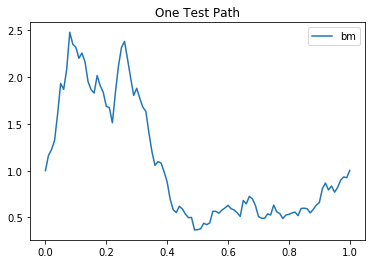

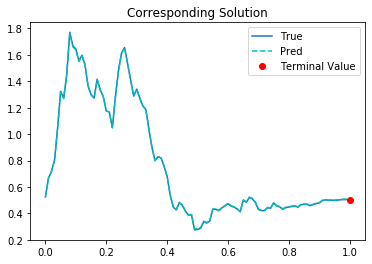

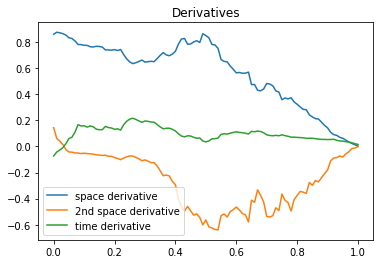

13311th Epoch:
traing loss is 8.120683924062178e-05, test loss is 4.798312147613615e-05, and learning rate is 4.635946243070066e-05, elapsed is 4.04585862159729.
 
13321th Epoch:
traing loss is 5.841992242494598e-05, test loss is 4.2898362153209746e-05, and learning rate is 4.635946243070066e-05, elapsed is 3.1537725925445557.
 
13331th Epoch:
traing loss is 2.8578335331985727e-05, test loss is 3.982029011240229e-05, and learning rate is 4.635946243070066e-05, elapsed is 3.022023916244507.
 
13341th Epoch:
traing loss is 3.8196503737708554e-05, test loss is 3.6233839637134224e-05, and learning rate is 4.635946243070066e-05, elapsed is 3.1040425300598145.
 
13351th Epoch:
traing loss is 2.7512083761394024e-05, test loss is 3.687158823595382e-05, and learning rate is 4.543226896203123e-05, elapsed is 3.121724843978882.
 
13361th Epoch:
traing loss is 5.718345710192807e-05, test loss is 3.626105171861127e-05, and learning rate is 4.543226896203123e-05, elapsed is 3.018232822418213.
 
1337

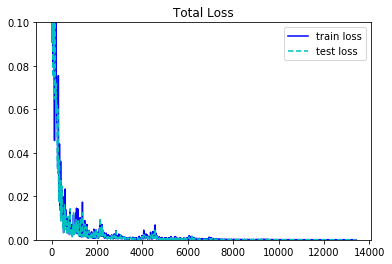

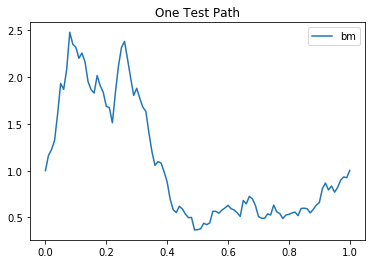

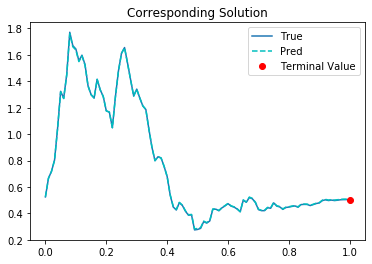

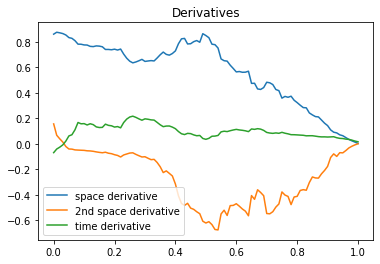

13411th Epoch:
traing loss is 8.231298852479085e-05, test loss is 4.847363379667513e-05, and learning rate is 4.452362554729916e-05, elapsed is 4.03634786605835.
 
13421th Epoch:
traing loss is 5.794558455818333e-05, test loss is 4.2301184294046834e-05, and learning rate is 4.452362554729916e-05, elapsed is 3.0877158641815186.
 
13431th Epoch:
traing loss is 2.8067128369002603e-05, test loss is 3.875889888149686e-05, and learning rate is 4.452362554729916e-05, elapsed is 3.1028692722320557.
 
13441th Epoch:
traing loss is 4.0228915167972445e-05, test loss is 3.673652099678293e-05, and learning rate is 4.452362554729916e-05, elapsed is 3.0629003047943115.
 
13451th Epoch:
traing loss is 2.9047987482044846e-05, test loss is 3.671505328384228e-05, and learning rate is 4.3633153836708516e-05, elapsed is 3.0595250129699707.
 
13461th Epoch:
traing loss is 5.8063622418558225e-05, test loss is 3.581607961677946e-05, and learning rate is 4.3633153836708516e-05, elapsed is 3.033315658569336.
 


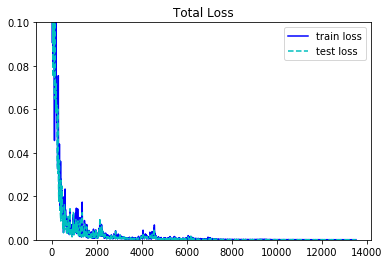

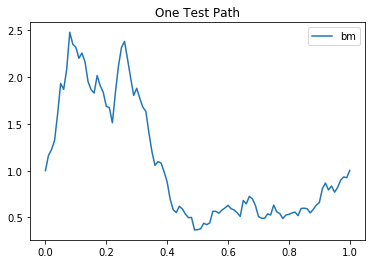

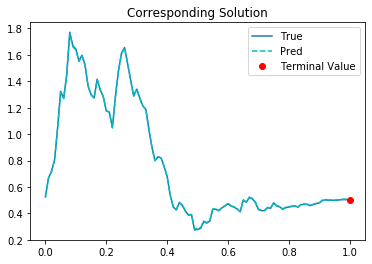

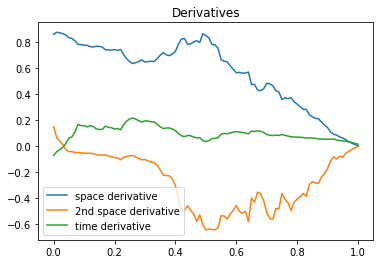

13511th Epoch:
traing loss is 8.137393888318911e-05, test loss is 4.729127249447629e-05, and learning rate is 4.276049367035739e-05, elapsed is 4.015050172805786.
 
13521th Epoch:
traing loss is 5.71473574382253e-05, test loss is 4.157680814387277e-05, and learning rate is 4.276049367035739e-05, elapsed is 3.0638551712036133.
 
13531th Epoch:
traing loss is 2.7427831810200587e-05, test loss is 3.774149081436917e-05, and learning rate is 4.276049367035739e-05, elapsed is 3.025472640991211.
 
13541th Epoch:
traing loss is 3.833224764093757e-05, test loss is 3.6279907362768427e-05, and learning rate is 4.276049367035739e-05, elapsed is 3.0629985332489014.
 
13551th Epoch:
traing loss is 2.7772714020102285e-05, test loss is 3.6290155549068004e-05, and learning rate is 4.190528852632269e-05, elapsed is 3.0694475173950195.
 
13561th Epoch:
traing loss is 5.54399739485234e-05, test loss is 3.557105810614303e-05, and learning rate is 4.190528852632269e-05, elapsed is 3.120612621307373.
 
13571

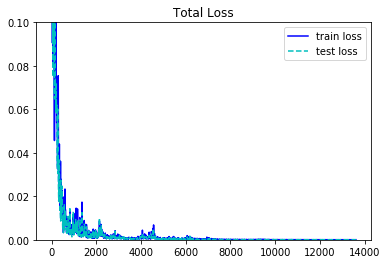

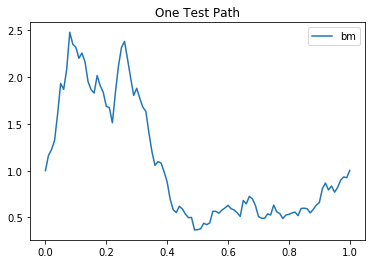

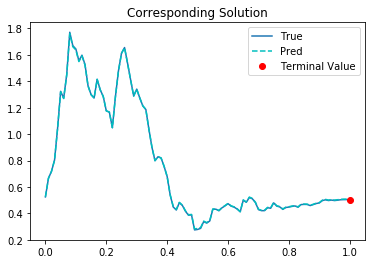

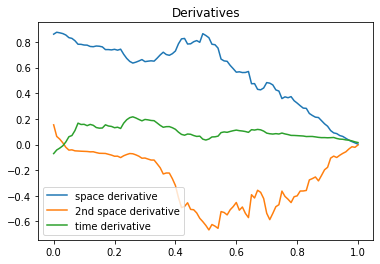

13611th Epoch:
traing loss is 8.074784273048863e-05, test loss is 4.748570790980011e-05, and learning rate is 4.1067181882681325e-05, elapsed is 4.032259941101074.
 
13621th Epoch:
traing loss is 5.68702416785527e-05, test loss is 4.123806502320804e-05, and learning rate is 4.1067181882681325e-05, elapsed is 3.0068702697753906.
 
13631th Epoch:
traing loss is 2.6974656066158786e-05, test loss is 3.734236452146433e-05, and learning rate is 4.1067181882681325e-05, elapsed is 3.140662908554077.
 
13641th Epoch:
traing loss is 3.96655268559698e-05, test loss is 3.605834717745893e-05, and learning rate is 4.1067181882681325e-05, elapsed is 3.1412734985351562.
 
13651th Epoch:
traing loss is 2.929887705249712e-05, test loss is 3.661265145638026e-05, and learning rate is 4.0245839045383036e-05, elapsed is 3.118014335632324.
 
13661th Epoch:
traing loss is 5.687610246241093e-05, test loss is 3.525167630868964e-05, and learning rate is 4.0245839045383036e-05, elapsed is 3.146578550338745.
 
136

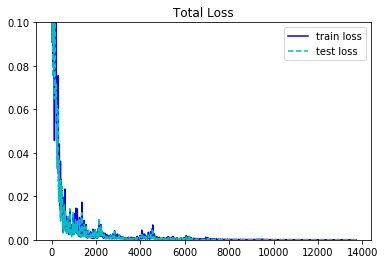

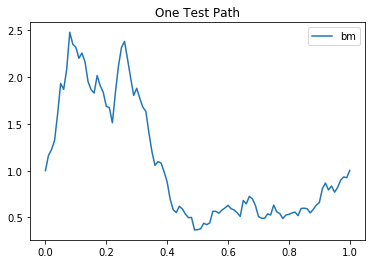

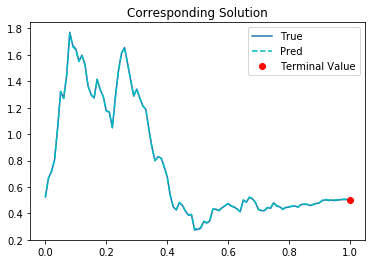

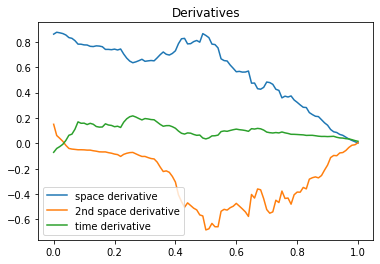

13711th Epoch:
traing loss is 7.809535600244999e-05, test loss is 4.7544697736157104e-05, and learning rate is 3.9440921682398766e-05, elapsed is 4.0106542110443115.
 
13721th Epoch:
traing loss is 5.563786908169277e-05, test loss is 4.051140422234312e-05, and learning rate is 3.9440921682398766e-05, elapsed is 2.985612392425537.
 
13731th Epoch:
traing loss is 2.6552424969850108e-05, test loss is 3.7134901504032314e-05, and learning rate is 3.9440921682398766e-05, elapsed is 3.025639533996582.
 
13741th Epoch:
traing loss is 3.811940041487105e-05, test loss is 3.6050481867277995e-05, and learning rate is 3.9440921682398766e-05, elapsed is 3.0163979530334473.
 
13751th Epoch:
traing loss is 2.7585288989939727e-05, test loss is 3.6229572287993506e-05, and learning rate is 3.865210237563588e-05, elapsed is 3.0444529056549072.
 
13761th Epoch:
traing loss is 5.641951065626927e-05, test loss is 3.468694558250718e-05, and learning rate is 3.865210237563588e-05, elapsed is 3.0437660217285156

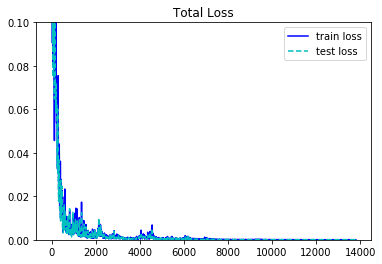

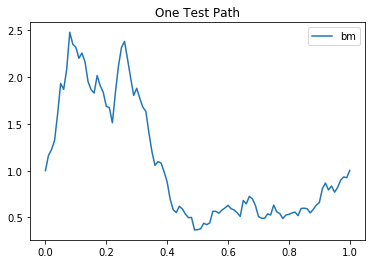

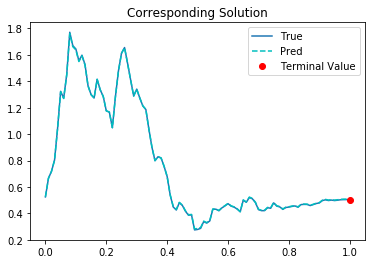

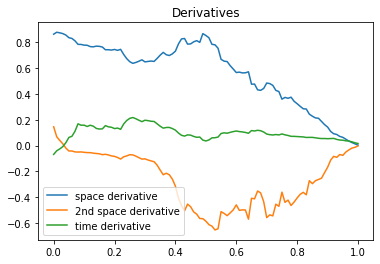

13811th Epoch:
traing loss is 8.215440902858973e-05, test loss is 4.771922976942733e-05, and learning rate is 3.787906462093815e-05, elapsed is 4.084110975265503.
 
13821th Epoch:
traing loss is 5.480180698214099e-05, test loss is 3.950098471250385e-05, and learning rate is 3.787906462093815e-05, elapsed is 3.0802700519561768.
 
13831th Epoch:
traing loss is 2.6407580662635155e-05, test loss is 3.7086752854520455e-05, and learning rate is 3.787906462093815e-05, elapsed is 3.0887105464935303.
 
13841th Epoch:
traing loss is 3.912896863766946e-05, test loss is 3.6105771869188175e-05, and learning rate is 3.787906462093815e-05, elapsed is 3.063371181488037.
 
13851th Epoch:
traing loss is 2.9341001209104434e-05, test loss is 3.668030694825575e-05, and learning rate is 3.712148100021295e-05, elapsed is 3.0854053497314453.
 
13861th Epoch:
traing loss is 5.780323772341944e-05, test loss is 3.467143324087374e-05, and learning rate is 3.712148100021295e-05, elapsed is 3.1664557456970215.
 
13

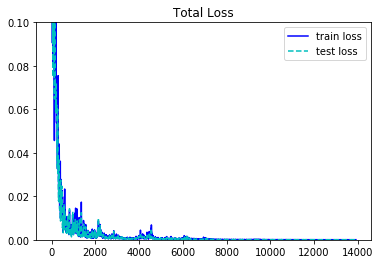

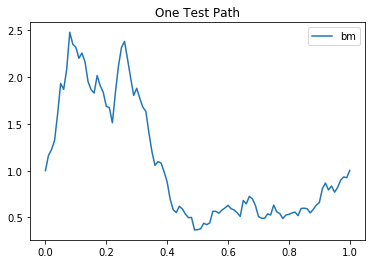

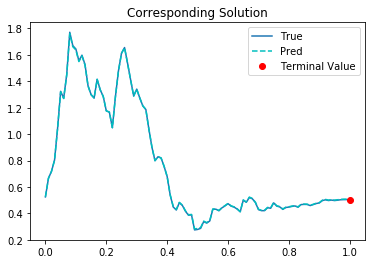

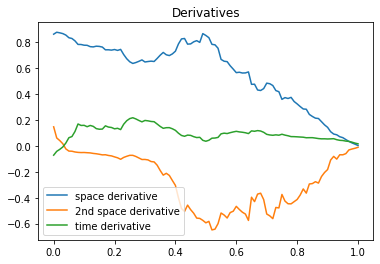

13911th Epoch:
traing loss is 7.927192928036675e-05, test loss is 4.7031266149133444e-05, and learning rate is 3.63790531991981e-05, elapsed is 3.9397029876708984.
 
13921th Epoch:
traing loss is 5.367191988625564e-05, test loss is 3.8904825487406924e-05, and learning rate is 3.63790531991981e-05, elapsed is 3.0334041118621826.
 
13931th Epoch:
traing loss is 2.6294639610568993e-05, test loss is 3.6481418646872044e-05, and learning rate is 3.63790531991981e-05, elapsed is 3.0202815532684326.
 
13941th Epoch:
traing loss is 3.773705611820333e-05, test loss is 3.596944588935003e-05, and learning rate is 3.63790531991981e-05, elapsed is 3.028282403945923.
 
13951th Epoch:
traing loss is 2.8682503398158588e-05, test loss is 3.694060796988197e-05, and learning rate is 3.565147198969498e-05, elapsed is 3.053229570388794.
 
13961th Epoch:
traing loss is 5.506119123310782e-05, test loss is 3.467737042228691e-05, and learning rate is 3.565147198969498e-05, elapsed is 3.0259008407592773.
 
13971

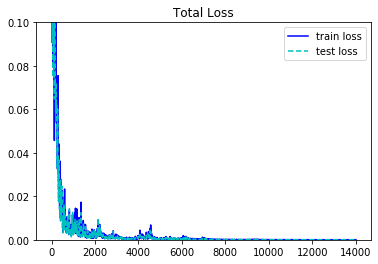

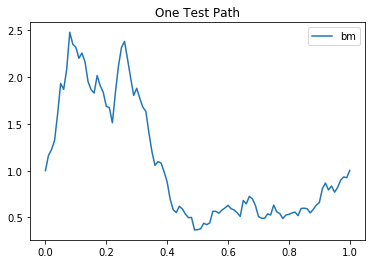

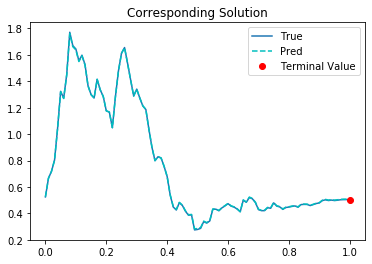

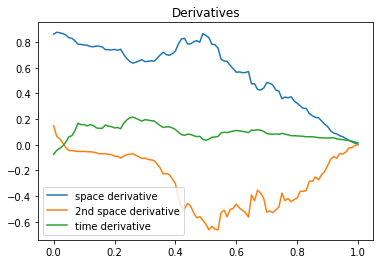

14011th Epoch:
traing loss is 7.924445526441559e-05, test loss is 4.629747854778543e-05, and learning rate is 3.493844633339904e-05, elapsed is 4.029906749725342.
 
14021th Epoch:
traing loss is 5.2925795898772776e-05, test loss is 3.778073005378246e-05, and learning rate is 3.493844633339904e-05, elapsed is 3.0410501956939697.
 
14031th Epoch:
traing loss is 2.603497341624461e-05, test loss is 3.6573372199200094e-05, and learning rate is 3.493844633339904e-05, elapsed is 3.1097841262817383.
 
14041th Epoch:
traing loss is 3.8245510950218886e-05, test loss is 3.534511415637098e-05, and learning rate is 3.493844633339904e-05, elapsed is 3.106313467025757.
 
14051th Epoch:
traing loss is 2.943798608612269e-05, test loss is 3.69239533029031e-05, and learning rate is 3.423967427806929e-05, elapsed is 3.045334577560425.
 
14061th Epoch:
traing loss is 5.6842218327801675e-05, test loss is 3.473385004326701e-05, and learning rate is 3.423967427806929e-05, elapsed is 3.0630218982696533.
 
1407

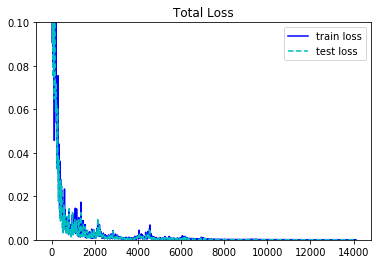

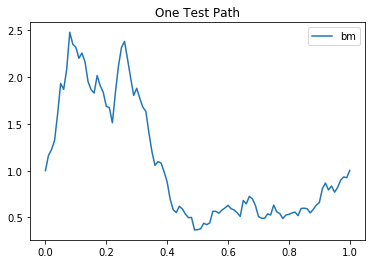

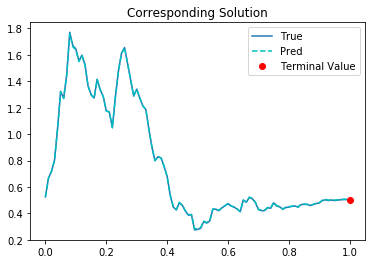

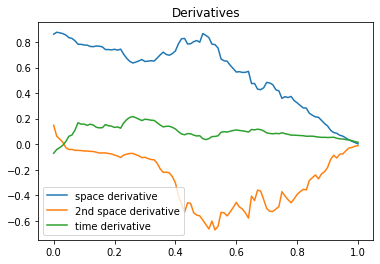

14111th Epoch:
traing loss is 7.988409925019369e-05, test loss is 4.7129884478636086e-05, and learning rate is 3.3554882975295186e-05, elapsed is 3.923769474029541.
 
14121th Epoch:
traing loss is 5.101010901853442e-05, test loss is 3.7359175621531904e-05, and learning rate is 3.3554882975295186e-05, elapsed is 3.0207080841064453.
 
14131th Epoch:
traing loss is 2.633392250572797e-05, test loss is 3.643312811618671e-05, and learning rate is 3.3554882975295186e-05, elapsed is 3.049241781234741.
 
14141th Epoch:
traing loss is 3.718692823895253e-05, test loss is 3.5347689845366403e-05, and learning rate is 3.3554882975295186e-05, elapsed is 3.0995121002197266.
 
14151th Epoch:
traing loss is 2.9076792998239398e-05, test loss is 3.721114990185015e-05, and learning rate is 3.288378502475098e-05, elapsed is 3.1371524333953857.
 
14161th Epoch:
traing loss is 5.610123116639443e-05, test loss is 3.4170665458077565e-05, and learning rate is 3.288378502475098e-05, elapsed is 3.065511703491211.


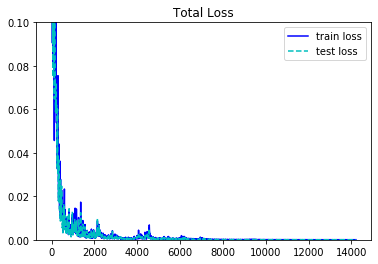

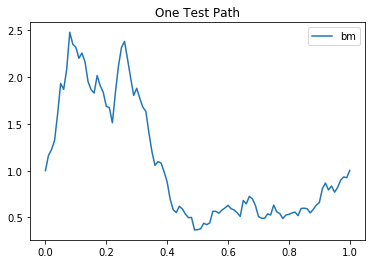

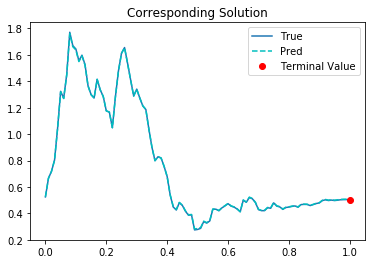

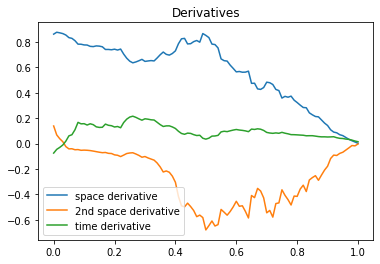

14211th Epoch:
traing loss is 7.906118844402954e-05, test loss is 4.70948543807026e-05, and learning rate is 3.222611121600494e-05, elapsed is 4.065042972564697.
 
14221th Epoch:
traing loss is 5.111034988658503e-05, test loss is 3.683456088765524e-05, and learning rate is 3.222611121600494e-05, elapsed is 3.0759875774383545.
 
14231th Epoch:
traing loss is 2.5888897653203458e-05, test loss is 3.645422839326784e-05, and learning rate is 3.222611121600494e-05, elapsed is 3.131675958633423.
 
14241th Epoch:
traing loss is 3.7841022276552394e-05, test loss is 3.533695780788548e-05, and learning rate is 3.222611121600494e-05, elapsed is 3.1194283962249756.
 
14251th Epoch:
traing loss is 2.957478864118457e-05, test loss is 3.734799611265771e-05, and learning rate is 3.1581588700646535e-05, elapsed is 3.020453929901123.
 
14261th Epoch:
traing loss is 5.6242810387630016e-05, test loss is 3.5060467780567706e-05, and learning rate is 3.1581588700646535e-05, elapsed is 3.1469690799713135.
 
14

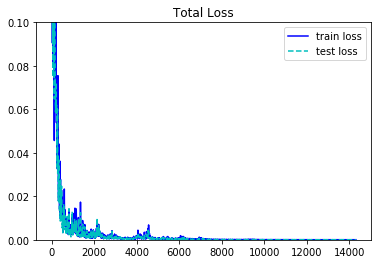

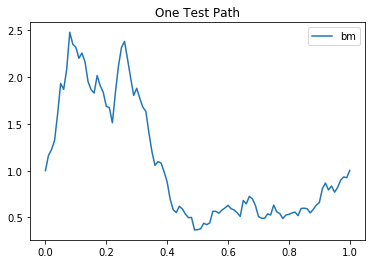

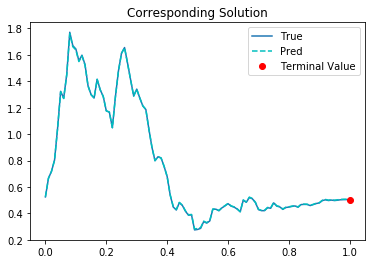

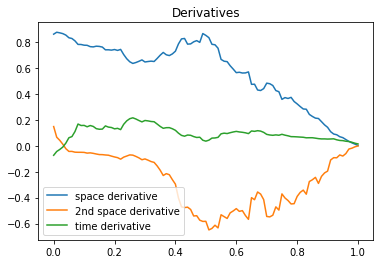

14311th Epoch:
traing loss is 7.874769653426483e-05, test loss is 4.739113865070976e-05, and learning rate is 3.0949959182180464e-05, elapsed is 4.1944639682769775.
 
14321th Epoch:
traing loss is 4.948817513650283e-05, test loss is 3.598231342039071e-05, and learning rate is 3.0949959182180464e-05, elapsed is 3.3094875812530518.
 
14331th Epoch:
traing loss is 2.5227791411452927e-05, test loss is 3.6152167012915015e-05, and learning rate is 3.0949959182180464e-05, elapsed is 3.1947598457336426.
 
14341th Epoch:
traing loss is 3.699308217619546e-05, test loss is 3.533007838996127e-05, and learning rate is 3.0949959182180464e-05, elapsed is 3.2923614978790283.
 
14351th Epoch:
traing loss is 2.8582782761077397e-05, test loss is 3.576845847419463e-05, and learning rate is 3.0330958907143213e-05, elapsed is 3.211489200592041.
 
14361th Epoch:
traing loss is 5.6503347877878696e-05, test loss is 3.529079185682349e-05, and learning rate is 3.0330958907143213e-05, elapsed is 3.224796533584594

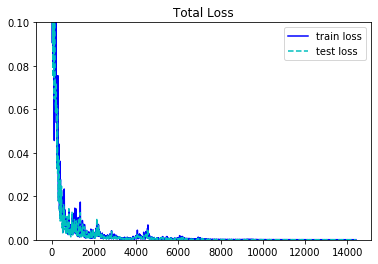

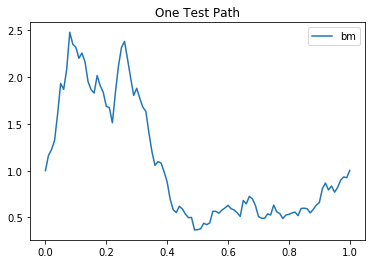

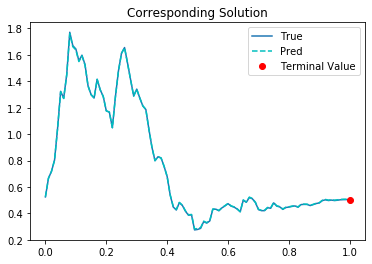

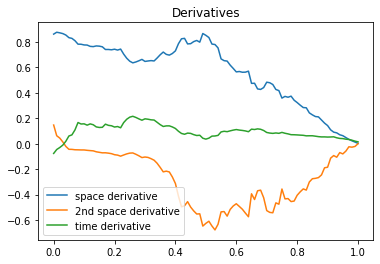

14411th Epoch:
traing loss is 7.814656419213861e-05, test loss is 4.792027539224364e-05, and learning rate is 2.9724340492975898e-05, elapsed is 5.0741026401519775.
 
14421th Epoch:
traing loss is 4.772176544065587e-05, test loss is 3.5084896808257326e-05, and learning rate is 2.9724340492975898e-05, elapsed is 3.055753469467163.
 
14431th Epoch:
traing loss is 2.5032397388713434e-05, test loss is 3.507741348585114e-05, and learning rate is 2.9724340492975898e-05, elapsed is 3.136286973953247.
 
14441th Epoch:
traing loss is 3.6831479519605637e-05, test loss is 3.515490243444219e-05, and learning rate is 2.9724340492975898e-05, elapsed is 3.103499174118042.
 
14451th Epoch:
traing loss is 2.8297163225943223e-05, test loss is 3.5020515497308224e-05, and learning rate is 2.9129854738130234e-05, elapsed is 3.1873385906219482.
 
14461th Epoch:
traing loss is 5.6925451644929126e-05, test loss is 3.502595063764602e-05, and learning rate is 2.9129854738130234e-05, elapsed is 3.062136888504028

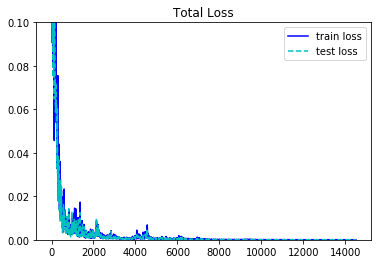

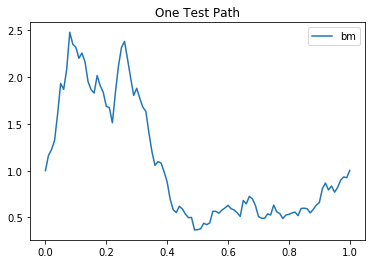

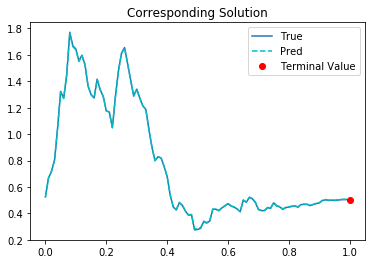

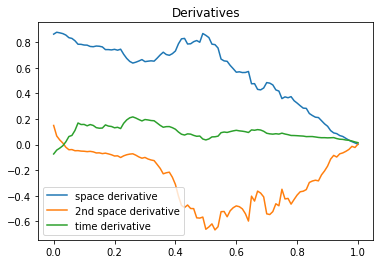

14511th Epoch:
traing loss is 7.859025936340913e-05, test loss is 4.7721274313516915e-05, and learning rate is 2.8547257898026146e-05, elapsed is 4.126689672470093.
 
14521th Epoch:
traing loss is 4.850823461310938e-05, test loss is 3.547820961102843e-05, and learning rate is 2.8547257898026146e-05, elapsed is 3.102280855178833.
 
14531th Epoch:
traing loss is 2.4630542611703277e-05, test loss is 3.5219909477746114e-05, and learning rate is 2.8547257898026146e-05, elapsed is 3.1156718730926514.
 
14541th Epoch:
traing loss is 3.676052438095212e-05, test loss is 3.558461321517825e-05, and learning rate is 2.8547257898026146e-05, elapsed is 3.1293299198150635.
 
14551th Epoch:
traing loss is 2.7294674509903416e-05, test loss is 3.467039641691372e-05, and learning rate is 2.7976315323030576e-05, elapsed is 3.060431718826294.
 
14561th Epoch:
traing loss is 5.581617369898595e-05, test loss is 3.459959043539129e-05, and learning rate is 2.7976315323030576e-05, elapsed is 3.068633794784546.


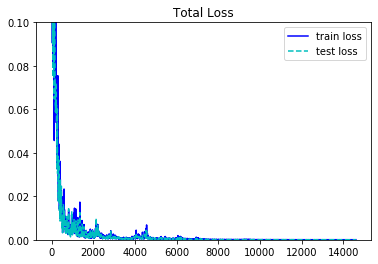

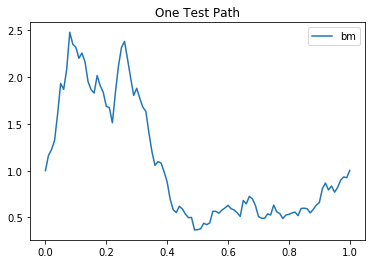

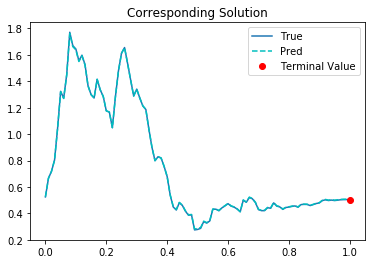

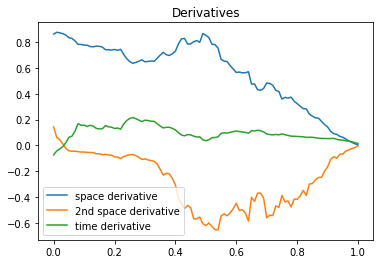

14611th Epoch:
traing loss is 7.846755033824593e-05, test loss is 4.5647393562830985e-05, and learning rate is 2.741678872553166e-05, elapsed is 4.08801794052124.
 
14621th Epoch:
traing loss is 4.755704867420718e-05, test loss is 3.5196655517211184e-05, and learning rate is 2.741678872553166e-05, elapsed is 3.0483908653259277.
 
14631th Epoch:
traing loss is 2.4031169232330285e-05, test loss is 3.409431883483194e-05, and learning rate is 2.741678872553166e-05, elapsed is 3.1202127933502197.
 
14641th Epoch:
traing loss is 3.627007390605286e-05, test loss is 3.4325090382480994e-05, and learning rate is 2.741678872553166e-05, elapsed is 3.160005569458008.
 
14651th Epoch:
traing loss is 2.7117739591631107e-05, test loss is 3.399702472961508e-05, and learning rate is 2.6868450731853954e-05, elapsed is 3.0697288513183594.
 
14661th Epoch:
traing loss is 5.545153180719353e-05, test loss is 3.4198510547867045e-05, and learning rate is 2.6868450731853954e-05, elapsed is 3.226374387741089.
 


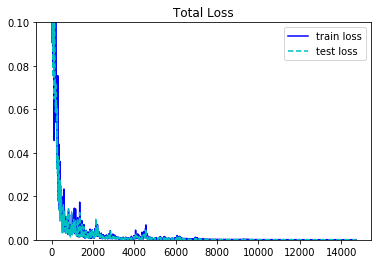

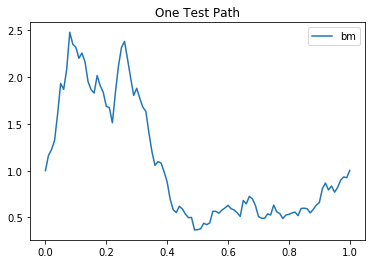

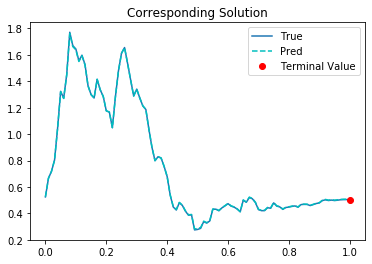

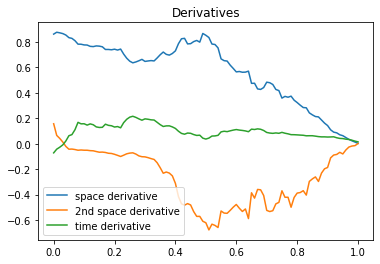

14711th Epoch:
traing loss is 7.850684050936252e-05, test loss is 4.541284215520136e-05, and learning rate is 2.6331083063269034e-05, elapsed is 4.108655214309692.
 
14721th Epoch:
traing loss is 4.864981383434497e-05, test loss is 3.5336503060534596e-05, and learning rate is 2.6331083063269034e-05, elapsed is 3.145082473754883.
 
14731th Epoch:
traing loss is 2.3835000320104882e-05, test loss is 3.4373661037534475e-05, and learning rate is 2.6331083063269034e-05, elapsed is 3.0735790729522705.
 
14741th Epoch:
traing loss is 3.5324472264619544e-05, test loss is 3.422958616283722e-05, and learning rate is 2.6331083063269034e-05, elapsed is 3.0768229961395264.
 
14751th Epoch:
traing loss is 2.6984032956534065e-05, test loss is 3.353572537889704e-05, and learning rate is 2.5804461984080262e-05, elapsed is 3.1494805812835693.
 
14761th Epoch:
traing loss is 5.506634261109866e-05, test loss is 3.401594585739076e-05, and learning rate is 2.5804461984080262e-05, elapsed is 3.146650314331054

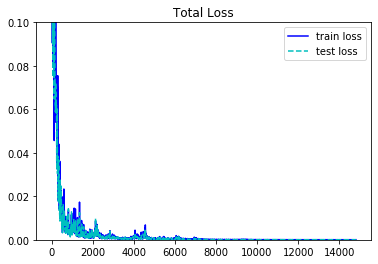

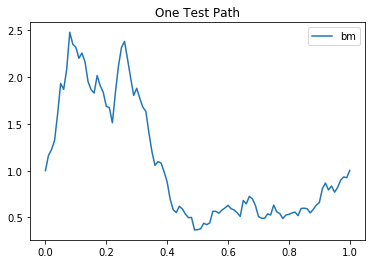

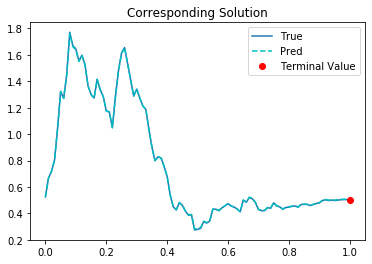

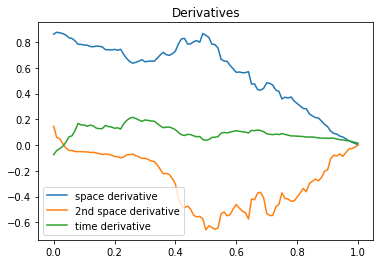

14811th Epoch:
traing loss is 7.624960562679917e-05, test loss is 4.472339423955418e-05, and learning rate is 2.528837285353802e-05, elapsed is 4.113692045211792.
 
14821th Epoch:
traing loss is 4.833248385693878e-05, test loss is 3.587448372854851e-05, and learning rate is 2.528837285353802e-05, elapsed is 3.062469005584717.
 
14831th Epoch:
traing loss is 2.4548042347305454e-05, test loss is 3.44420550391078e-05, and learning rate is 2.528837285353802e-05, elapsed is 3.132554292678833.
 
14841th Epoch:
traing loss is 3.54525946022477e-05, test loss is 3.419584027142264e-05, and learning rate is 2.528837285353802e-05, elapsed is 3.097791910171509.
 
14851th Epoch:
traing loss is 2.6848516426980495e-05, test loss is 3.382395880180411e-05, and learning rate is 2.4782606487860903e-05, elapsed is 3.093473196029663.
 
14861th Epoch:
traing loss is 5.597427298198454e-05, test loss is 3.397714681341313e-05, and learning rate is 2.4782606487860903e-05, elapsed is 3.0321216583251953.
 
14871th

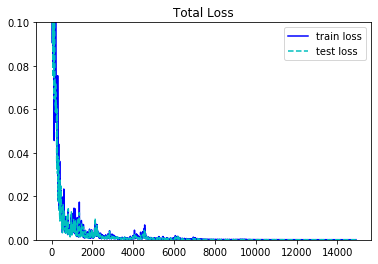

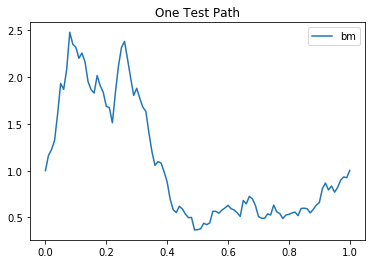

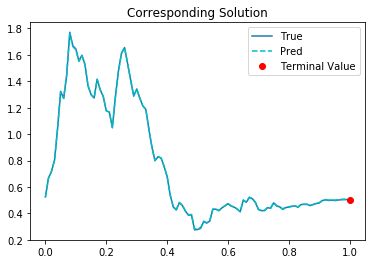

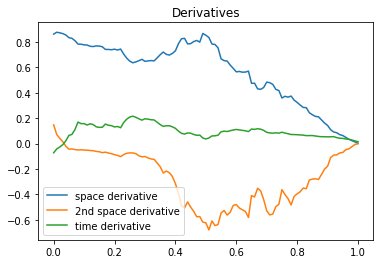

14911th Epoch:
traing loss is 7.678731344640255e-05, test loss is 4.373414412839338e-05, and learning rate is 2.4286955522256903e-05, elapsed is 4.092162132263184.
 
14921th Epoch:
traing loss is 4.768012877320871e-05, test loss is 3.500786260701716e-05, and learning rate is 2.4286955522256903e-05, elapsed is 3.115945339202881.
 
14931th Epoch:
traing loss is 2.3742251869407482e-05, test loss is 3.434140307945199e-05, and learning rate is 2.4286955522256903e-05, elapsed is 3.110135316848755.
 
14941th Epoch:
traing loss is 3.431126242503524e-05, test loss is 3.353240026626736e-05, and learning rate is 2.4286955522256903e-05, elapsed is 3.0753631591796875.
 
14951th Epoch:
traing loss is 2.6669256840250455e-05, test loss is 3.350338010932319e-05, and learning rate is 2.3801216229912825e-05, elapsed is 3.282423973083496.
 
14961th Epoch:
traing loss is 5.611500455415808e-05, test loss is 3.398048647795804e-05, and learning rate is 2.3801216229912825e-05, elapsed is 3.1536905765533447.
 


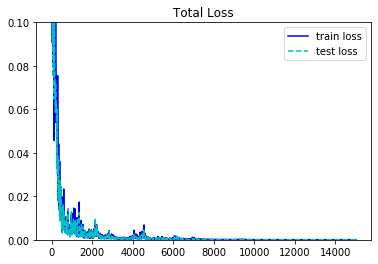

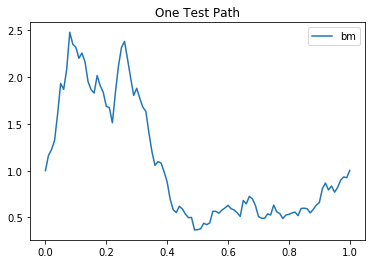

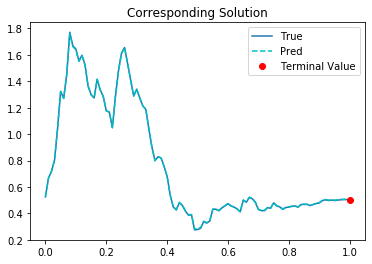

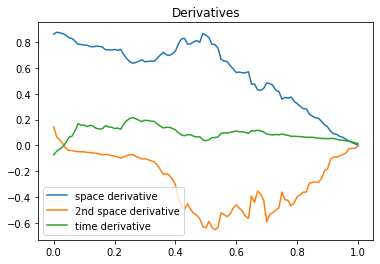

In [20]:
start_time = ttt.time()

for it in range(Epoch):
    seed = it % 100
    path_feed =  Create_paths(seed, M)
    feed_dict = {path: path_feed, time: time_feed}
    sess.run(train_op, feed_dict)

    if (it % 10 == 0): # every 10 epoch print and record
        elapsed = ttt.time() - start_time
        print("{}th Epoch:".format(it+1))
        loss_value = sess.run(loss, feed_dict)
        lr = sess.run(learning_rate)
        loss_test = sess.run(loss, pred_dict)
        print("traing loss is {}, test loss is {}, and learning rate is {}, elapsed is {}.".format(loss_value, loss_test, lr, elapsed))
        print(" ")

        train_loss_list.append(loss_value)
        test_loss_list.append(loss_test)        
        start_time = ttt.time()

    if (it % 100 == 0): # every 100 epoch, show picture

        solution_pred, time_derivative_pred, space_derivative_pred, space_2nd_derivative_pred = sess.run([solution, time_derivative, space_derivative, space_2nd_derivative], pred_dict)
        num_epoches = len(train_loss_list)
        x_axis_epoches = np.linspace(0, num_epoches*10, num_epoches)

        # plot train/test loss 
        plt.plot(x_axis_epoches, train_loss_list, 'b-', label = "train loss")
        plt.plot(x_axis_epoches, test_loss_list, 'c--', label = "test loss")
        plt.legend()
        plt.ylim([0, 0.1])
        plt.title("Total Loss")
        plt.show()
        
        # plot one example path
        plt.plot(t, path_test[1], label = "bm")
        plt.legend()
        plt.title("One Test Path")
        plt.show()
        
        # plot the true solution vs predicted solution
        plt.plot(t, true_solution(path_test[1]), label = "True")
        plt.plot(t, solution_pred[1], 'c--', label = "Pred")
        plt.plot(T, terminal_condition(path_test[1]), "ro", label = "Terminal Value")
        plt.legend()
        plt.title("Corresponding Solution")
        plt.show()
        
        # plot the time and space derivatives.
        plt.plot(np.linspace(0,T, steps+1), space_derivative_pred[1], label = "space derivative")
        plt.plot(np.linspace(0,T, steps+1), space_2nd_derivative_pred[1], label = "2nd space derivative")
        plt.plot(np.linspace(0,T, steps+1), time_derivative_pred[1], label = "time derivative")
        plt.legend()
        plt.title("Derivatives")
        plt.show()
        

## Evaluation

In [0]:
tf.gfile.MkDir("pics") # create new folder called pics

In [0]:
np.save('asian_train_loss_list.npy', train_loss_list)
np.save('asian_test_loss_list.npy', test_loss_list)
np.save('asian_solution_pred.npy', solution_pred)
np.save('asian_space_derivative_pred.npy', space_derivative_pred)
np.save('asian_space_2nd_derivative_pred.npy', space_derivative_pred)
np.save('asian_time_derivative_pred.npy', time_derivative_pred)

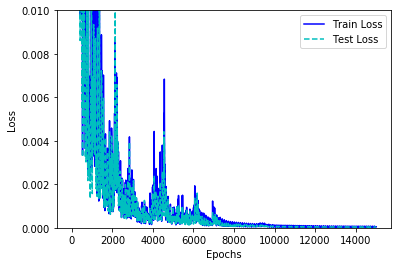

In [23]:
num_epoches = len(train_loss_list)
x_axis_epoches = np.linspace(0, num_epoches*10, num_epoches)
plt.plot(x_axis_epoches, train_loss_list, 'b-', label = "Train Loss")
plt.plot(x_axis_epoches, test_loss_list, 'c--', label = "Test Loss")
plt.legend()
plt.ylim([0, 0.01])
plt.xlabel("Epochs")
plt.ylabel("Loss")

plt.savefig("./pics/geo_asian_loss.pdf")
plt.show()

In [0]:
solution_pred, time_derivative_pred, space_derivative_pred = sess.run([solution, time_derivative, space_derivative], pred_dict)

In [25]:
print(train_loss_list[-5:])
print(test_loss_list[-5:])

[5.6115005e-05, 2.6799295e-05, 4.1215204e-05, 4.9268903e-05, 4.7976235e-05]
[3.3980486e-05, 3.2616837e-05, 3.4178505e-05, 3.3295582e-05, 3.3227883e-05]


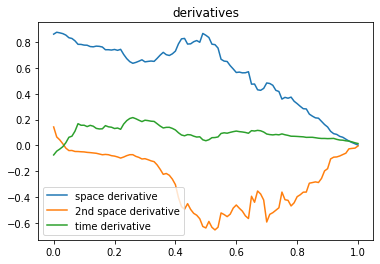

In [26]:
# plot derivatives
plt.plot(t, space_derivative_pred[1], label = "space derivative")
plt.plot(t, space_2nd_derivative_pred[1], label = "2nd space derivative")
plt.plot(t, time_derivative_pred[1], label = "time derivative")
plt.legend()
plt.title("derivatives")
plt.show()

Text(0.5, 1.0, '16 samples of GBMs')

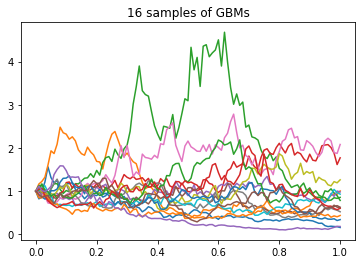

In [27]:
# 16 test paths
for i in range(16):
    plt.plot(t, path_test[i])
plt.title("16 samples of GBMs")

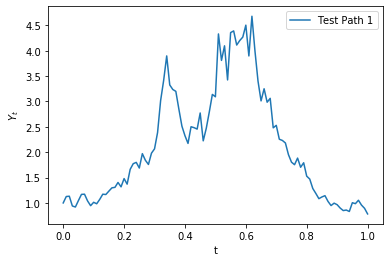

In [28]:
# A sample test path
plt.plot(t, path_test[2], label = "Test Path 1")
plt.xlabel("t")
plt.ylabel(r"$Y_t$")
plt.legend()
plt.savefig("./pics/geo_asian_test1.pdf")


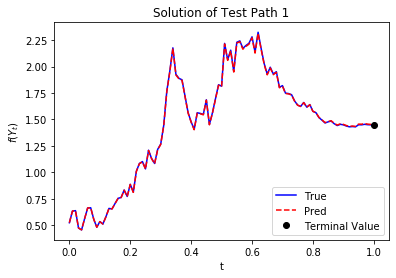

In [29]:
# comparison of true vs predicted solution for the above GBM path
plt.plot(t, true_solution(path_test[2]), "b", label = "True")
plt.plot(t, solution_pred[2], "r--", label = "Pred")
plt.plot(T, terminal_condition(path_test[2]), "ko", label = "Terminal Value")

plt.title(r"Solution of Test Path 1")
plt.xlabel("t")
plt.ylabel(r"$f(Y_t)$")
plt.legend()
plt.savefig("./pics/geo_asian_sol1.pdf")

## Test Another Path

In [0]:
path_test2 = np.tile(np.linspace(1,1e-6, steps+1), (M,1))**2
pred_dict2 = {path: path_test2, time: time_feed}

In [0]:
solution_2, space_derivative_2, time_derivative_2 = sess.run([solution, space_derivative, time_derivative], pred_dict2)

In [32]:
loss_2 = sess.run(loss, pred_dict2)
loss_2

3.781876e-05

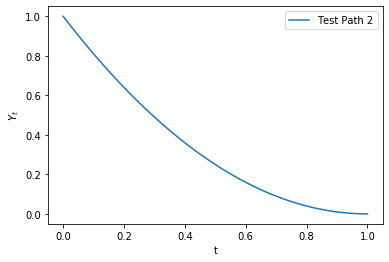

In [33]:
plt.plot(t, path_test2[1], label = "Test Path 2")
plt.legend()
# plt.title("Test Path 2")
plt.xlabel("t")
plt.ylabel(r"$Y_t$")

plt.savefig("./pics/geo_asian_test2.pdf")
plt.show()

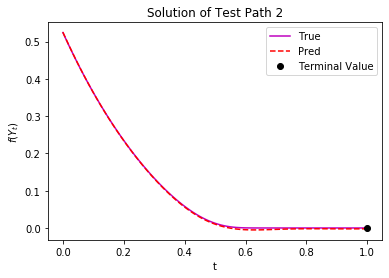

In [34]:
# comparison of true vs predicted solution of this path

plt.plot(t, true_solution(path_test2[1]), "m", label = "True")
plt.plot(t, solution_2[1], "r--", label = "Pred")
plt.plot(T, terminal_condition(path_test2[1]), "ko", label = "Terminal Value")
plt.legend()
plt.xlabel("t")
plt.ylabel(r"$f(Y_t)$")
plt.title("Solution of Test Path 2")
plt.savefig("./pics/geo_asian_sol2.pdf")

In [0]:
## Test Another Path (Random Uniform)

In [0]:
np.random.seed(5)

path_test4 = np.tile(np.random.uniform(1, 3, steps+1), (M,1))
pred_dict4 = {path: path_test4, time: time_feed}

In [0]:
solution_4, space_derivative_4, time_derivative_4 = sess.run([solution, space_derivative, time_derivative], pred_dict4)

In [38]:
loss_4 = sess.run(loss, pred_dict4)
loss_4

0.0046384605

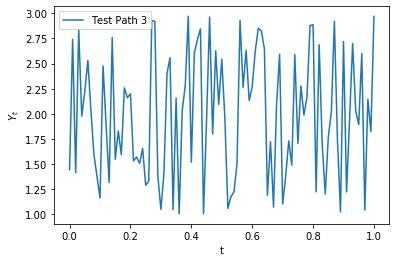

In [39]:
plt.plot(t, path_test4[1], label = "Test Path 3")
plt.legend()
plt.xlabel("t")
plt.ylabel(r"$Y_t$")


plt.savefig("./pics/geo_asian_test3.pdf")
plt.show()

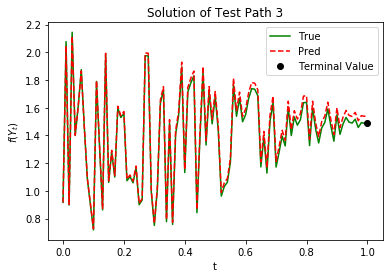

In [40]:
# comparison of true vs predicted solution of this path

plt.plot(t, true_solution(path_test4[1]),"g", label = "True")
plt.plot(t, solution_4[1], "r--", label = "Pred")
plt.plot(T, terminal_condition(path_test4[1]), "ko", label = "Terminal Value")
plt.legend()
plt.xlabel("t")
plt.ylabel(r"$f(Y_t)$")
plt.title("Solution of Test Path 3")
plt.savefig("./pics/geo_asian_sol3.pdf")

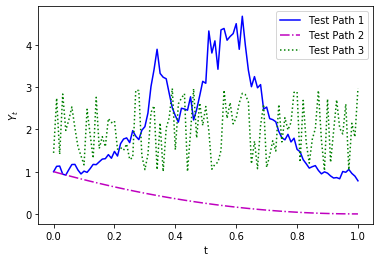

In [41]:
plt.plot(t, path_test[2], "b", label = "Test Path 1")
plt.plot(t, path_test2[1],"m-.", label = "Test Path 2")
plt.plot(t, path_test4[1], "g:", label = "Test Path 3")

plt.xlabel("t")
plt.ylabel("$Y_t$")
plt.legend()
plt.savefig("./pics/geo_asian_paths.pdf")